# Implementation of CNFs

In [22]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [2]:
import sys
N_up = 1
repo_dir = '/'.join(os.getcwd().split('/')[:-N_up])
if repo_dir not in sys.path:
    sys.path.append(repo_dir)

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np

from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from src.cnf import CNF
from torchdiffeq import odeint_adjoint as odeint

import matplotlib.pyplot as plt

from sklearn.datasets import make_moons, make_circles

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Create and train a CNF on the half moons dataset

### Define data

In [8]:
norm = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[1.0, 0.0], [0.0, 1.0]]).to(device))

In [9]:
num_samples = 512

def get_batch(num_samples, ret_classes=False):
    points, classes = make_moons(n_samples=num_samples, noise=0.08)
    x = torch.tensor(points).type(torch.float32).to(device)
    logp_diff_t1 = torch.zeros(num_samples, 1).type(torch.float32).to(device)
    
    if ret_classes:
        return(x, logp_diff_t1, classes)
    return(x, logp_diff_t1)

In [10]:
x_test, logp_diff_t1_test, classes = get_batch(num_samples, True)

In [11]:
t0 = 0
t1 = 10

In [107]:
np.mean(points, axis=0)


array([-3.94771623e-15, -1.01818369e-15])

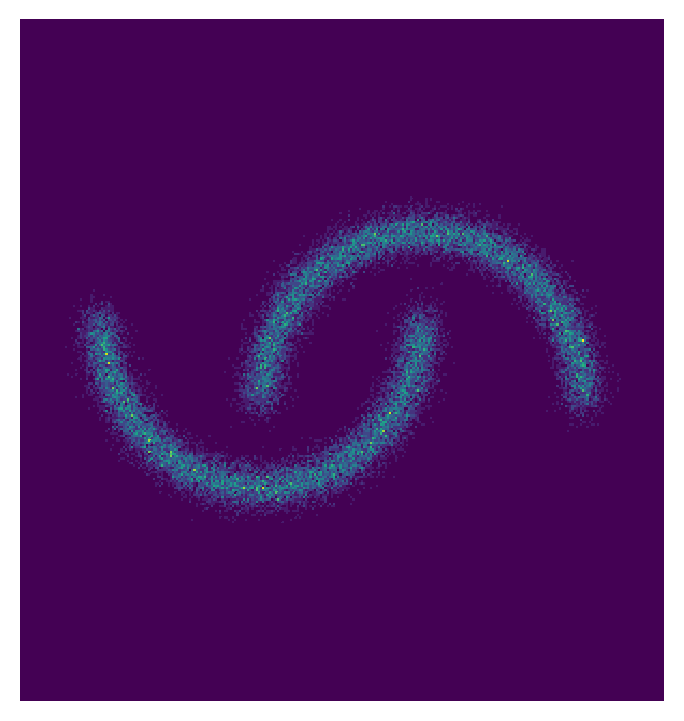

In [23]:
points, _ = make_moons(n_samples=30000, noise=0.07)
points = (points - [0.5, 0.25])
plt.figure(figsize=(4, 4), dpi=200)

plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/moons.jpg",
            pad_inches=0, bbox_inches='tight')

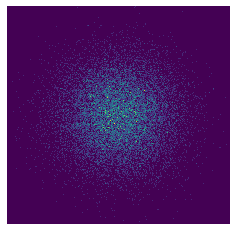

In [141]:
p0 = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[0.3, 0.0], [0.0, 0.3]]).to(device))
points = p0.sample([30000]).detach().cpu().numpy()
plt.figure(figsize=(4, 4))
plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])
# plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()

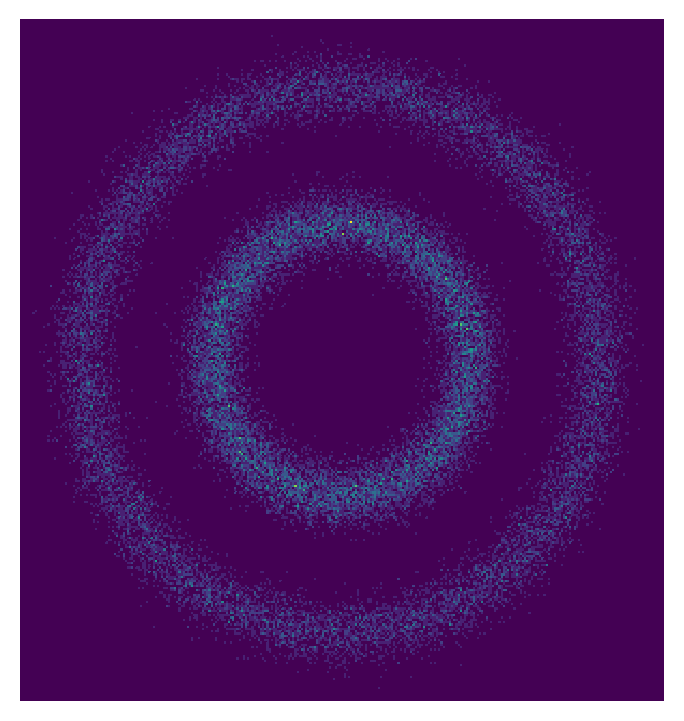

In [22]:
points, _ = make_circles(n_samples=30000, noise=0.06, factor=0.5)
points = points * 2 / 1.25
plt.figure(figsize=(4, 4), dpi=200)

plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/circles.jpg",
            pad_inches=0, bbox_inches='tight')

### Define model

In [11]:
odefunc = CNF(in_out_dim=2, hidden_dim=32, width=64)
# ^ have to guess hidden_dim

if device != "cpu":
    odefunc = odefunc.cuda()

In [12]:
optimizer = optim.Adam(odefunc.parameters(), lr=1e-3, weight_decay=0.)
# have to guess the LR (should check FFJORD paper)

In [13]:
def calc_loss(x, logp_diff_t1):
    z_t, logp_diff_t = odeint(
            odefunc,
            (x, logp_diff_t1),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

    z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]

#     loss = -logp_diff_t0 - pz0(z_t0)
#     loss = -pz0(z_t0) + logp_diff_t0
    
    logp_x =  norm.log_prob(z_t0).to(device) - logp_diff_t0.view(-1)
    
    loss = -logp_x.mean(0)

    return loss

### Train

  0%|          | 0/1100 [00:00<?, ?it/s]

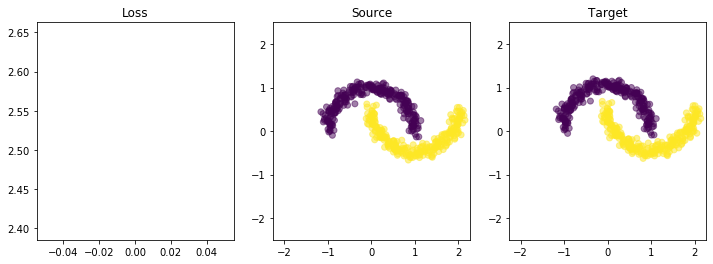

  1%|          | 10/1100 [00:04<07:12,  2.52it/s]

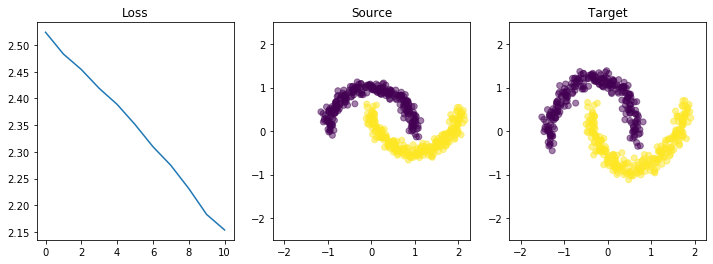

  2%|▏         | 20/1100 [00:08<06:54,  2.60it/s]

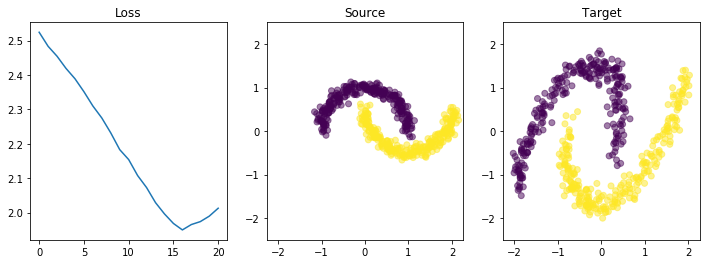

  3%|▎         | 30/1100 [00:12<07:00,  2.55it/s]

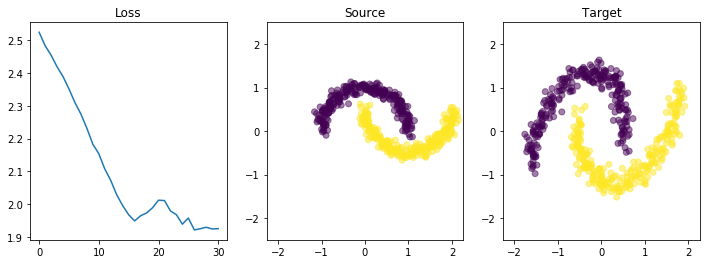

  4%|▎         | 40/1100 [00:17<07:21,  2.40it/s]

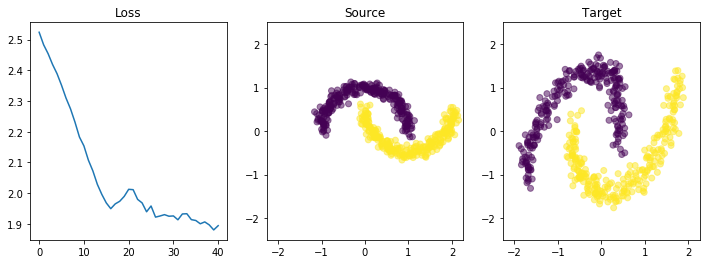

  5%|▍         | 50/1100 [00:22<07:09,  2.45it/s]

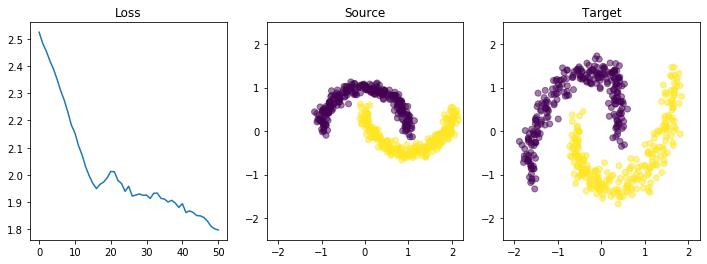

  5%|▌         | 60/1100 [00:26<07:24,  2.34it/s]

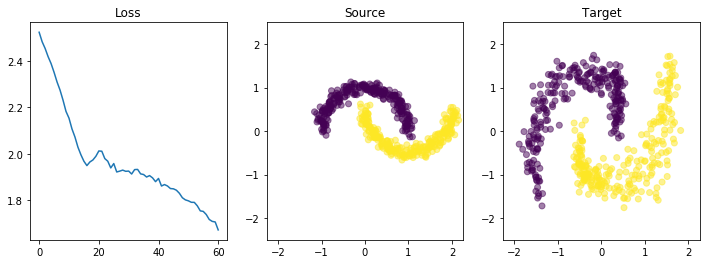

  6%|▋         | 70/1100 [00:31<07:36,  2.26it/s]

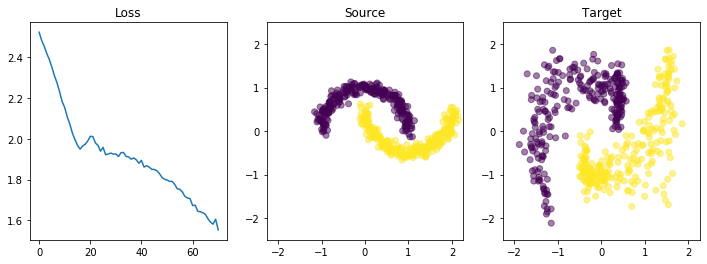

  7%|▋         | 80/1100 [00:36<08:15,  2.06it/s]

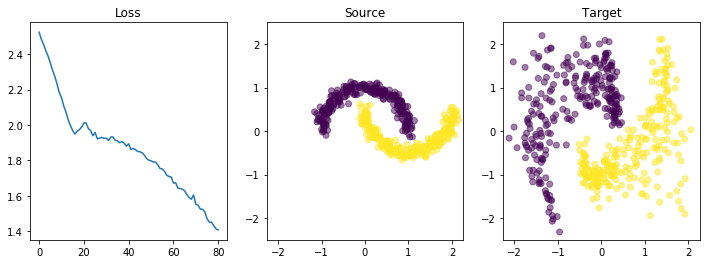

  8%|▊         | 90/1100 [00:42<08:32,  1.97it/s]

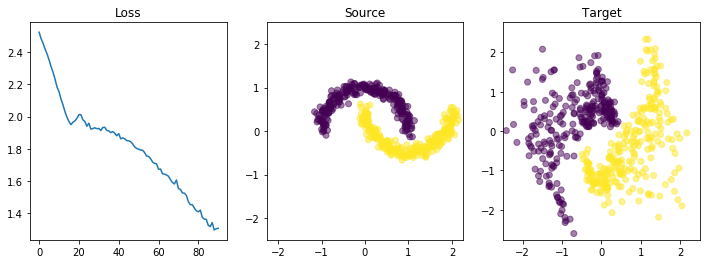

  9%|▉         | 100/1100 [00:48<08:29,  1.96it/s]

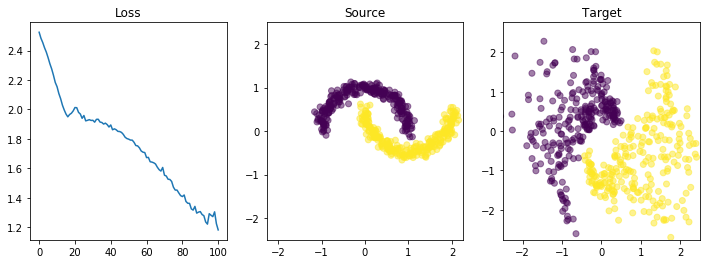

 10%|█         | 110/1100 [00:54<08:45,  1.88it/s]

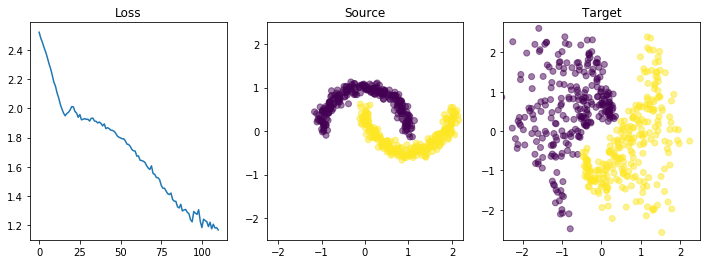

 11%|█         | 120/1100 [00:59<08:43,  1.87it/s]

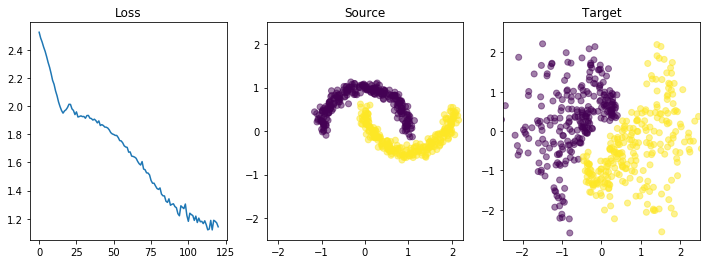

 12%|█▏        | 130/1100 [01:05<08:42,  1.86it/s]

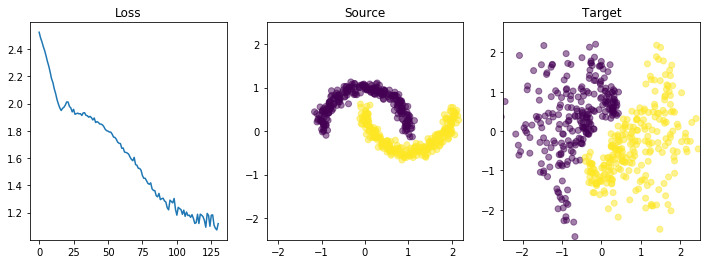

 13%|█▎        | 140/1100 [01:11<08:31,  1.88it/s]

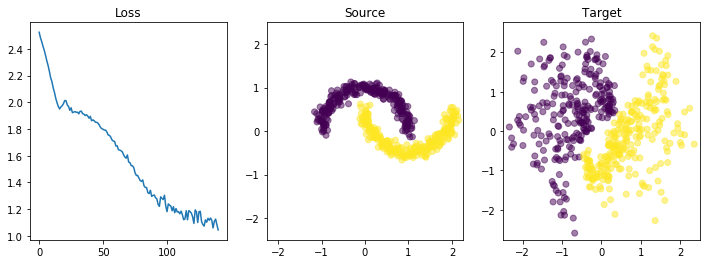

 14%|█▎        | 150/1100 [01:17<08:41,  1.82it/s]

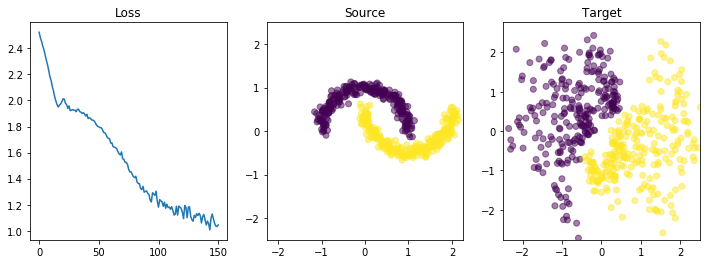

 15%|█▍        | 160/1100 [01:24<08:40,  1.81it/s]

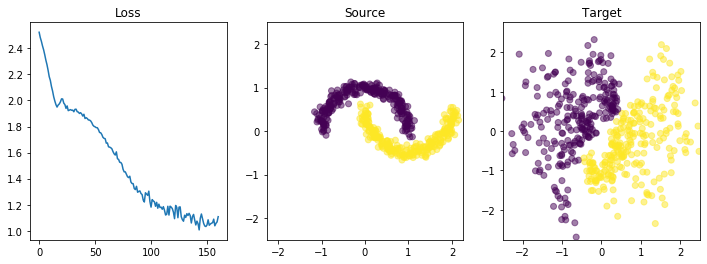

 15%|█▌        | 170/1100 [01:29<08:14,  1.88it/s]

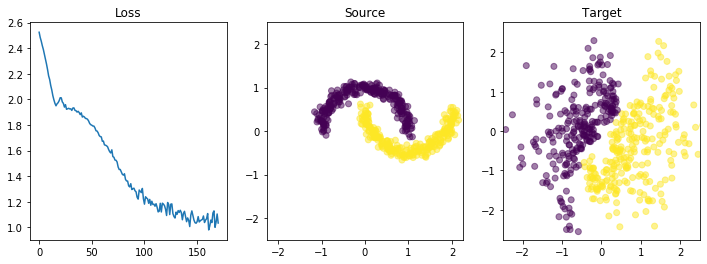

 16%|█▋        | 180/1100 [01:35<08:21,  1.83it/s]

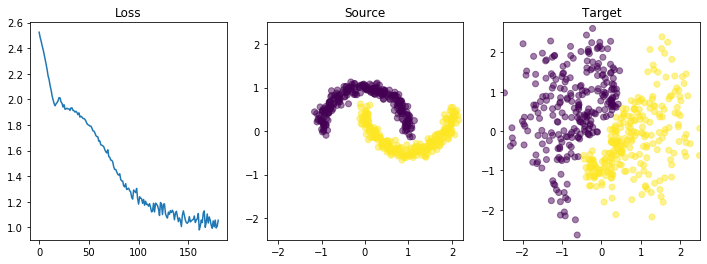

 17%|█▋        | 190/1100 [01:41<08:06,  1.87it/s]

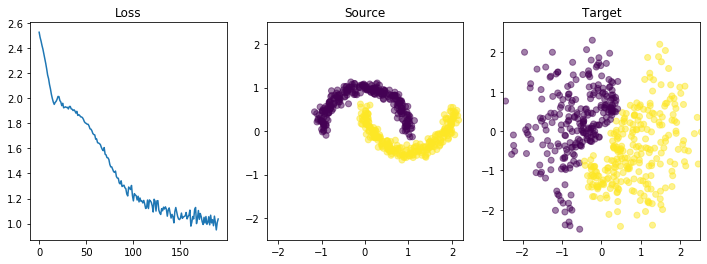

 18%|█▊        | 200/1100 [01:47<08:03,  1.86it/s]

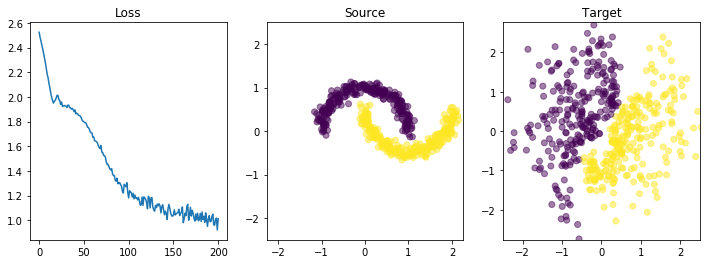

 19%|█▉        | 210/1100 [01:53<08:07,  1.82it/s]

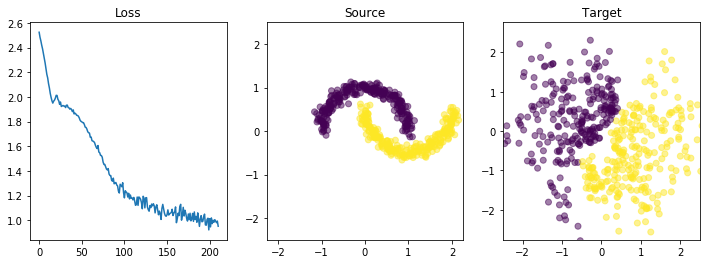

 20%|██        | 220/1100 [01:59<08:13,  1.78it/s]

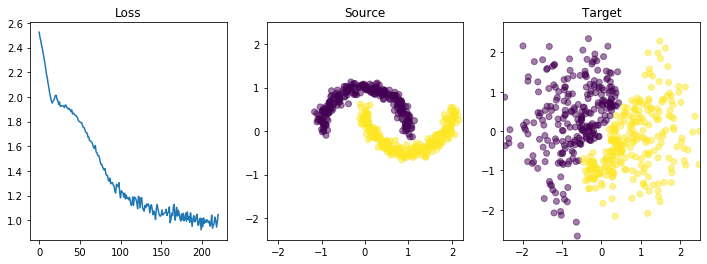

 21%|██        | 230/1100 [02:06<08:29,  1.71it/s]

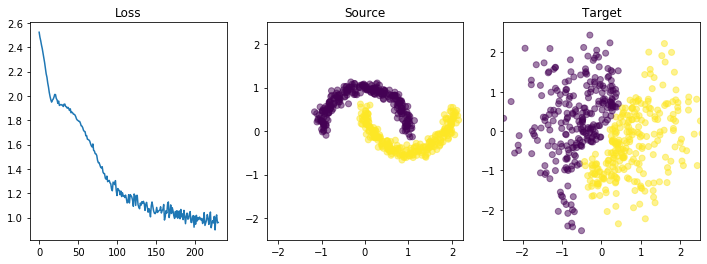

 22%|██▏       | 240/1100 [02:12<08:18,  1.72it/s]

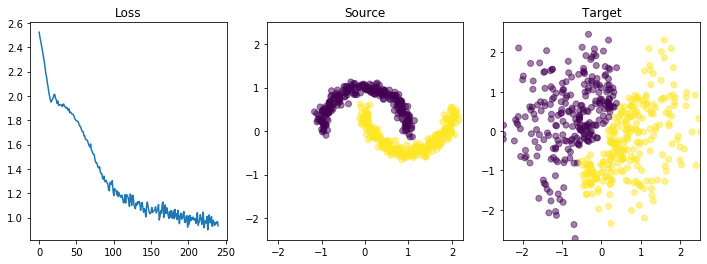

 23%|██▎       | 250/1100 [02:19<08:22,  1.69it/s]

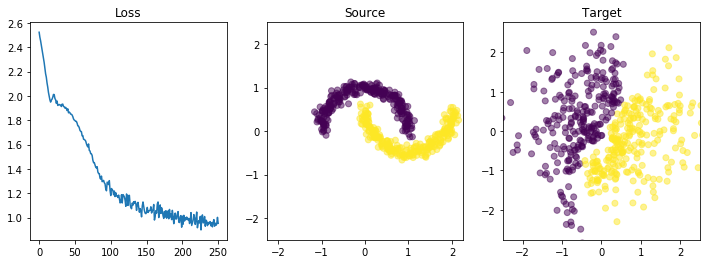

 24%|██▎       | 260/1100 [02:25<08:12,  1.70it/s]

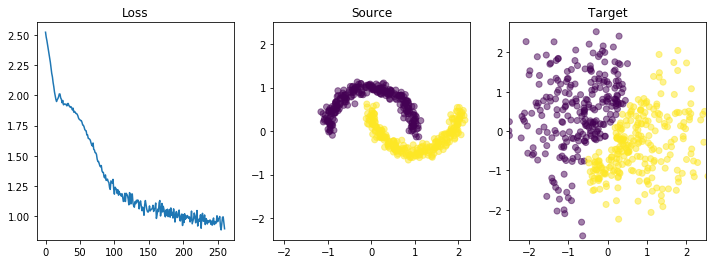

 25%|██▍       | 270/1100 [02:32<08:26,  1.64it/s]

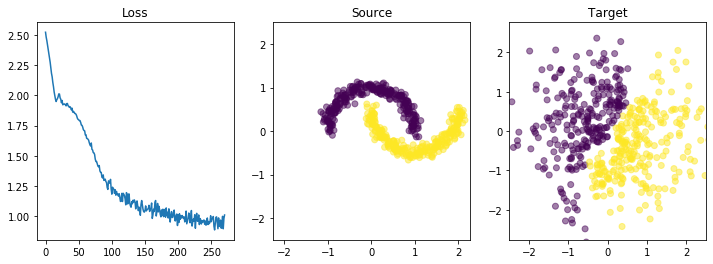

 25%|██▌       | 280/1100 [02:38<08:08,  1.68it/s]

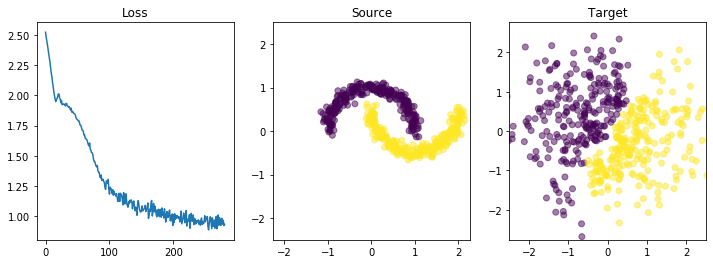

 26%|██▋       | 290/1100 [02:45<08:17,  1.63it/s]

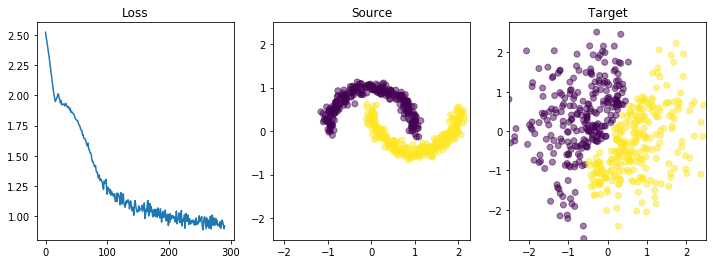

 27%|██▋       | 300/1100 [02:52<08:16,  1.61it/s]

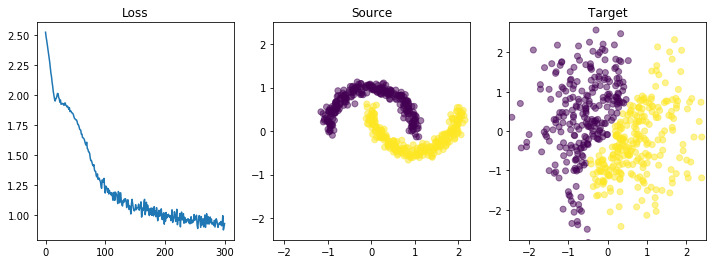

 28%|██▊       | 310/1100 [02:59<08:24,  1.57it/s]

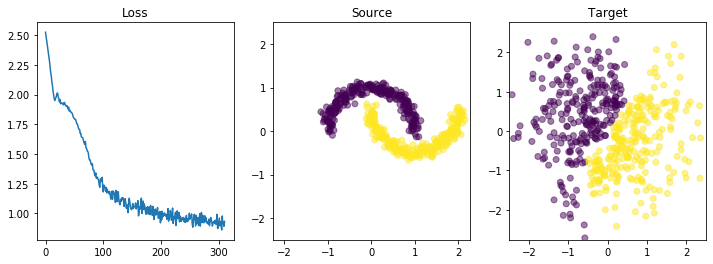

 29%|██▉       | 320/1100 [03:06<08:03,  1.61it/s]

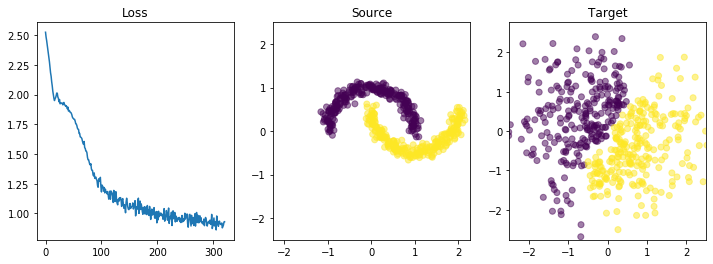

 30%|███       | 330/1100 [03:12<08:12,  1.56it/s]

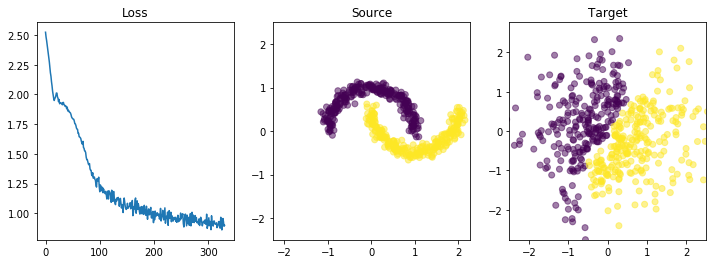

 31%|███       | 340/1100 [03:20<08:23,  1.51it/s]

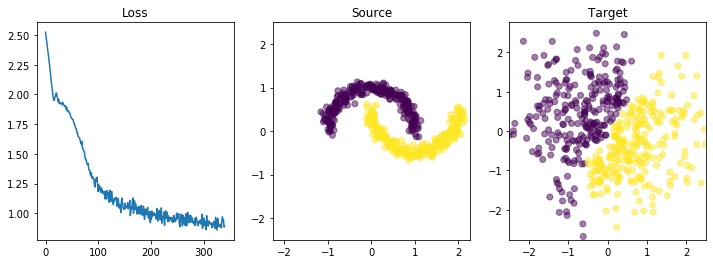

 32%|███▏      | 350/1100 [03:27<08:31,  1.47it/s]

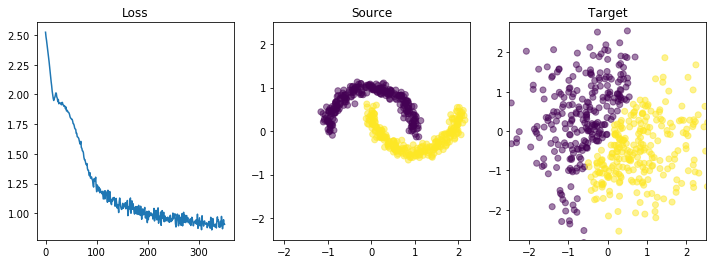

 33%|███▎      | 360/1100 [03:35<08:10,  1.51it/s]

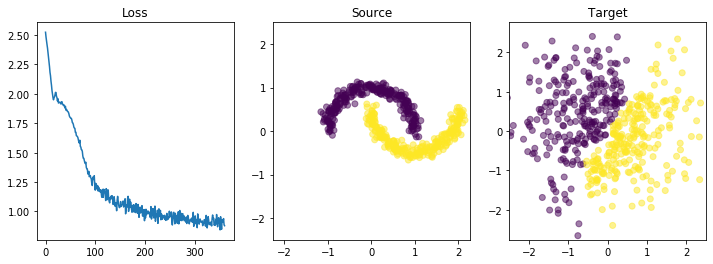

 34%|███▎      | 370/1100 [03:42<08:14,  1.48it/s]

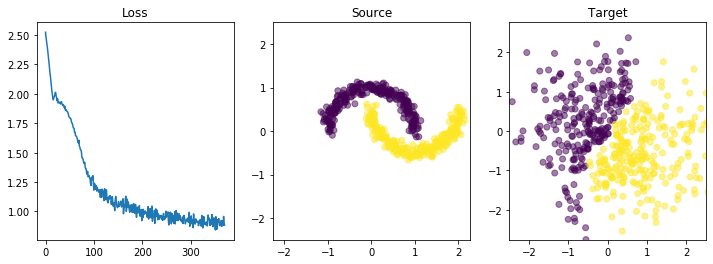

 35%|███▍      | 380/1100 [03:49<08:11,  1.46it/s]

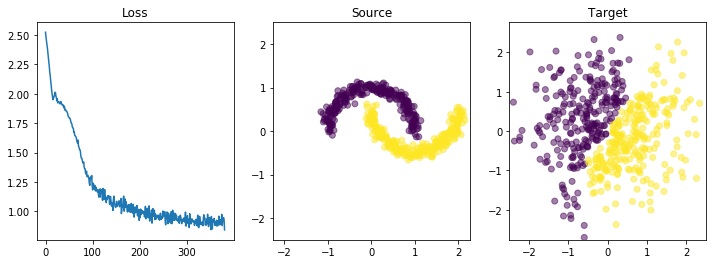

 35%|███▌      | 390/1100 [03:57<08:04,  1.46it/s]

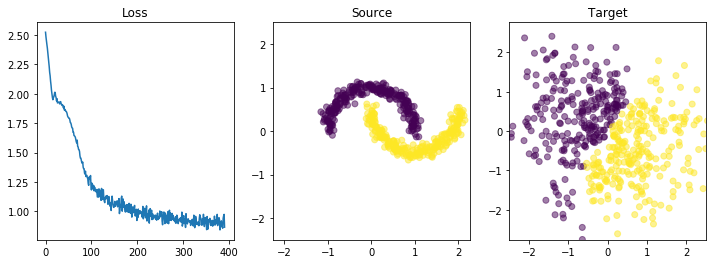

 36%|███▋      | 400/1100 [04:04<08:00,  1.46it/s]

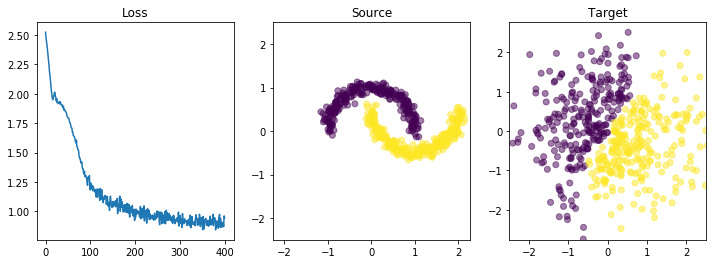

 37%|███▋      | 410/1100 [04:12<08:01,  1.43it/s]

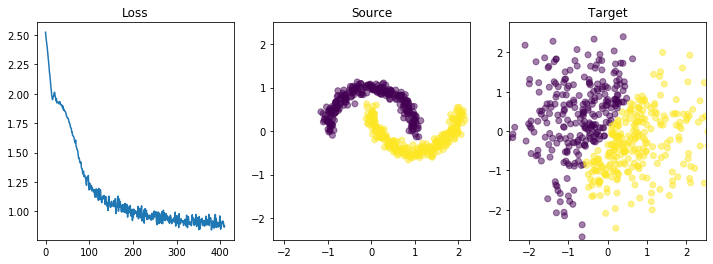

 38%|███▊      | 420/1100 [04:19<07:51,  1.44it/s]

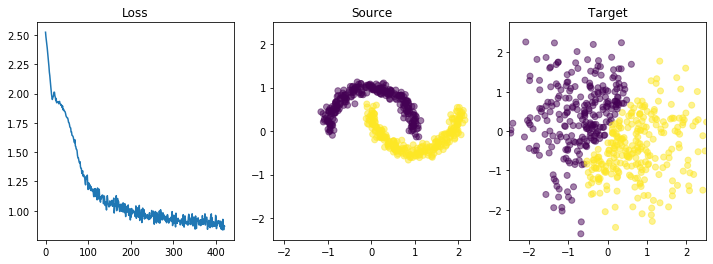

 39%|███▉      | 430/1100 [04:27<08:12,  1.36it/s]

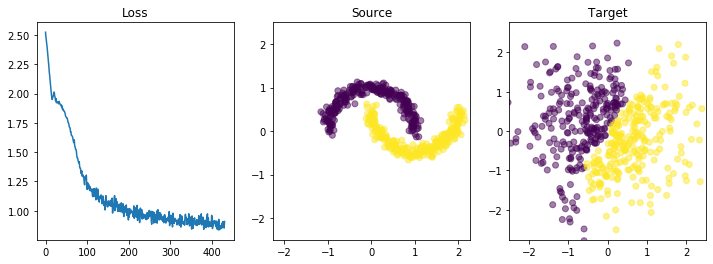

 40%|████      | 440/1100 [04:35<07:59,  1.38it/s]

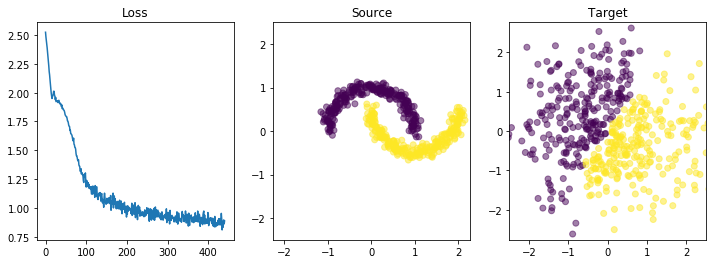

 41%|████      | 450/1100 [04:43<07:26,  1.46it/s]

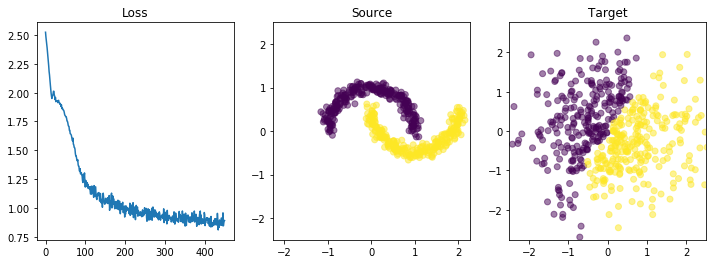

 42%|████▏     | 460/1100 [04:51<07:39,  1.39it/s]

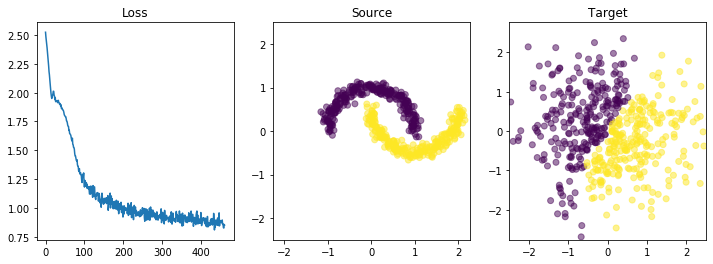

 43%|████▎     | 470/1100 [04:59<07:48,  1.35it/s]

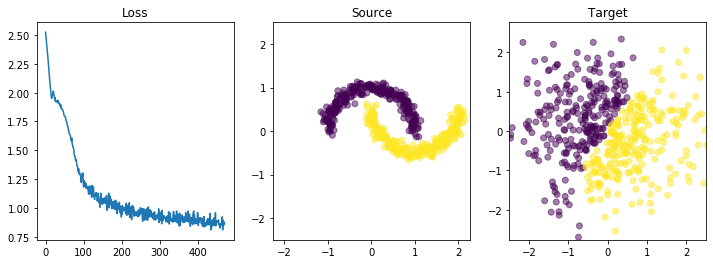

 44%|████▎     | 480/1100 [05:07<07:47,  1.33it/s]

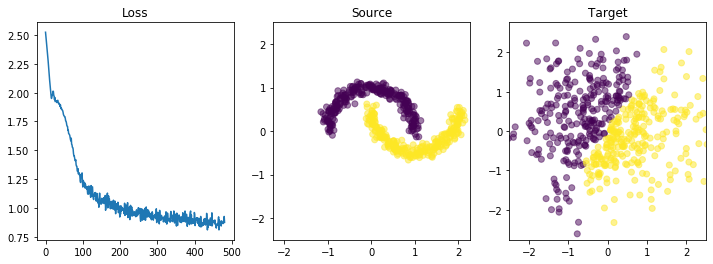

 45%|████▍     | 490/1100 [05:15<07:48,  1.30it/s]

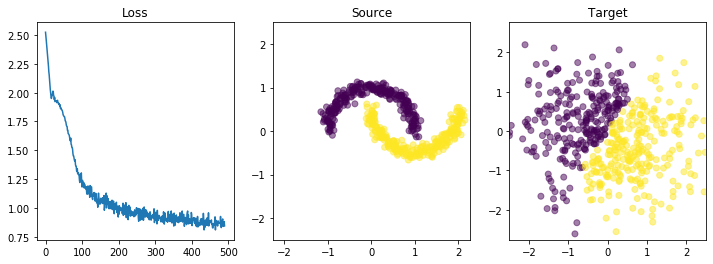

 45%|████▌     | 500/1100 [05:24<07:38,  1.31it/s]

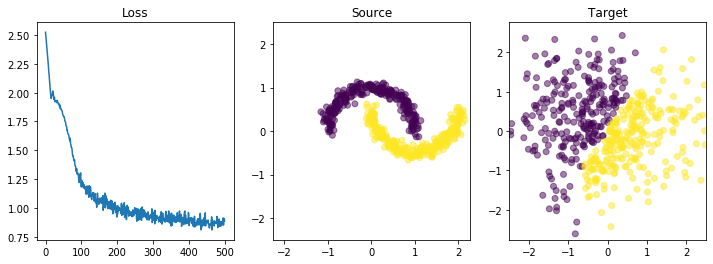

 46%|████▋     | 510/1100 [05:32<07:25,  1.32it/s]

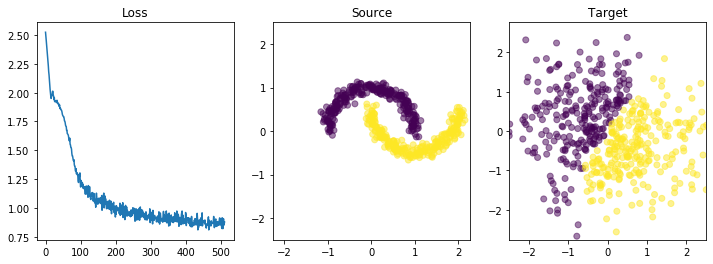

 47%|████▋     | 520/1100 [05:41<07:31,  1.28it/s]

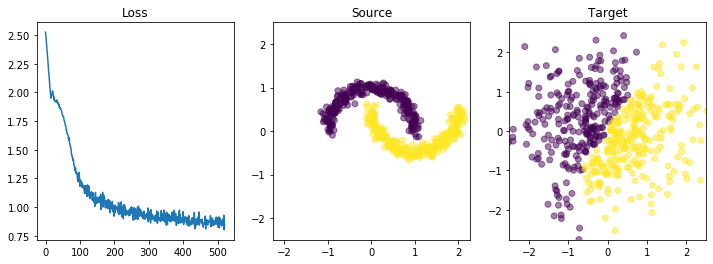

 48%|████▊     | 530/1100 [05:49<07:18,  1.30it/s]

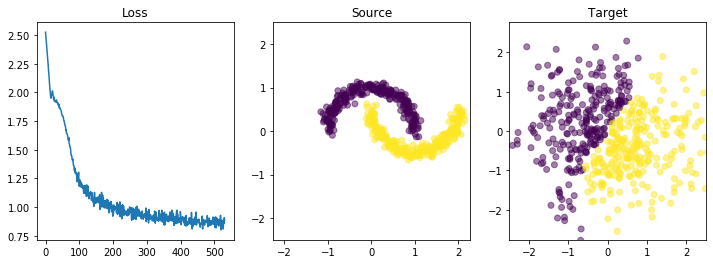

 49%|████▉     | 540/1100 [05:58<07:42,  1.21it/s]

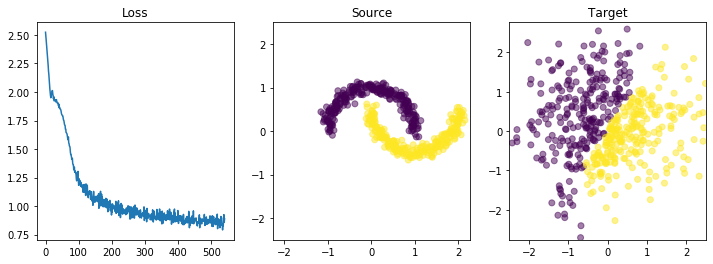

 50%|█████     | 550/1100 [06:06<07:23,  1.24it/s]

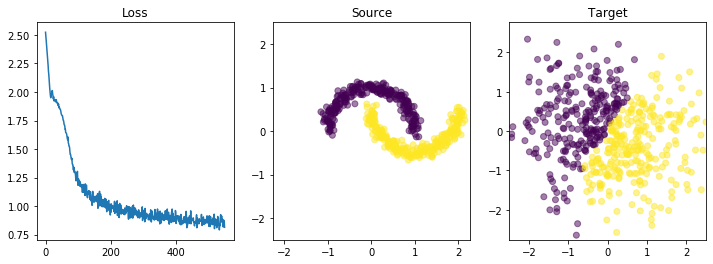

 51%|█████     | 560/1100 [06:15<07:23,  1.22it/s]

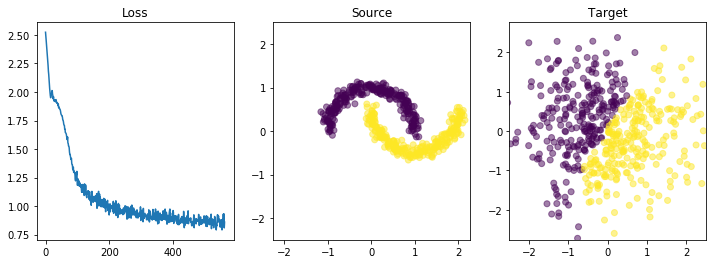

 52%|█████▏    | 570/1100 [06:24<07:20,  1.20it/s]

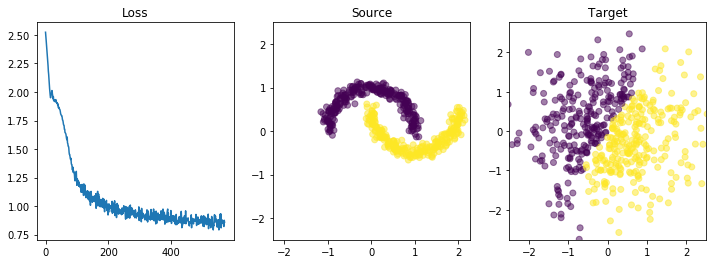

 53%|█████▎    | 580/1100 [06:33<07:09,  1.21it/s]

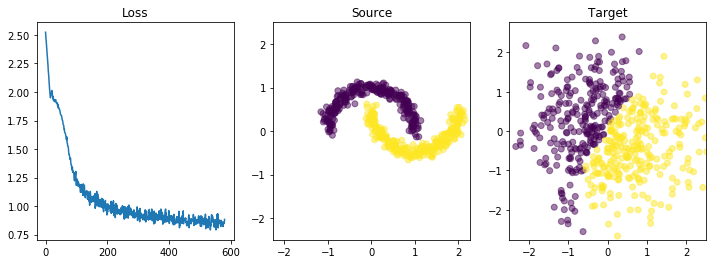

 54%|█████▎    | 590/1100 [06:42<07:03,  1.20it/s]

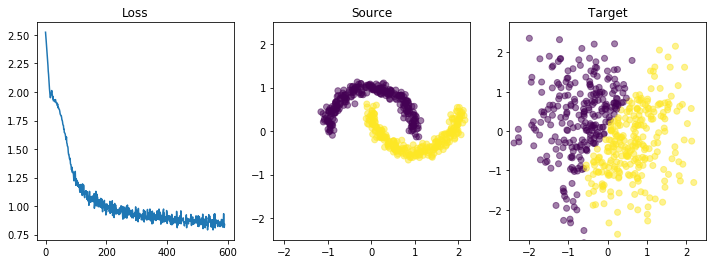

 55%|█████▍    | 600/1100 [06:51<06:52,  1.21it/s]

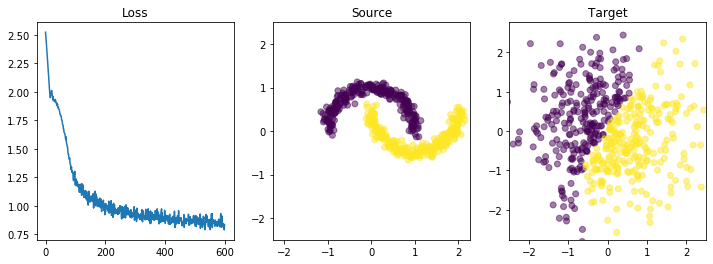

 55%|█████▌    | 610/1100 [07:00<06:52,  1.19it/s]

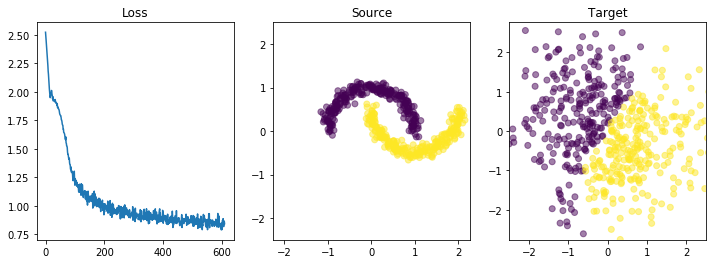

 56%|█████▋    | 620/1100 [07:09<06:25,  1.24it/s]

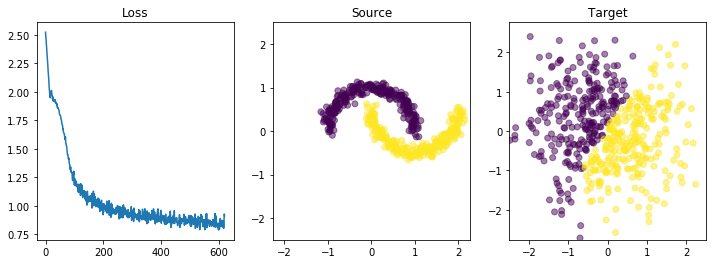

 57%|█████▋    | 630/1100 [07:18<06:39,  1.18it/s]

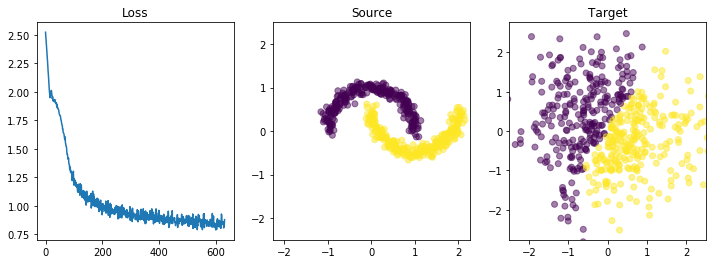

 58%|█████▊    | 640/1100 [07:28<06:43,  1.14it/s]

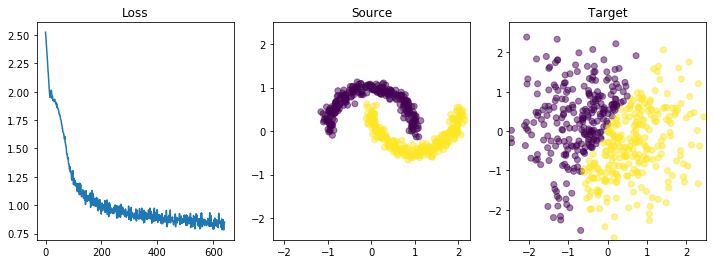

 59%|█████▉    | 650/1100 [07:37<06:32,  1.15it/s]

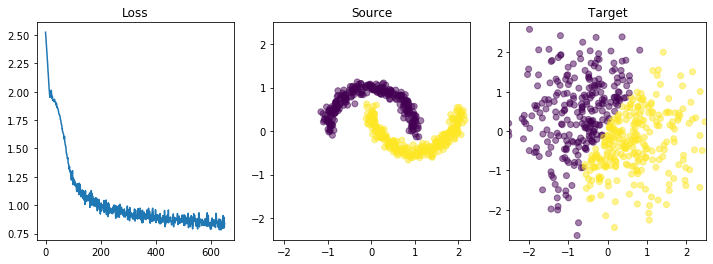

 60%|██████    | 660/1100 [07:46<06:11,  1.18it/s]

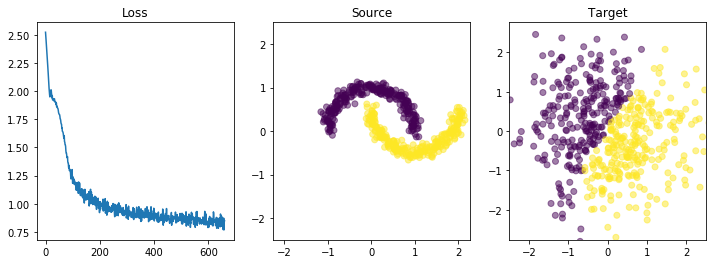

 61%|██████    | 670/1100 [07:56<06:12,  1.15it/s]

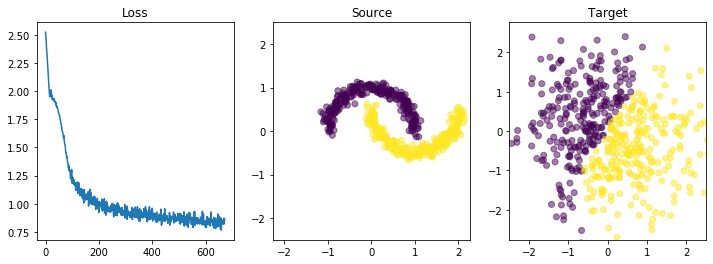

 62%|██████▏   | 680/1100 [08:05<06:03,  1.16it/s]

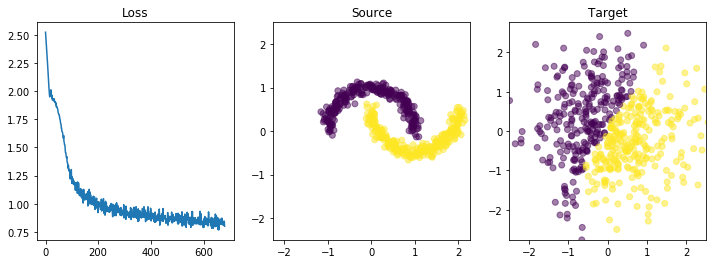

 63%|██████▎   | 690/1100 [08:15<06:09,  1.11it/s]

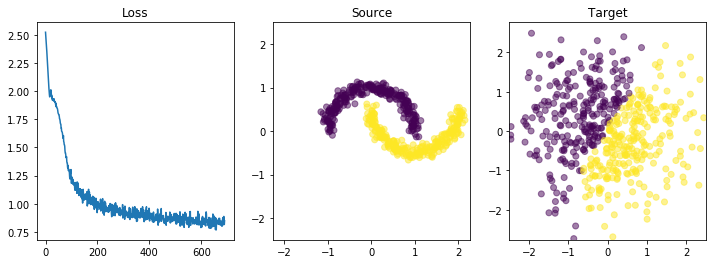

 64%|██████▎   | 700/1100 [08:24<05:53,  1.13it/s]

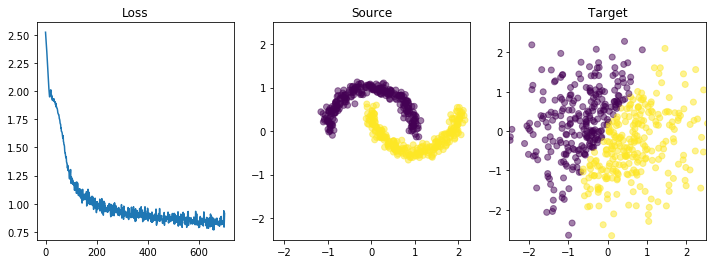

 65%|██████▍   | 710/1100 [08:33<05:42,  1.14it/s]

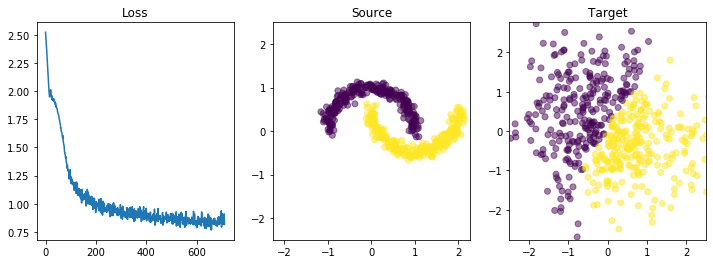

 65%|██████▌   | 720/1100 [08:43<06:01,  1.05it/s]

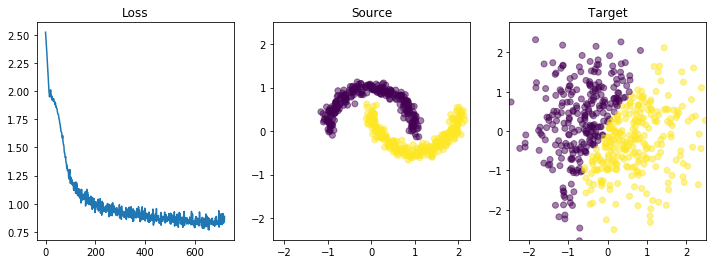

 66%|██████▋   | 730/1100 [08:53<05:37,  1.10it/s]

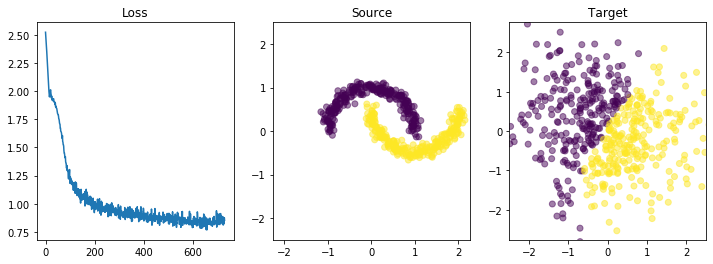

 67%|██████▋   | 740/1100 [09:03<05:23,  1.11it/s]

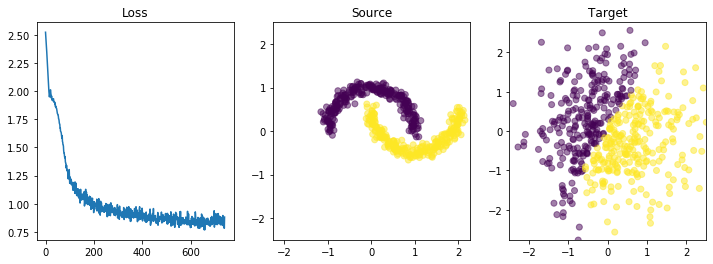

 68%|██████▊   | 750/1100 [09:12<05:03,  1.15it/s]

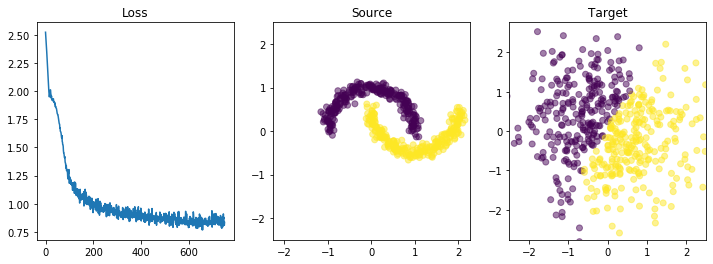

 69%|██████▉   | 760/1100 [09:22<05:04,  1.12it/s]

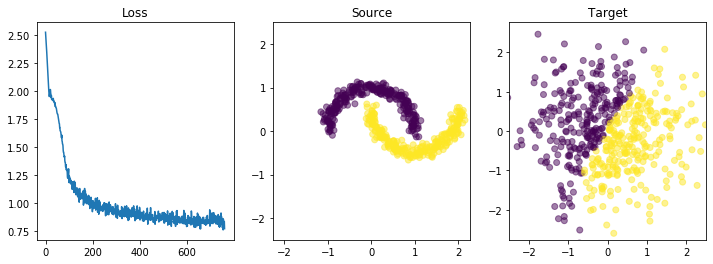

 70%|███████   | 770/1100 [09:32<04:53,  1.13it/s]

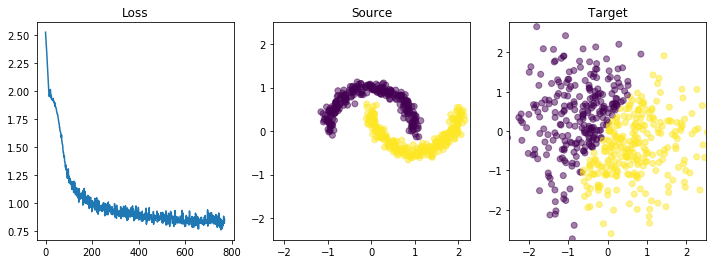

 71%|███████   | 780/1100 [09:42<05:11,  1.03it/s]

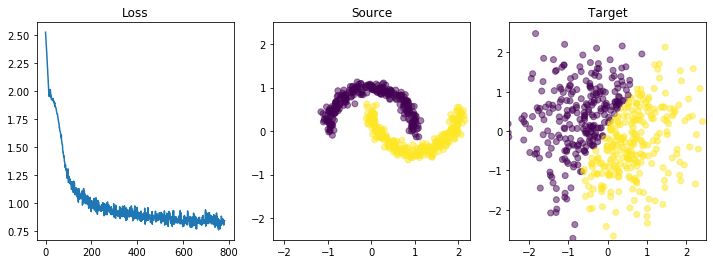

 72%|███████▏  | 790/1100 [09:52<04:52,  1.06it/s]

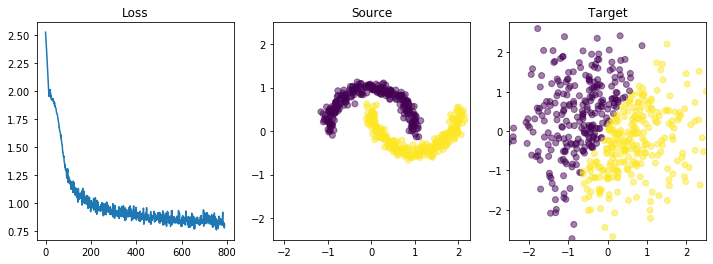

 73%|███████▎  | 800/1100 [10:02<04:36,  1.09it/s]

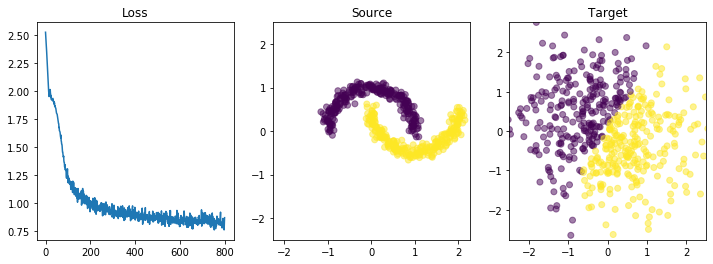

 74%|███████▎  | 810/1100 [10:12<04:38,  1.04it/s]

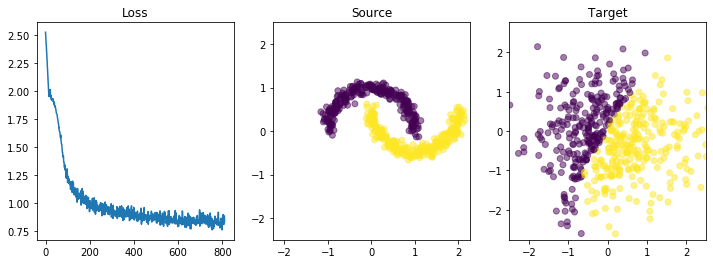

 75%|███████▍  | 820/1100 [10:22<04:30,  1.03it/s]

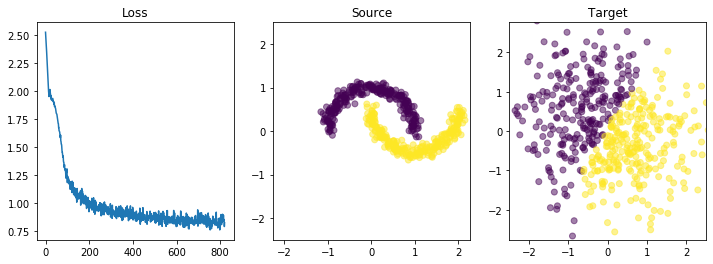

 75%|███████▌  | 830/1100 [10:32<04:16,  1.05it/s]

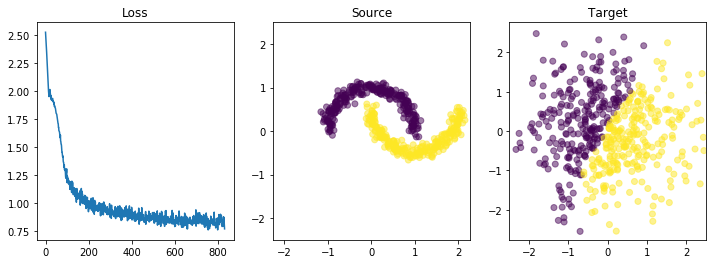

 76%|███████▋  | 840/1100 [10:42<04:05,  1.06it/s]

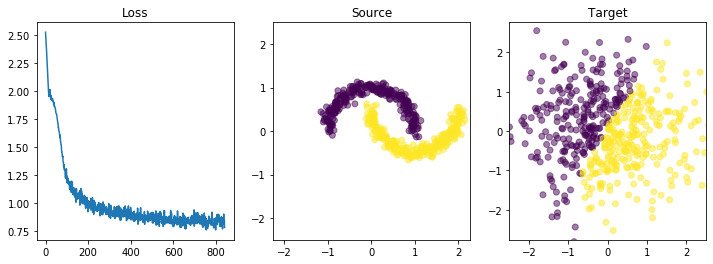

 77%|███████▋  | 850/1100 [10:52<03:50,  1.09it/s]

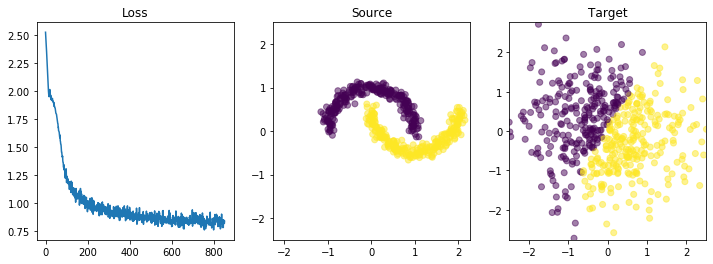

 78%|███████▊  | 860/1100 [11:03<03:46,  1.06it/s]

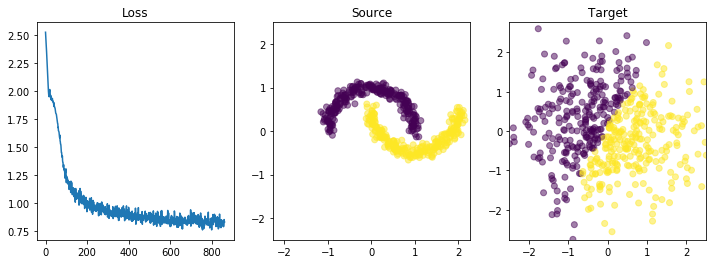

 79%|███████▉  | 870/1100 [11:13<03:37,  1.06it/s]

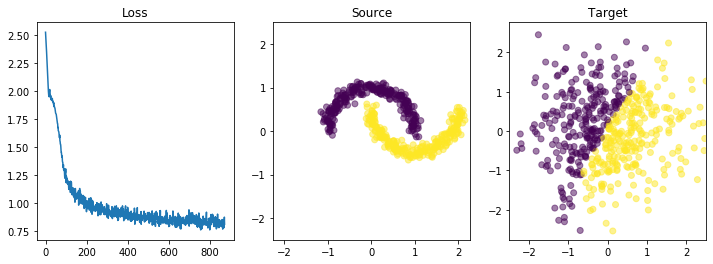

 80%|████████  | 880/1100 [11:23<03:29,  1.05it/s]

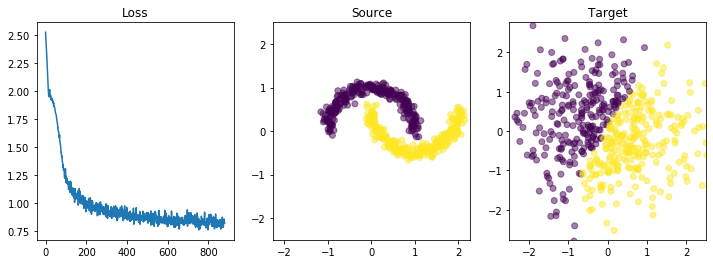

 81%|████████  | 890/1100 [11:34<03:26,  1.02it/s]

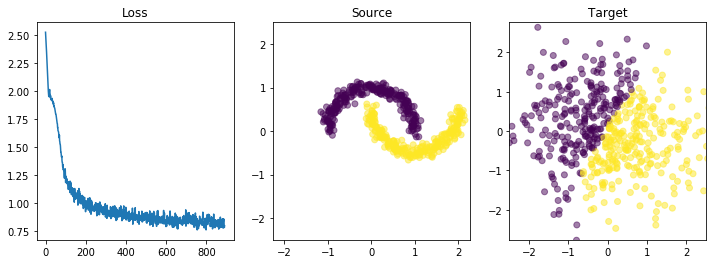

 82%|████████▏ | 900/1100 [11:44<03:14,  1.03it/s]

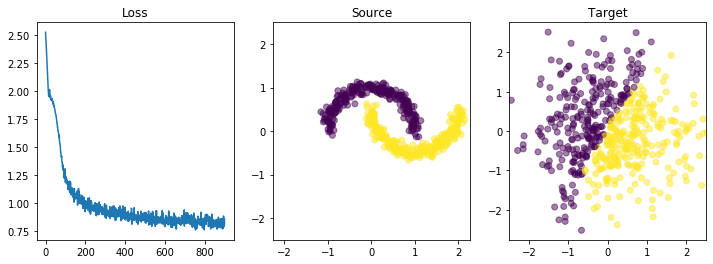

 83%|████████▎ | 910/1100 [11:54<02:59,  1.06it/s]

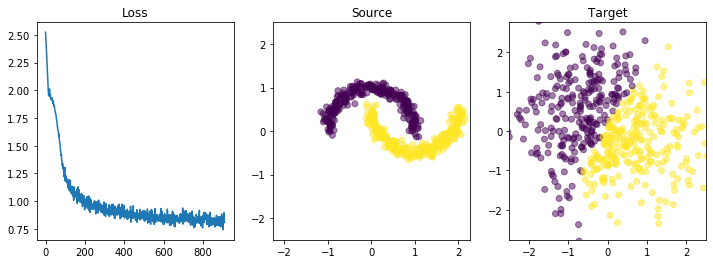

 84%|████████▎ | 920/1100 [12:04<02:56,  1.02it/s]

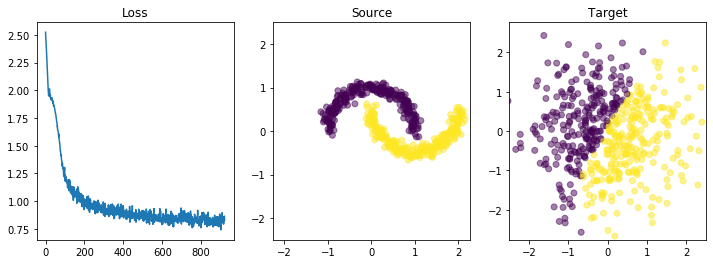

 85%|████████▍ | 930/1100 [12:15<02:37,  1.08it/s]

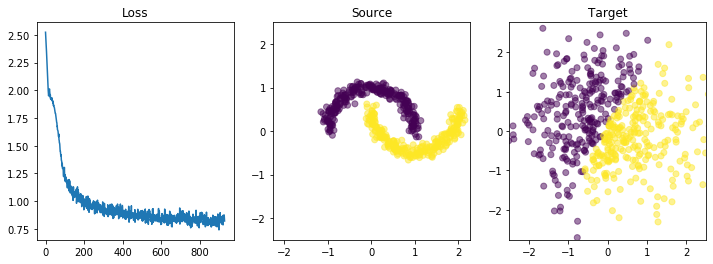

 85%|████████▌ | 940/1100 [12:25<02:37,  1.02it/s]

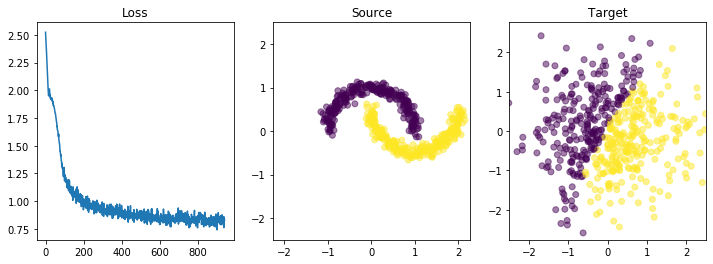

 86%|████████▋ | 950/1100 [12:35<02:29,  1.00it/s]

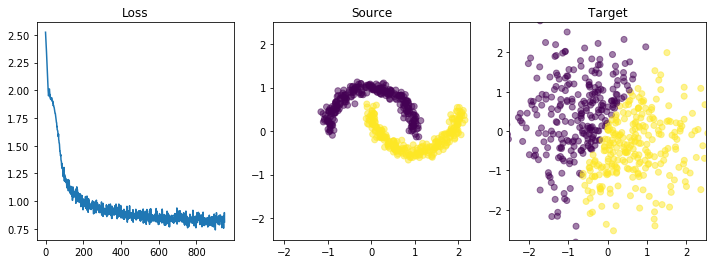

 87%|████████▋ | 960/1100 [12:46<02:12,  1.06it/s]

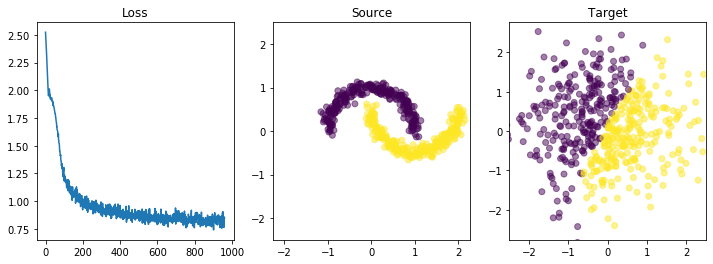

 88%|████████▊ | 970/1100 [12:56<02:09,  1.00it/s]

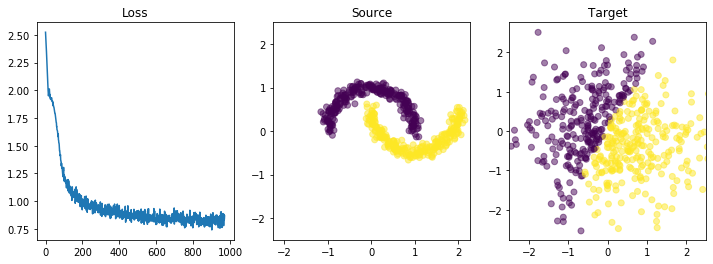

 89%|████████▉ | 980/1100 [13:06<01:55,  1.04it/s]

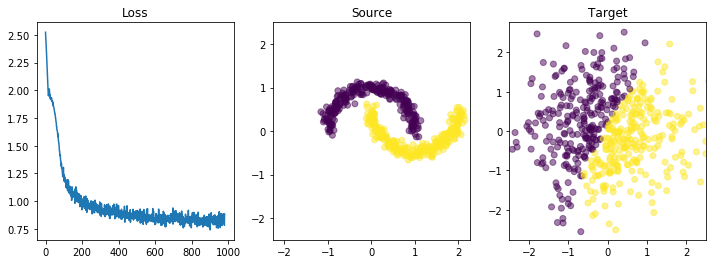

 90%|█████████ | 990/1100 [13:17<01:44,  1.05it/s]

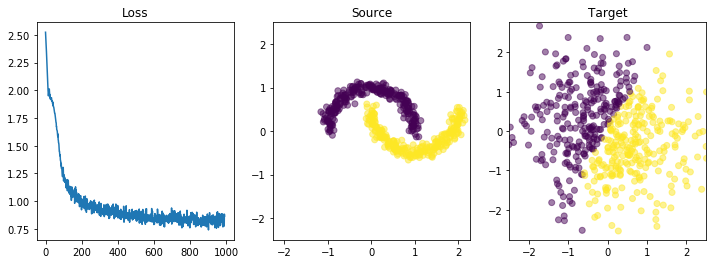

 91%|█████████ | 1000/1100 [13:27<01:36,  1.03it/s]

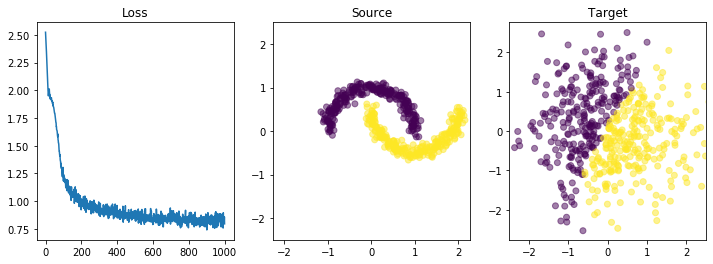

 92%|█████████▏| 1010/1100 [13:37<01:26,  1.04it/s]

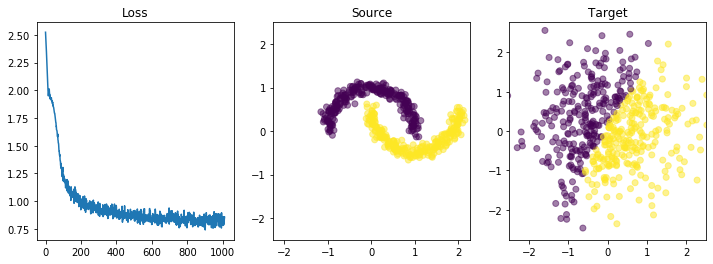

 93%|█████████▎| 1020/1100 [13:48<01:17,  1.03it/s]

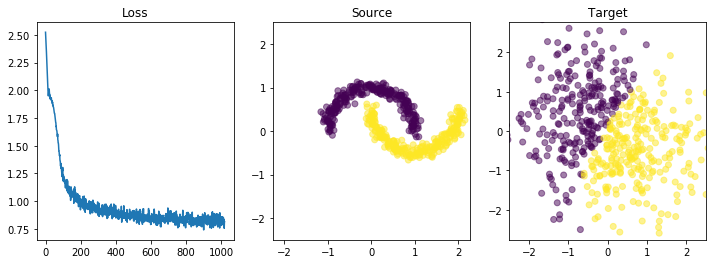

 94%|█████████▎| 1030/1100 [13:58<01:04,  1.08it/s]

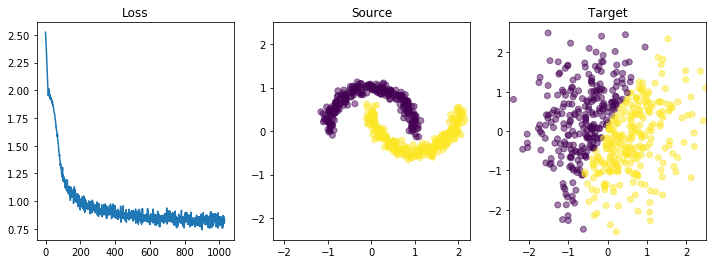

 95%|█████████▍| 1040/1100 [14:09<00:56,  1.06it/s]

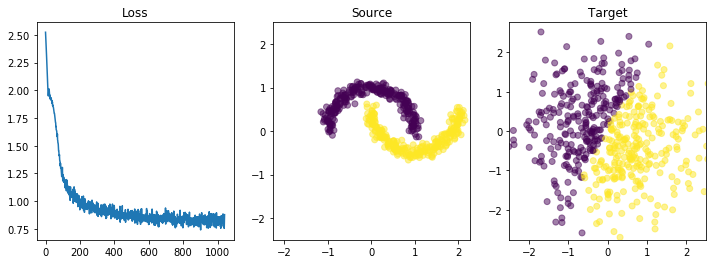

 95%|█████████▌| 1050/1100 [14:19<00:48,  1.04it/s]

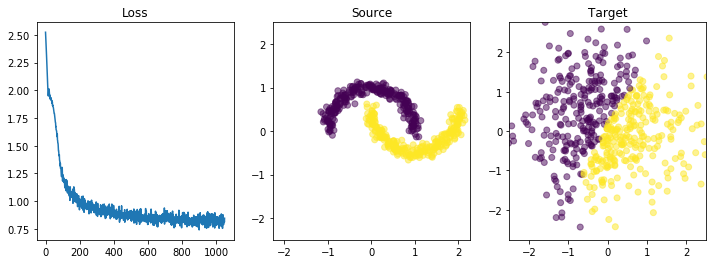

 96%|█████████▋| 1060/1100 [14:29<00:38,  1.03it/s]

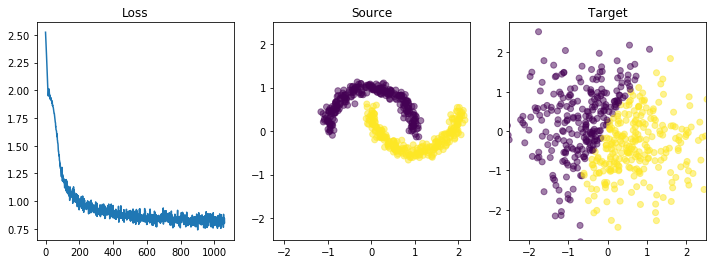

 97%|█████████▋| 1070/1100 [14:40<00:28,  1.04it/s]

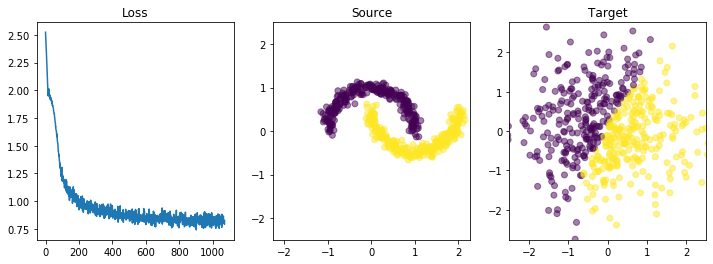

 98%|█████████▊| 1080/1100 [14:50<00:20,  1.00s/it]

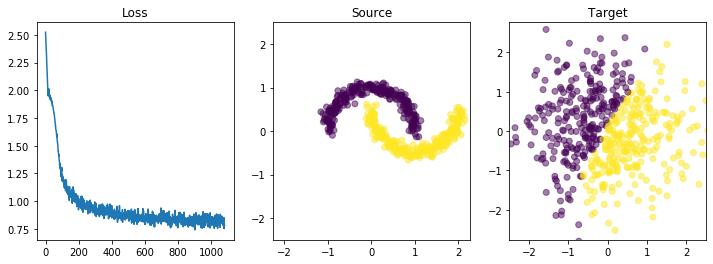

 99%|█████████▉| 1090/1100 [15:01<00:09,  1.01it/s]

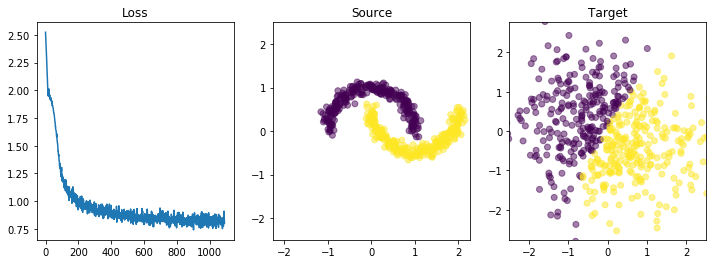

100%|██████████| 1100/1100 [15:11<00:00,  1.21it/s]


In [14]:
loss_history = []
for step in tqdm(range(1100)):
    # ^ should actuall train for 10k iters for paper
    optimizer.zero_grad()
    
    x, logp_diff_t1 = get_batch(num_samples)
    
    loss = calc_loss(x, logp_diff_t1)
    loss_history.append(loss.item())
    
    loss.backward()
    optimizer.step()
    
    if step % 10 == 0:
        z_t, logp_diff_t = odeint(
            odefunc,
            (x_test, logp_diff_t1_test),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(131)
        plt.title("Loss")
        plt.plot(loss_history)
        
        plt.subplot(132)
        plt.title("Source")
        plt.scatter(*x_test.detach().cpu().numpy().T, c=classes, alpha=0.5)   
        plt.axis("equal")
        plt.xlim([-2.5, 2.5])
        plt.ylim([-2.5, 2.5])
        
        plt.subplot(133)        
        plt.title("Target")
        plt.scatter(*z_t0.detach().cpu().numpy().T, c=classes, alpha=0.5)   
        plt.axis("equal")        
        plt.xlim([-2.5, 2.5])
        plt.ylim([-2.5, 2.5])
        
        plt.savefig(f"cnfs/training/step_{1000 + step}.jpg")
        plt.show()
        plt.clf()
        plt.cla()
        plt.close()

### Test reconstruction of points: two moons -> gaussian -> two moons

In [15]:
# forward -> backward
z_t, logp_diff_t = odeint(
    odefunc,
    (x_test, logp_diff_t1_test),
    torch.tensor([t1, t0]).type(torch.float32).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)
z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]

z_t, _ = odeint(
    odefunc,
    (z_t0, logp_diff_t0),
    torch.tensor([t0, t1]).type(torch.float32).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

x_recon = z_t[-1]

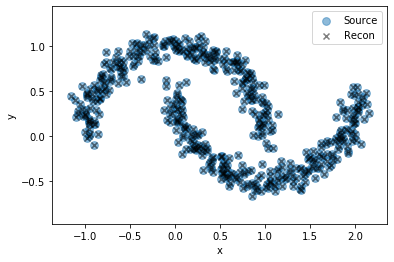

In [16]:
plt.scatter(*x_test.detach().cpu().numpy().T, alpha=0.5, label="Source", s=60)
plt.scatter(*x_recon.detach().cpu().numpy().T, color='k', alpha=0.5, marker='x', label="Recon")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
_ = plt.axis("equal")
plt.show()

### Sample points

In [17]:
z_t0 = norm.sample([num_samples]).to(device)
logp_diff_t0 = torch.zeros(num_samples, 1).type(torch.float32).to(device)

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t0, logp_diff_t0),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)
z_t1, logp_diff_t1 = z_t[-1], logp_diff_t[-1]

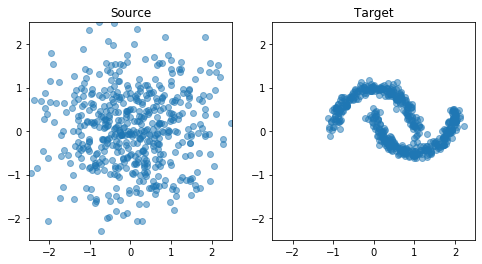

In [18]:
plt.figure(figsize=(8, 4))

plt.subplot(121)
plt.title("Source")
plt.scatter(*z_t0.detach().cpu().numpy().T, alpha=0.5)
plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.subplot(122)
plt.title("Target")
plt.scatter(*z_t1.detach().cpu().numpy().T, alpha=0.5)
plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.show()

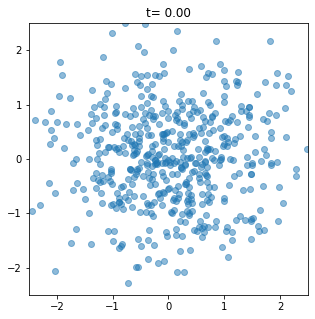

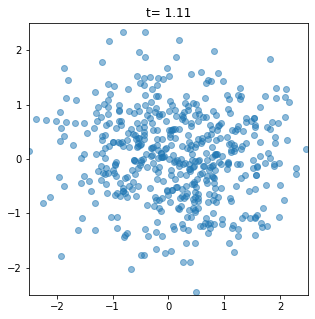

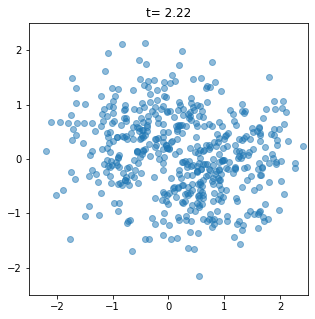

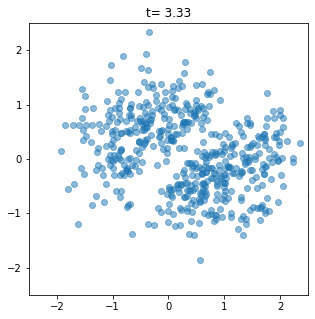

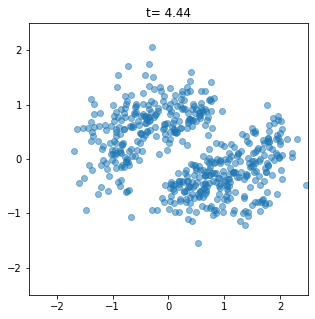

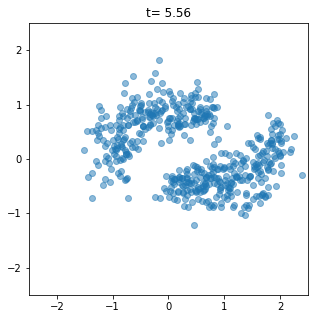

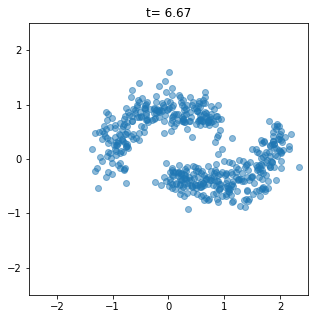

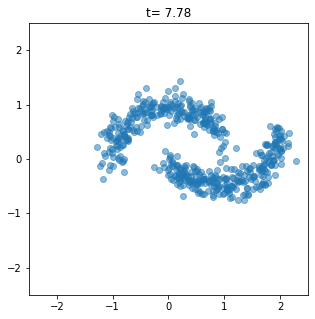

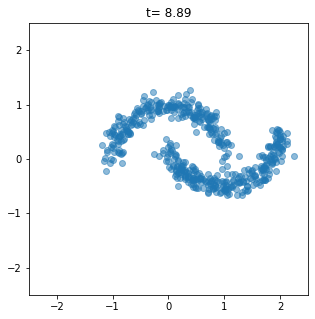

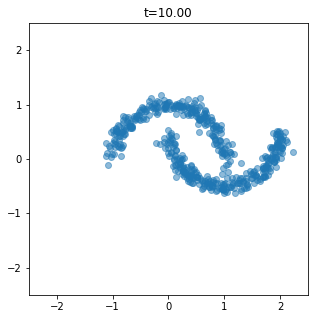

In [19]:
for step, (t, z) in enumerate(zip(np.linspace(t0, t1, 10), z_t.detach().cpu().numpy())):
    plt.figure(figsize=(5, 5))    
    plt.title(f"t={t:5.2f}")
    plt.scatter(*z.T, alpha=0.5)
    plt.xlim([-2.5, 2.5])
    plt.ylim([-2.5, 2.5])
    plt.show()
    plt.savefig(f"cnfs/interpolation/step_{1000 + step}.jpg")
    plt.close()

### Transformed probablity density function

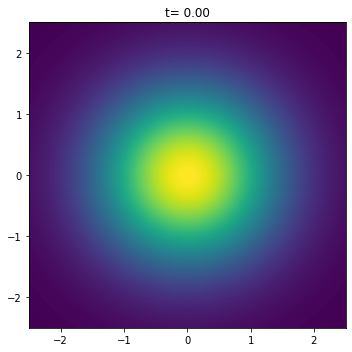

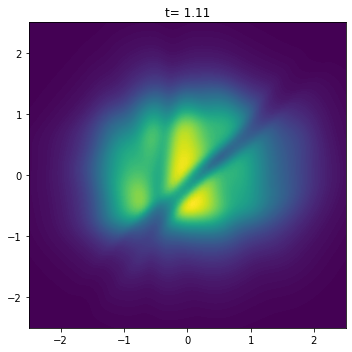

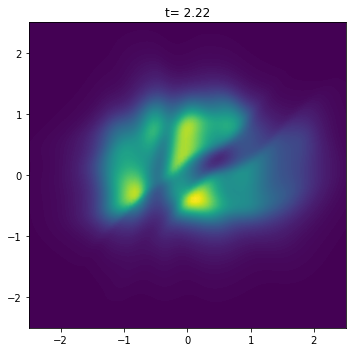

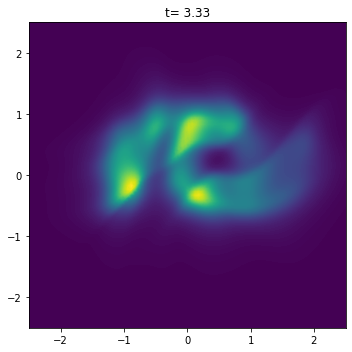

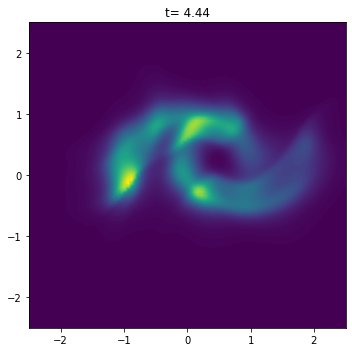

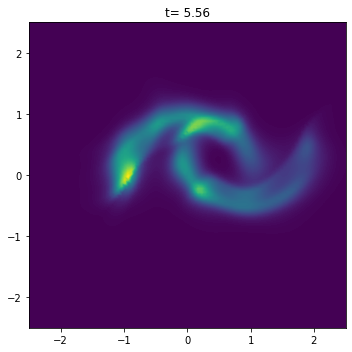

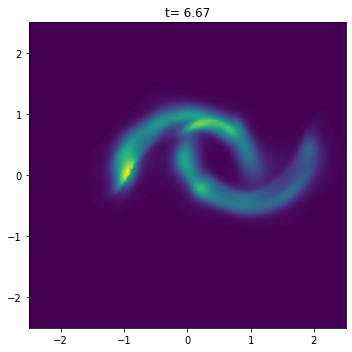

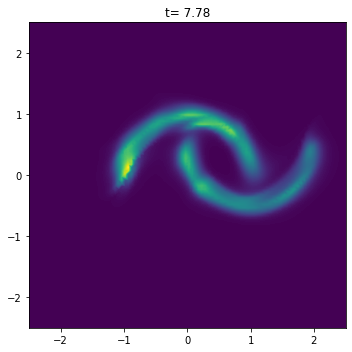

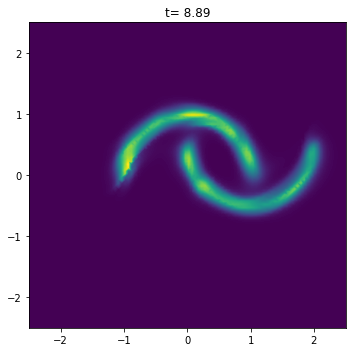

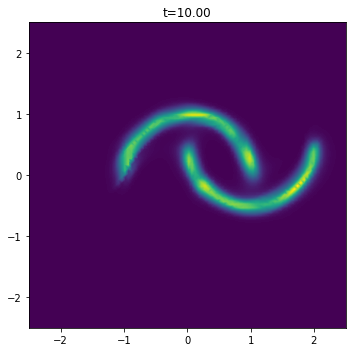

In [21]:
# Create grid of points
x = np.linspace(-2.5, 2.5, 100)
y = np.linspace(-2.5, 2.5, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t1 = torch.tensor(points).type(torch.float32).to(device)
logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device)

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t1, logp_diff_t1),
    torch.tensor(np.linspace(t1, t0, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

for step, (t, z, logp_diff) in enumerate(zip(np.linspace(t0, t1, 10), z_t, logp_diff_t)):

    
    logp = norm.log_prob(z) - logp_diff.view(-1)

    plt.figure(figsize=(5, 5))
    plt.title(f"t={t:5.2f}")
    plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp.detach().cpu().numpy()), 200)
    plt.tight_layout()
    plt.show()
    plt.savefig(f"cnfs/density/step_{1000 + step}.jpg")
    plt.close()

## Recreate Fig 4. from the paper

### Define data

In [6]:
norm = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[1.0, 0.0], [0.0, 1.0]]).to(device))

In [7]:
num_samples = 512

In [24]:
z0_test = norm.sample([num_samples]).to(device)
logp_z0_test = norm.log_prob(z0_test).unsqueeze(dim=-1).to(device)

In [9]:
from src.energy_functions import energy_function_1, energy_function_2, energy_function_3, energy_function_4

In [10]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

(-4, 4)

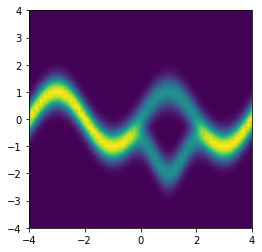

In [84]:
probs = energy_function_3(torch.tensor(points).type(torch.float32)).numpy()
plt.figure(figsize=(4, 4))
plt.tricontourf(points[:, 0], points[:, 1], np.exp(-probs)[:,0], 100)
plt.xlim([-4, 4])
plt.ylim([-4, 4])

In [85]:
t0 = 0
t1 = 10

In [128]:
energy_fun = energy_function_1

### Define model

In [129]:
odefunc = CNF(in_out_dim=2, hidden_dim=32, width=2)
# ^ have to guess hidden_dim

if device != "cpu":
    odefunc = odefunc.cuda()

In [130]:
optimizer = optim.Adam(odefunc.parameters(), lr=1e-3, weight_decay=0.)
# have to guess the LR (should check FFJORD paper)

In [131]:
# TODO: convert to KLD???
def calc_loss(z0, logp_z0):
    z_t, logp_diff_t = odeint(
            odefunc,
            (z0, logp_z0),
            torch.tensor([t0, t1]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

    x, logp_x = z_t[-1], logp_diff_t[-1]
        
    KLD = logp_x.mean(0) + energy_fun(x).mean(0)

    return KLD

### Train








  0%|          | 0/1100 [00:00<?, ?it/s]

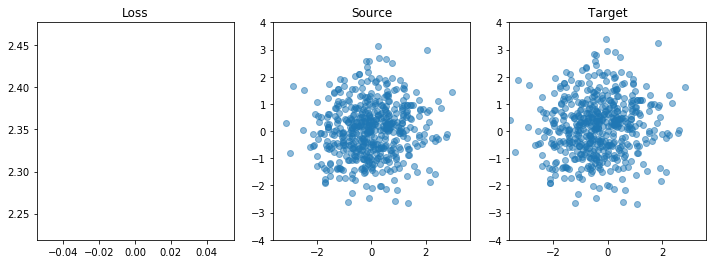








  0%|          | 1/1100 [00:00<14:15,  1.28it/s]






  0%|          | 2/1100 [00:01<12:10,  1.50it/s]






  0%|          | 3/1100 [00:01<10:19,  1.77it/s]






  0%|          | 4/1100 [00:01<09:13,  1.98it/s]






  0%|          | 5/1100 [00:02<08:26,  2.16it/s]






  1%|          | 6/1100 [00:02<08:01,  2.27it/s]






  1%|          | 7/1100 [00:02<07:30,  2.42it/s]






  1%|          | 8/1100 [00:03<07:01,  2.59it/s]






  1%|          | 9/1100 [00:03<06:48,  2.67it/s]






  1%|          | 10/1100 [00:03<06:39,  2.73it/s]

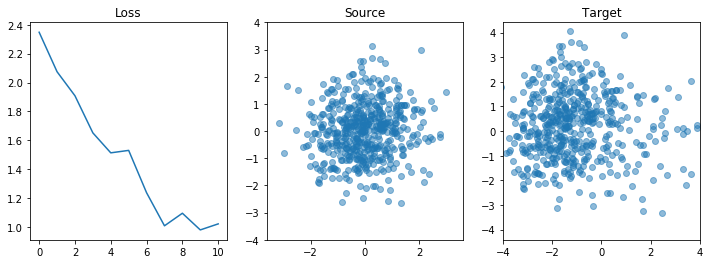








  1%|          | 11/1100 [00:04<09:25,  1.92it/s]






  1%|          | 12/1100 [00:05<08:27,  2.15it/s]






  1%|          | 13/1100 [00:05<07:48,  2.32it/s]






  1%|▏         | 14/1100 [00:05<07:12,  2.51it/s]






  1%|▏         | 15/1100 [00:06<07:01,  2.57it/s]






  1%|▏         | 16/1100 [00:06<06:56,  2.60it/s]






  2%|▏         | 17/1100 [00:06<06:51,  2.63it/s]






  2%|▏         | 18/1100 [00:07<06:54,  2.61it/s]






  2%|▏         | 19/1100 [00:07<06:21,  2.84it/s]






  2%|▏         | 20/1100 [00:07<06:12,  2.90it/s]

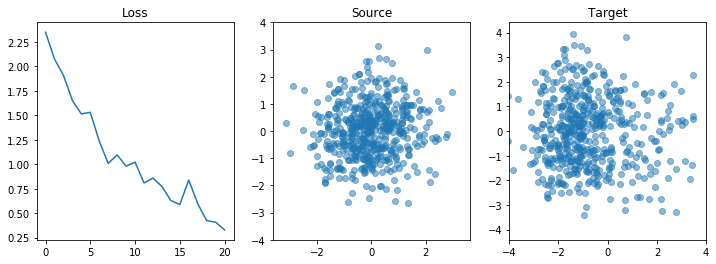








  2%|▏         | 21/1100 [00:08<08:50,  2.03it/s]






  2%|▏         | 22/1100 [00:09<07:55,  2.27it/s]






  2%|▏         | 23/1100 [00:09<07:23,  2.43it/s]






  2%|▏         | 24/1100 [00:09<07:01,  2.55it/s]






  2%|▏         | 25/1100 [00:10<06:38,  2.69it/s]






  2%|▏         | 26/1100 [00:10<06:24,  2.80it/s]






  2%|▏         | 27/1100 [00:10<06:20,  2.82it/s]






  3%|▎         | 28/1100 [00:11<06:03,  2.95it/s]






  3%|▎         | 29/1100 [00:11<05:58,  2.99it/s]






  3%|▎         | 30/1100 [00:11<06:09,  2.90it/s]

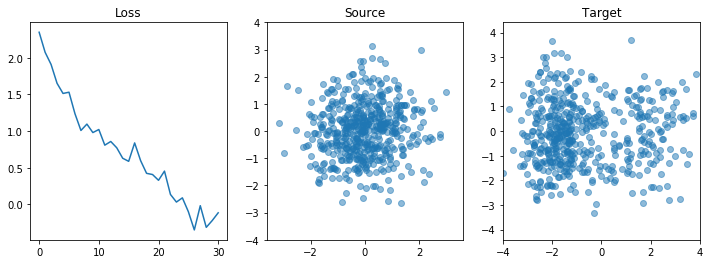








  3%|▎         | 31/1100 [00:12<08:52,  2.01it/s]






  3%|▎         | 32/1100 [00:13<08:10,  2.18it/s]






  3%|▎         | 33/1100 [00:13<07:50,  2.27it/s]






  3%|▎         | 34/1100 [00:13<07:27,  2.38it/s]






  3%|▎         | 35/1100 [00:14<07:13,  2.46it/s]






  3%|▎         | 36/1100 [00:14<06:58,  2.54it/s]






  3%|▎         | 37/1100 [00:14<07:02,  2.52it/s]






  3%|▎         | 38/1100 [00:15<07:12,  2.46it/s]






  4%|▎         | 39/1100 [00:15<07:12,  2.45it/s]






  4%|▎         | 40/1100 [00:16<07:02,  2.51it/s]

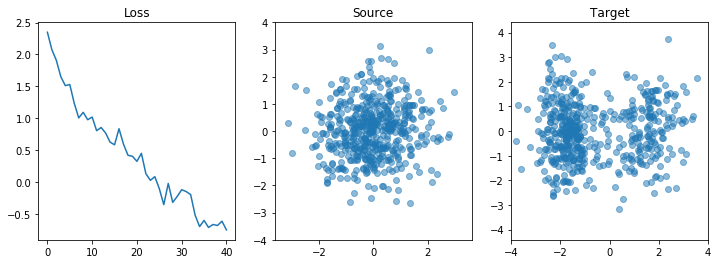








  4%|▎         | 41/1100 [00:16<09:13,  1.91it/s]






  4%|▍         | 42/1100 [00:17<08:37,  2.05it/s]






  4%|▍         | 43/1100 [00:17<08:32,  2.06it/s]






  4%|▍         | 44/1100 [00:18<08:22,  2.10it/s]






  4%|▍         | 45/1100 [00:18<08:33,  2.05it/s]






  4%|▍         | 46/1100 [00:19<08:06,  2.17it/s]






  4%|▍         | 47/1100 [00:19<08:13,  2.13it/s]






  4%|▍         | 48/1100 [00:20<07:59,  2.19it/s]






  4%|▍         | 49/1100 [00:20<08:06,  2.16it/s]






  5%|▍         | 50/1100 [00:21<08:14,  2.12it/s]

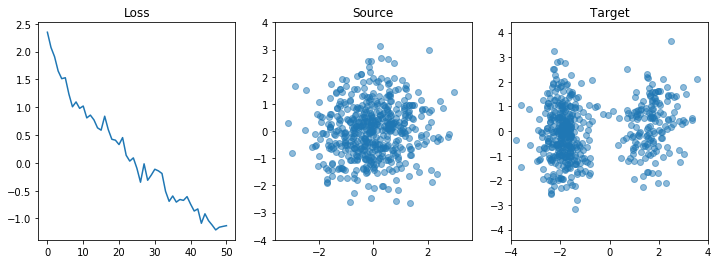








  5%|▍         | 51/1100 [00:22<10:41,  1.63it/s]






  5%|▍         | 52/1100 [00:22<09:52,  1.77it/s]






  5%|▍         | 53/1100 [00:22<09:18,  1.88it/s]






  5%|▍         | 54/1100 [00:23<09:09,  1.91it/s]






  5%|▌         | 55/1100 [00:23<08:56,  1.95it/s]






  5%|▌         | 56/1100 [00:24<08:40,  2.01it/s]






  5%|▌         | 57/1100 [00:24<08:34,  2.03it/s]






  5%|▌         | 58/1100 [00:25<08:47,  1.98it/s]






  5%|▌         | 59/1100 [00:25<08:19,  2.08it/s]






  5%|▌         | 60/1100 [00:26<08:06,  2.14it/s]

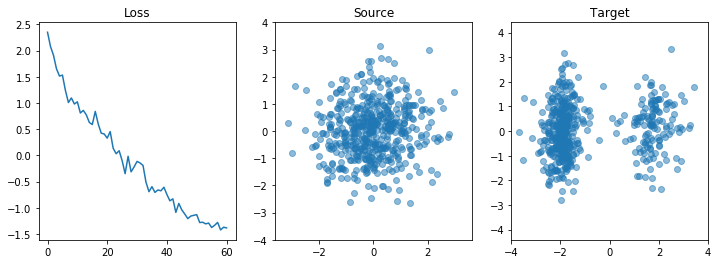








  6%|▌         | 61/1100 [00:27<10:35,  1.63it/s]






  6%|▌         | 62/1100 [00:27<09:57,  1.74it/s]






  6%|▌         | 63/1100 [00:28<09:17,  1.86it/s]






  6%|▌         | 64/1100 [00:28<09:00,  1.92it/s]






  6%|▌         | 65/1100 [00:29<08:42,  1.98it/s]






  6%|▌         | 66/1100 [00:29<08:29,  2.03it/s]






  6%|▌         | 67/1100 [00:30<08:31,  2.02it/s]






  6%|▌         | 68/1100 [00:30<08:13,  2.09it/s]






  6%|▋         | 69/1100 [00:30<07:55,  2.17it/s]






  6%|▋         | 70/1100 [00:31<08:04,  2.13it/s]

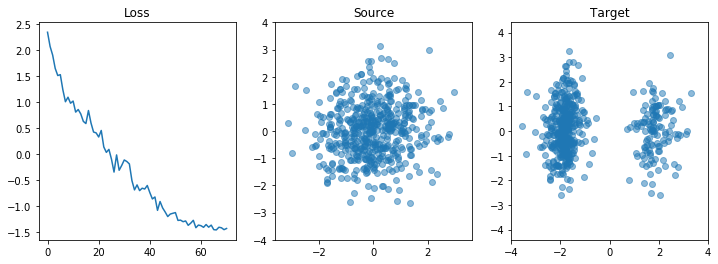








  6%|▋         | 71/1100 [00:32<10:46,  1.59it/s]






  7%|▋         | 72/1100 [00:32<10:09,  1.69it/s]






  7%|▋         | 73/1100 [00:33<09:46,  1.75it/s]






  7%|▋         | 74/1100 [00:33<09:12,  1.86it/s]






  7%|▋         | 75/1100 [00:34<09:01,  1.89it/s]






  7%|▋         | 76/1100 [00:34<08:47,  1.94it/s]






  7%|▋         | 77/1100 [00:35<08:42,  1.96it/s]






  7%|▋         | 78/1100 [00:35<08:32,  1.99it/s]






  7%|▋         | 79/1100 [00:36<08:23,  2.03it/s]






  7%|▋         | 80/1100 [00:36<08:23,  2.03it/s]

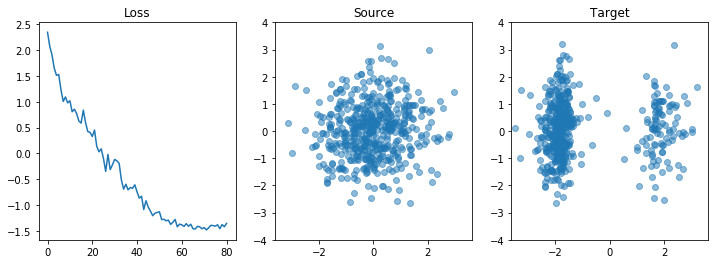








  7%|▋         | 81/1100 [00:37<10:47,  1.57it/s]






  7%|▋         | 82/1100 [00:38<10:11,  1.66it/s]






  8%|▊         | 83/1100 [00:38<09:23,  1.81it/s]






  8%|▊         | 84/1100 [00:39<08:48,  1.92it/s]






  8%|▊         | 85/1100 [00:39<08:31,  1.99it/s]






  8%|▊         | 86/1100 [00:40<08:24,  2.01it/s]






  8%|▊         | 87/1100 [00:40<08:05,  2.09it/s]






  8%|▊         | 88/1100 [00:41<07:48,  2.16it/s]






  8%|▊         | 89/1100 [00:41<07:42,  2.19it/s]






  8%|▊         | 90/1100 [00:42<07:59,  2.11it/s]

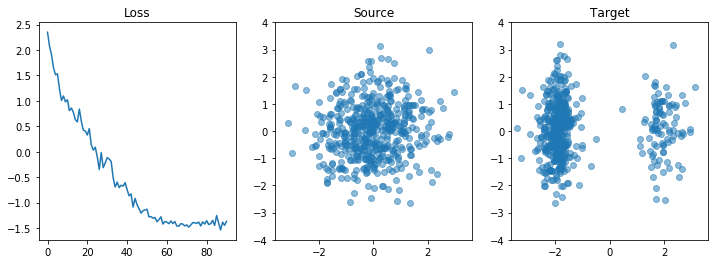








  8%|▊         | 91/1100 [00:43<10:45,  1.56it/s]






  8%|▊         | 92/1100 [00:43<09:44,  1.72it/s]






  8%|▊         | 93/1100 [00:43<08:56,  1.88it/s]






  9%|▊         | 94/1100 [00:44<08:47,  1.91it/s]






  9%|▊         | 95/1100 [00:44<08:35,  1.95it/s]






  9%|▊         | 96/1100 [00:45<08:43,  1.92it/s]






  9%|▉         | 97/1100 [00:45<08:42,  1.92it/s]






  9%|▉         | 98/1100 [00:46<08:35,  1.94it/s]






  9%|▉         | 99/1100 [00:46<08:24,  1.98it/s]






  9%|▉         | 100/1100 [00:47<08:23,  1.99it/s]

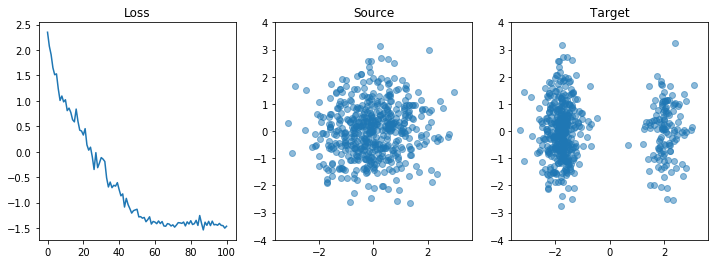








  9%|▉         | 101/1100 [00:48<10:21,  1.61it/s]






  9%|▉         | 102/1100 [00:48<09:37,  1.73it/s]






  9%|▉         | 103/1100 [00:49<08:48,  1.89it/s]






  9%|▉         | 104/1100 [00:49<08:42,  1.91it/s]






 10%|▉         | 105/1100 [00:50<08:31,  1.94it/s]






 10%|▉         | 106/1100 [00:50<08:01,  2.07it/s]






 10%|▉         | 107/1100 [00:51<08:00,  2.07it/s]






 10%|▉         | 108/1100 [00:51<07:59,  2.07it/s]






 10%|▉         | 109/1100 [00:52<07:57,  2.07it/s]






 10%|█         | 110/1100 [00:52<08:15,  2.00it/s]

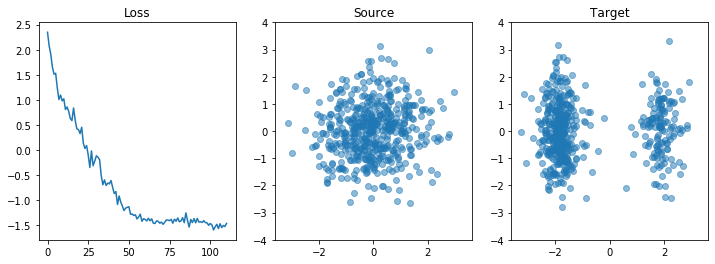








 10%|█         | 111/1100 [00:53<10:41,  1.54it/s]






 10%|█         | 112/1100 [00:54<09:56,  1.66it/s]






 10%|█         | 113/1100 [00:54<09:13,  1.78it/s]






 10%|█         | 114/1100 [00:55<08:43,  1.88it/s]






 10%|█         | 115/1100 [00:55<08:30,  1.93it/s]






 11%|█         | 116/1100 [00:56<08:19,  1.97it/s]






 11%|█         | 117/1100 [00:56<08:12,  2.00it/s]






 11%|█         | 118/1100 [00:56<07:55,  2.06it/s]






 11%|█         | 119/1100 [00:57<07:57,  2.05it/s]






 11%|█         | 120/1100 [00:57<07:38,  2.14it/s]

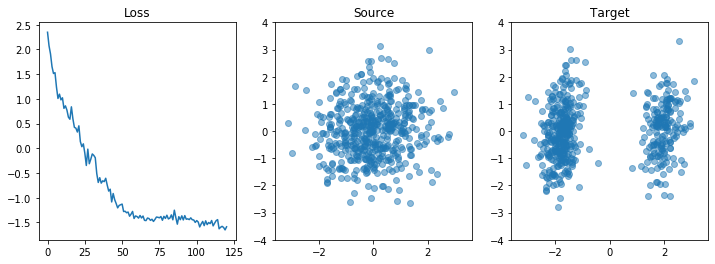








 11%|█         | 121/1100 [00:58<10:19,  1.58it/s]






 11%|█         | 122/1100 [00:59<09:33,  1.71it/s]






 11%|█         | 123/1100 [00:59<08:54,  1.83it/s]






 11%|█▏        | 124/1100 [01:00<08:15,  1.97it/s]






 11%|█▏        | 125/1100 [01:00<08:01,  2.02it/s]






 11%|█▏        | 126/1100 [01:01<08:08,  1.99it/s]






 12%|█▏        | 127/1100 [01:01<08:02,  2.02it/s]






 12%|█▏        | 128/1100 [01:02<08:04,  2.01it/s]






 12%|█▏        | 129/1100 [01:02<08:04,  2.00it/s]






 12%|█▏        | 130/1100 [01:03<07:59,  2.02it/s]

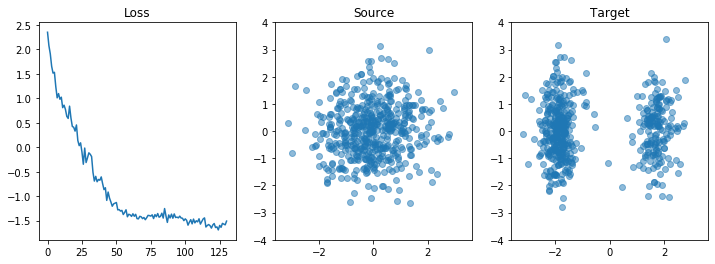








 12%|█▏        | 131/1100 [01:04<10:11,  1.58it/s]






 12%|█▏        | 132/1100 [01:04<09:35,  1.68it/s]






 12%|█▏        | 133/1100 [01:05<08:51,  1.82it/s]






 12%|█▏        | 134/1100 [01:05<08:31,  1.89it/s]






 12%|█▏        | 135/1100 [01:06<08:12,  1.96it/s]






 12%|█▏        | 136/1100 [01:06<08:14,  1.95it/s]






 12%|█▏        | 137/1100 [01:07<08:31,  1.88it/s]






 13%|█▎        | 138/1100 [01:07<08:10,  1.96it/s]






 13%|█▎        | 139/1100 [01:08<08:01,  2.00it/s]






 13%|█▎        | 140/1100 [01:08<07:45,  2.06it/s]

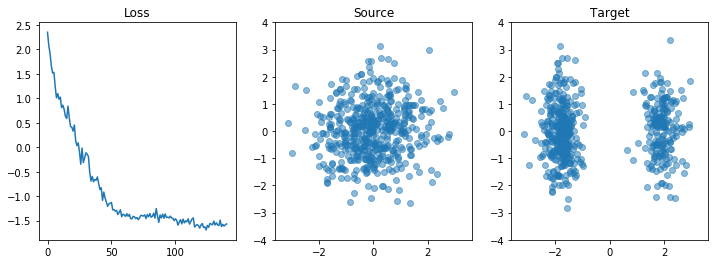








 13%|█▎        | 141/1100 [01:09<10:00,  1.60it/s]






 13%|█▎        | 142/1100 [01:09<09:12,  1.73it/s]






 13%|█▎        | 143/1100 [01:10<08:53,  1.79it/s]






 13%|█▎        | 144/1100 [01:10<08:25,  1.89it/s]






 13%|█▎        | 145/1100 [01:11<08:20,  1.91it/s]






 13%|█▎        | 146/1100 [01:11<08:07,  1.96it/s]






 13%|█▎        | 147/1100 [01:12<07:46,  2.04it/s]






 13%|█▎        | 148/1100 [01:12<07:32,  2.11it/s]






 14%|█▎        | 149/1100 [01:13<07:16,  2.18it/s]






 14%|█▎        | 150/1100 [01:13<07:36,  2.08it/s]

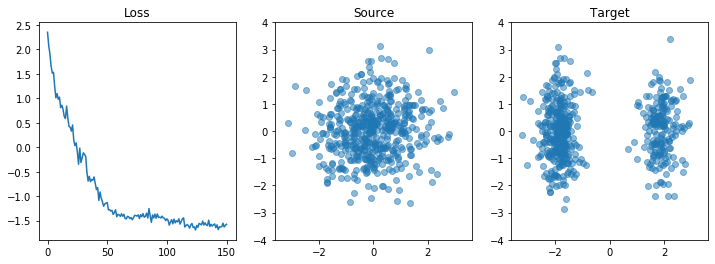








 14%|█▎        | 151/1100 [01:14<09:44,  1.62it/s]






 14%|█▍        | 152/1100 [01:15<09:05,  1.74it/s]






 14%|█▍        | 153/1100 [01:15<08:30,  1.85it/s]






 14%|█▍        | 154/1100 [01:16<08:16,  1.91it/s]






 14%|█▍        | 155/1100 [01:16<08:07,  1.94it/s]






 14%|█▍        | 156/1100 [01:17<08:08,  1.93it/s]






 14%|█▍        | 157/1100 [01:17<08:03,  1.95it/s]






 14%|█▍        | 158/1100 [01:18<08:05,  1.94it/s]






 14%|█▍        | 159/1100 [01:18<07:55,  1.98it/s]






 15%|█▍        | 160/1100 [01:19<07:51,  1.99it/s]

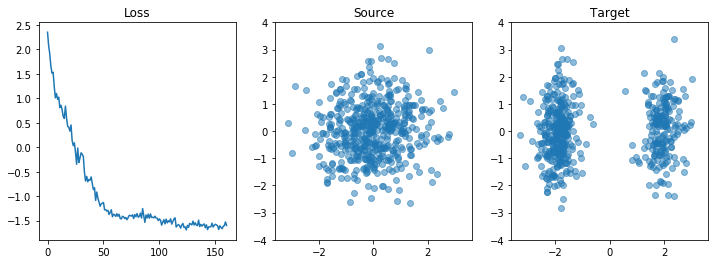








 15%|█▍        | 161/1100 [01:20<10:05,  1.55it/s]






 15%|█▍        | 162/1100 [01:20<09:22,  1.67it/s]






 15%|█▍        | 163/1100 [01:21<08:53,  1.75it/s]






 15%|█▍        | 164/1100 [01:21<08:16,  1.88it/s]






 15%|█▌        | 165/1100 [01:22<08:11,  1.90it/s]






 15%|█▌        | 166/1100 [01:22<08:06,  1.92it/s]






 15%|█▌        | 167/1100 [01:23<07:51,  1.98it/s]






 15%|█▌        | 168/1100 [01:23<07:39,  2.03it/s]






 15%|█▌        | 169/1100 [01:23<07:19,  2.12it/s]






 15%|█▌        | 170/1100 [01:24<07:22,  2.10it/s]

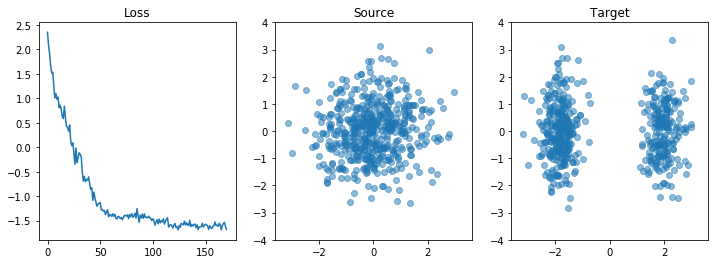








 16%|█▌        | 171/1100 [01:25<09:27,  1.64it/s]






 16%|█▌        | 172/1100 [01:25<09:08,  1.69it/s]






 16%|█▌        | 173/1100 [01:26<08:52,  1.74it/s]






 16%|█▌        | 174/1100 [01:26<08:34,  1.80it/s]






 16%|█▌        | 175/1100 [01:27<07:56,  1.94it/s]






 16%|█▌        | 176/1100 [01:27<07:58,  1.93it/s]






 16%|█▌        | 177/1100 [01:28<07:47,  1.97it/s]






 16%|█▌        | 178/1100 [01:28<07:46,  1.98it/s]






 16%|█▋        | 179/1100 [01:29<07:44,  1.98it/s]






 16%|█▋        | 180/1100 [01:29<07:20,  2.09it/s]

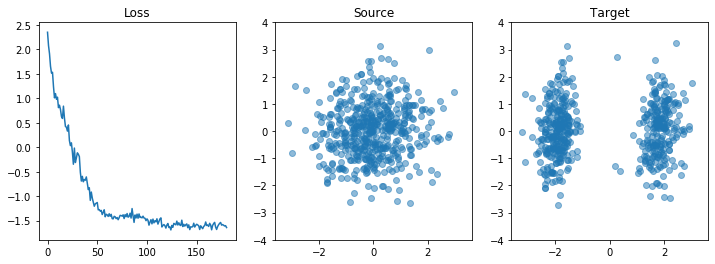








 16%|█▋        | 181/1100 [01:30<09:56,  1.54it/s]






 17%|█▋        | 182/1100 [01:31<08:53,  1.72it/s]






 17%|█▋        | 183/1100 [01:31<08:39,  1.76it/s]






 17%|█▋        | 184/1100 [01:32<08:07,  1.88it/s]






 17%|█▋        | 185/1100 [01:32<08:02,  1.90it/s]






 17%|█▋        | 186/1100 [01:33<07:31,  2.02it/s]






 17%|█▋        | 187/1100 [01:33<07:10,  2.12it/s]






 17%|█▋        | 188/1100 [01:34<07:24,  2.05it/s]






 17%|█▋        | 189/1100 [01:34<07:27,  2.04it/s]






 17%|█▋        | 190/1100 [01:35<07:23,  2.05it/s]

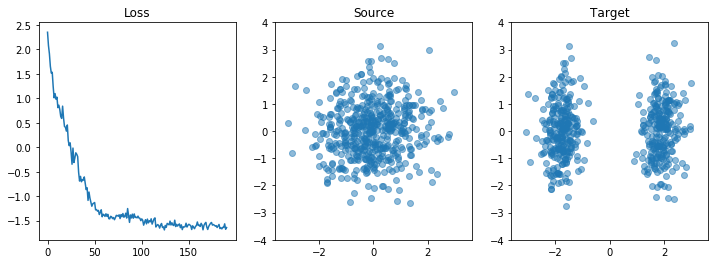








 17%|█▋        | 191/1100 [01:36<09:30,  1.59it/s]






 17%|█▋        | 192/1100 [01:36<09:02,  1.67it/s]






 18%|█▊        | 193/1100 [01:37<08:29,  1.78it/s]






 18%|█▊        | 194/1100 [01:37<07:58,  1.90it/s]






 18%|█▊        | 195/1100 [01:38<07:51,  1.92it/s]






 18%|█▊        | 196/1100 [01:38<07:40,  1.96it/s]






 18%|█▊        | 197/1100 [01:38<07:34,  1.99it/s]






 18%|█▊        | 198/1100 [01:39<07:30,  2.00it/s]






 18%|█▊        | 199/1100 [01:39<07:23,  2.03it/s]






 18%|█▊        | 200/1100 [01:40<07:16,  2.06it/s]

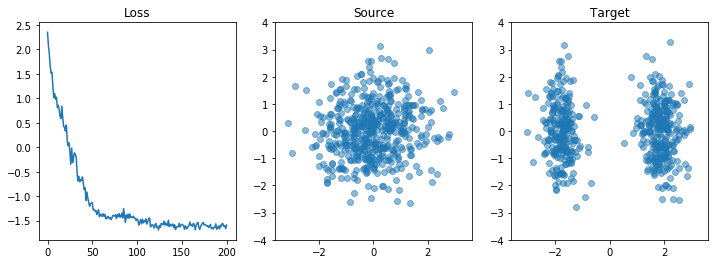








 18%|█▊        | 201/1100 [01:41<09:20,  1.60it/s]






 18%|█▊        | 202/1100 [01:41<08:47,  1.70it/s]






 18%|█▊        | 203/1100 [01:42<08:21,  1.79it/s]






 19%|█▊        | 204/1100 [01:42<08:07,  1.84it/s]






 19%|█▊        | 205/1100 [01:43<07:58,  1.87it/s]






 19%|█▊        | 206/1100 [01:43<07:39,  1.95it/s]






 19%|█▉        | 207/1100 [01:44<07:38,  1.95it/s]






 19%|█▉        | 208/1100 [01:44<07:19,  2.03it/s]






 19%|█▉        | 209/1100 [01:45<07:35,  1.96it/s]






 19%|█▉        | 210/1100 [01:45<07:27,  1.99it/s]

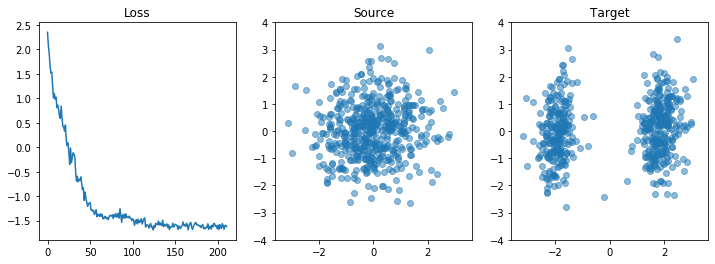








 19%|█▉        | 211/1100 [01:46<09:24,  1.57it/s]






 19%|█▉        | 212/1100 [01:47<08:50,  1.67it/s]






 19%|█▉        | 213/1100 [01:47<08:29,  1.74it/s]






 19%|█▉        | 214/1100 [01:48<07:53,  1.87it/s]






 20%|█▉        | 215/1100 [01:48<07:48,  1.89it/s]






 20%|█▉        | 216/1100 [01:49<07:24,  1.99it/s]






 20%|█▉        | 217/1100 [01:49<07:13,  2.04it/s]






 20%|█▉        | 218/1100 [01:50<07:17,  2.02it/s]






 20%|█▉        | 219/1100 [01:50<06:58,  2.11it/s]






 20%|██        | 220/1100 [01:51<07:13,  2.03it/s]

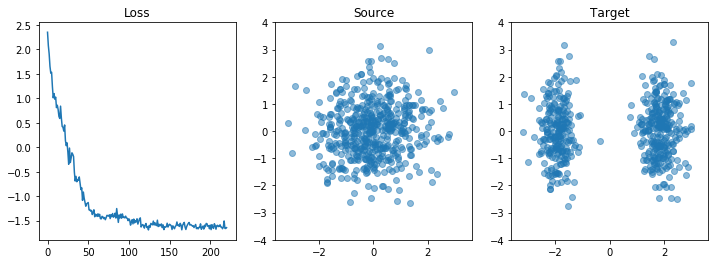








 20%|██        | 221/1100 [01:52<09:18,  1.57it/s]






 20%|██        | 222/1100 [01:52<08:45,  1.67it/s]






 20%|██        | 223/1100 [01:53<08:14,  1.77it/s]






 20%|██        | 224/1100 [01:53<07:35,  1.92it/s]






 20%|██        | 225/1100 [01:54<07:39,  1.90it/s]






 21%|██        | 226/1100 [01:54<07:17,  2.00it/s]






 21%|██        | 227/1100 [01:54<07:00,  2.08it/s]






 21%|██        | 228/1100 [01:55<07:06,  2.05it/s]






 21%|██        | 229/1100 [01:55<06:59,  2.08it/s]






 21%|██        | 230/1100 [01:56<07:06,  2.04it/s]

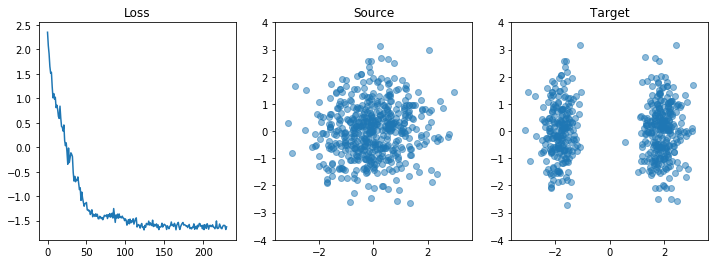








 21%|██        | 231/1100 [01:57<09:39,  1.50it/s]






 21%|██        | 232/1100 [01:57<08:45,  1.65it/s]






 21%|██        | 233/1100 [01:58<07:55,  1.82it/s]






 21%|██▏       | 234/1100 [01:58<07:37,  1.89it/s]






 21%|██▏       | 235/1100 [01:59<07:20,  1.96it/s]






 21%|██▏       | 236/1100 [01:59<07:15,  1.99it/s]






 22%|██▏       | 237/1100 [02:00<07:21,  1.95it/s]






 22%|██▏       | 238/1100 [02:00<07:24,  1.94it/s]






 22%|██▏       | 239/1100 [02:01<07:04,  2.03it/s]






 22%|██▏       | 240/1100 [02:01<07:04,  2.03it/s]

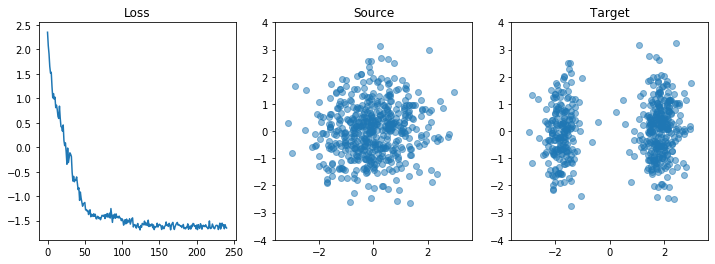








 22%|██▏       | 241/1100 [02:02<09:16,  1.54it/s]






 22%|██▏       | 242/1100 [02:03<08:22,  1.71it/s]






 22%|██▏       | 243/1100 [02:03<07:54,  1.81it/s]






 22%|██▏       | 244/1100 [02:04<07:41,  1.86it/s]






 22%|██▏       | 245/1100 [02:04<07:20,  1.94it/s]






 22%|██▏       | 246/1100 [02:05<07:18,  1.95it/s]






 22%|██▏       | 247/1100 [02:05<07:24,  1.92it/s]






 23%|██▎       | 248/1100 [02:06<07:05,  2.00it/s]






 23%|██▎       | 249/1100 [02:06<06:57,  2.04it/s]






 23%|██▎       | 250/1100 [02:07<06:37,  2.14it/s]

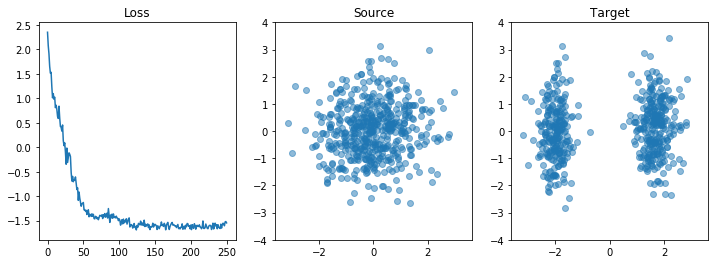








 23%|██▎       | 251/1100 [02:08<09:03,  1.56it/s]






 23%|██▎       | 252/1100 [02:08<08:06,  1.74it/s]






 23%|██▎       | 253/1100 [02:09<07:38,  1.85it/s]






 23%|██▎       | 254/1100 [02:09<07:42,  1.83it/s]






 23%|██▎       | 255/1100 [02:09<07:13,  1.95it/s]






 23%|██▎       | 256/1100 [02:10<06:54,  2.04it/s]






 23%|██▎       | 257/1100 [02:10<06:48,  2.06it/s]






 23%|██▎       | 258/1100 [02:11<07:08,  1.96it/s]






 24%|██▎       | 259/1100 [02:11<07:11,  1.95it/s]






 24%|██▎       | 260/1100 [02:12<07:06,  1.97it/s]

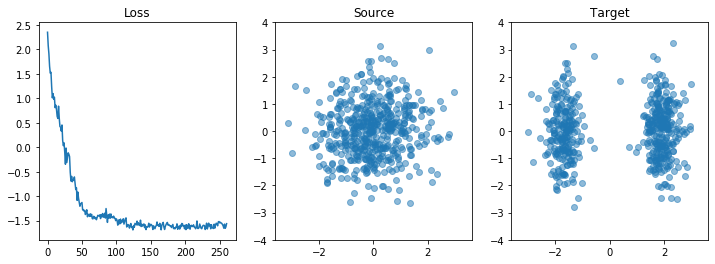








 24%|██▎       | 261/1100 [02:13<09:08,  1.53it/s]






 24%|██▍       | 262/1100 [02:14<08:32,  1.63it/s]






 24%|██▍       | 263/1100 [02:14<08:19,  1.68it/s]






 24%|██▍       | 264/1100 [02:15<07:42,  1.81it/s]






 24%|██▍       | 265/1100 [02:15<07:48,  1.78it/s]






 24%|██▍       | 266/1100 [02:16<07:41,  1.81it/s]






 24%|██▍       | 267/1100 [02:16<07:31,  1.84it/s]






 24%|██▍       | 268/1100 [02:17<07:29,  1.85it/s]






 24%|██▍       | 269/1100 [02:17<07:14,  1.91it/s]






 25%|██▍       | 270/1100 [02:18<07:07,  1.94it/s]

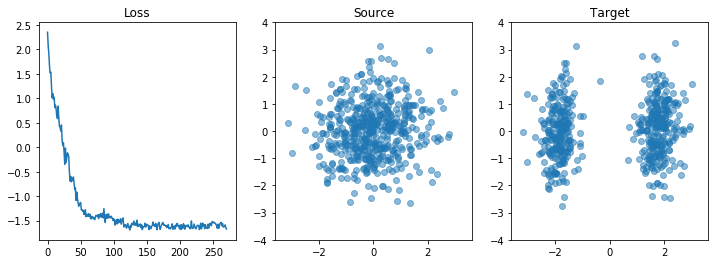








 25%|██▍       | 271/1100 [02:19<09:06,  1.52it/s]






 25%|██▍       | 272/1100 [02:19<08:29,  1.62it/s]






 25%|██▍       | 273/1100 [02:20<07:47,  1.77it/s]






 25%|██▍       | 274/1100 [02:20<07:22,  1.87it/s]






 25%|██▌       | 275/1100 [02:21<07:18,  1.88it/s]






 25%|██▌       | 276/1100 [02:21<07:21,  1.86it/s]






 25%|██▌       | 277/1100 [02:22<07:01,  1.95it/s]






 25%|██▌       | 278/1100 [02:22<06:54,  1.99it/s]






 25%|██▌       | 279/1100 [02:23<06:50,  2.00it/s]






 25%|██▌       | 280/1100 [02:23<06:58,  1.96it/s]

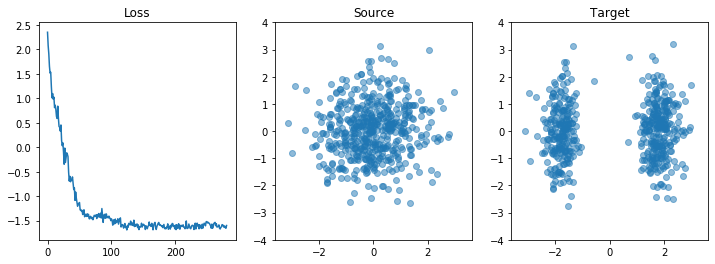








 26%|██▌       | 281/1100 [02:24<08:39,  1.58it/s]






 26%|██▌       | 282/1100 [02:24<07:51,  1.73it/s]






 26%|██▌       | 283/1100 [02:25<07:34,  1.80it/s]






 26%|██▌       | 284/1100 [02:25<07:10,  1.90it/s]






 26%|██▌       | 285/1100 [02:26<07:17,  1.86it/s]






 26%|██▌       | 286/1100 [02:27<07:07,  1.90it/s]






 26%|██▌       | 287/1100 [02:27<07:14,  1.87it/s]






 26%|██▌       | 288/1100 [02:28<07:03,  1.92it/s]






 26%|██▋       | 289/1100 [02:28<06:47,  1.99it/s]






 26%|██▋       | 290/1100 [02:29<07:01,  1.92it/s]

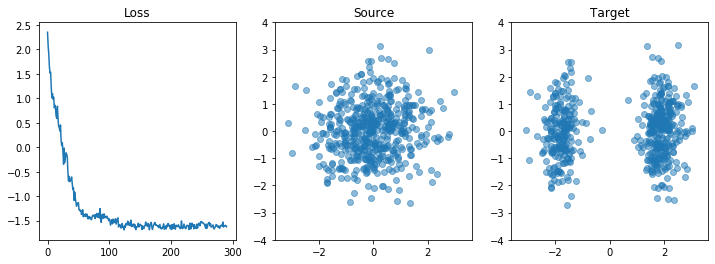








 26%|██▋       | 291/1100 [02:30<08:52,  1.52it/s]






 27%|██▋       | 292/1100 [02:30<08:00,  1.68it/s]






 27%|██▋       | 293/1100 [02:30<07:29,  1.80it/s]






 27%|██▋       | 294/1100 [02:31<07:29,  1.79it/s]






 27%|██▋       | 295/1100 [02:32<07:29,  1.79it/s]






 27%|██▋       | 296/1100 [02:32<07:21,  1.82it/s]






 27%|██▋       | 297/1100 [02:33<07:13,  1.85it/s]






 27%|██▋       | 298/1100 [02:33<06:43,  1.99it/s]






 27%|██▋       | 299/1100 [02:34<06:32,  2.04it/s]






 27%|██▋       | 300/1100 [02:34<06:41,  1.99it/s]

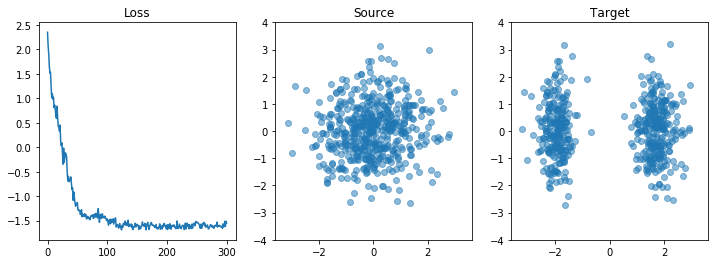








 27%|██▋       | 301/1100 [02:35<09:16,  1.44it/s]






 27%|██▋       | 302/1100 [02:36<08:37,  1.54it/s]






 28%|██▊       | 303/1100 [02:36<08:02,  1.65it/s]






 28%|██▊       | 304/1100 [02:37<07:28,  1.78it/s]






 28%|██▊       | 305/1100 [02:37<07:18,  1.81it/s]






 28%|██▊       | 306/1100 [02:38<07:02,  1.88it/s]






 28%|██▊       | 307/1100 [02:38<07:13,  1.83it/s]






 28%|██▊       | 308/1100 [02:39<06:55,  1.90it/s]






 28%|██▊       | 309/1100 [02:39<06:39,  1.98it/s]






 28%|██▊       | 310/1100 [02:40<06:49,  1.93it/s]

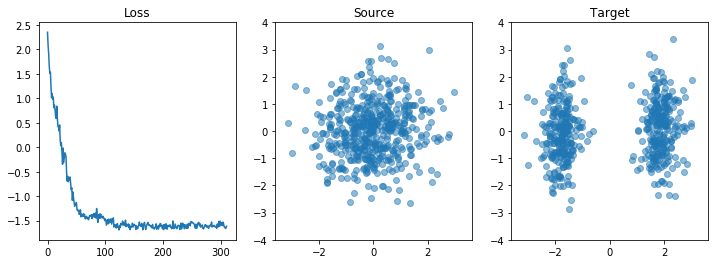








 28%|██▊       | 311/1100 [02:41<08:20,  1.58it/s]






 28%|██▊       | 312/1100 [02:41<07:51,  1.67it/s]






 28%|██▊       | 313/1100 [02:42<07:22,  1.78it/s]






 29%|██▊       | 314/1100 [02:42<07:10,  1.83it/s]






 29%|██▊       | 315/1100 [02:43<07:16,  1.80it/s]






 29%|██▊       | 316/1100 [02:43<07:05,  1.84it/s]






 29%|██▉       | 317/1100 [02:44<06:50,  1.91it/s]






 29%|██▉       | 318/1100 [02:44<06:38,  1.96it/s]






 29%|██▉       | 319/1100 [02:45<06:34,  1.98it/s]






 29%|██▉       | 320/1100 [02:45<06:41,  1.94it/s]

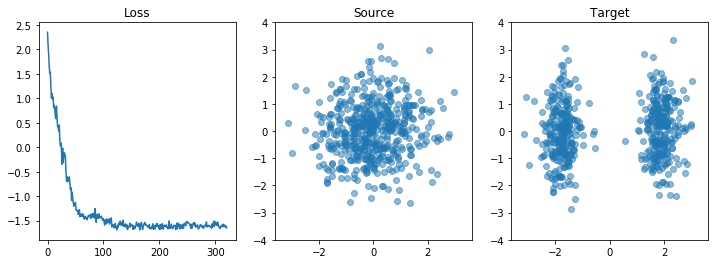








 29%|██▉       | 321/1100 [02:46<08:36,  1.51it/s]






 29%|██▉       | 322/1100 [02:47<08:24,  1.54it/s]






 29%|██▉       | 323/1100 [02:47<07:50,  1.65it/s]






 29%|██▉       | 324/1100 [02:48<07:31,  1.72it/s]






 30%|██▉       | 325/1100 [02:48<07:11,  1.79it/s]






 30%|██▉       | 326/1100 [02:49<07:03,  1.83it/s]






 30%|██▉       | 327/1100 [02:49<06:46,  1.90it/s]






 30%|██▉       | 328/1100 [02:50<06:24,  2.01it/s]






 30%|██▉       | 329/1100 [02:50<06:24,  2.01it/s]






 30%|███       | 330/1100 [02:51<06:24,  2.00it/s]

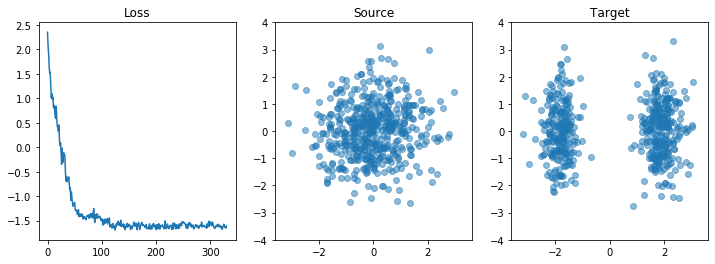








 30%|███       | 331/1100 [02:52<08:03,  1.59it/s]






 30%|███       | 332/1100 [02:52<07:36,  1.68it/s]






 30%|███       | 333/1100 [02:53<07:11,  1.78it/s]






 30%|███       | 334/1100 [02:53<06:54,  1.85it/s]






 30%|███       | 335/1100 [02:54<06:43,  1.89it/s]






 31%|███       | 336/1100 [02:54<06:22,  2.00it/s]






 31%|███       | 337/1100 [02:55<06:19,  2.01it/s]






 31%|███       | 338/1100 [02:55<06:10,  2.06it/s]






 31%|███       | 339/1100 [02:56<06:19,  2.00it/s]






 31%|███       | 340/1100 [02:56<06:10,  2.05it/s]

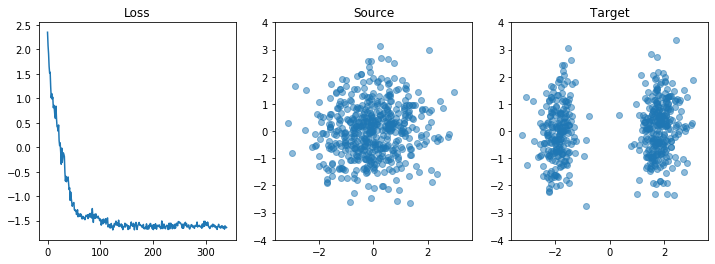








 31%|███       | 341/1100 [02:57<07:56,  1.59it/s]






 31%|███       | 342/1100 [02:58<07:36,  1.66it/s]






 31%|███       | 343/1100 [02:58<07:13,  1.75it/s]






 31%|███▏      | 344/1100 [02:59<06:46,  1.86it/s]






 31%|███▏      | 345/1100 [02:59<06:23,  1.97it/s]






 31%|███▏      | 346/1100 [02:59<06:09,  2.04it/s]






 32%|███▏      | 347/1100 [03:00<05:54,  2.13it/s]






 32%|███▏      | 348/1100 [03:00<06:00,  2.08it/s]






 32%|███▏      | 349/1100 [03:01<06:05,  2.05it/s]






 32%|███▏      | 350/1100 [03:01<05:59,  2.08it/s]

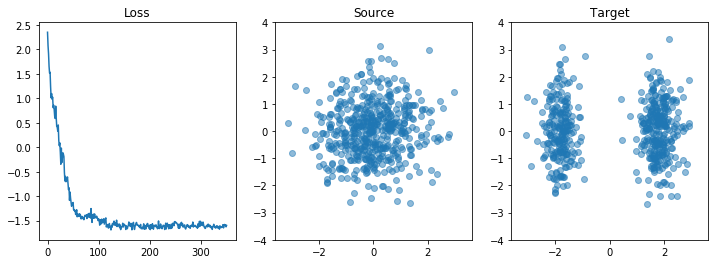








 32%|███▏      | 351/1100 [03:02<07:52,  1.58it/s]






 32%|███▏      | 352/1100 [03:03<07:27,  1.67it/s]






 32%|███▏      | 353/1100 [03:03<06:51,  1.81it/s]






 32%|███▏      | 354/1100 [03:04<06:30,  1.91it/s]






 32%|███▏      | 355/1100 [03:04<06:15,  1.98it/s]






 32%|███▏      | 356/1100 [03:05<06:14,  1.99it/s]






 32%|███▏      | 357/1100 [03:05<06:20,  1.95it/s]






 33%|███▎      | 358/1100 [03:06<06:01,  2.05it/s]






 33%|███▎      | 359/1100 [03:06<06:04,  2.03it/s]






 33%|███▎      | 360/1100 [03:07<06:09,  2.00it/s]

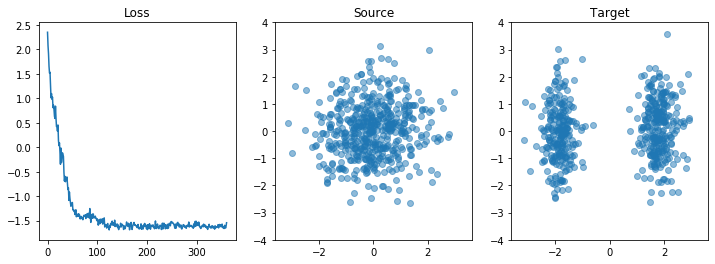








 33%|███▎      | 361/1100 [03:08<08:21,  1.47it/s]






 33%|███▎      | 362/1100 [03:08<07:52,  1.56it/s]






 33%|███▎      | 363/1100 [03:09<07:27,  1.65it/s]






 33%|███▎      | 364/1100 [03:09<06:53,  1.78it/s]






 33%|███▎      | 365/1100 [03:10<06:34,  1.86it/s]






 33%|███▎      | 366/1100 [03:10<06:19,  1.93it/s]






 33%|███▎      | 367/1100 [03:11<06:23,  1.91it/s]






 33%|███▎      | 368/1100 [03:11<06:19,  1.93it/s]






 34%|███▎      | 369/1100 [03:12<06:25,  1.90it/s]






 34%|███▎      | 370/1100 [03:12<06:06,  1.99it/s]

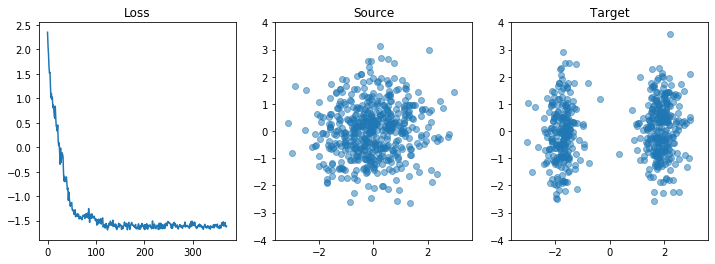








 34%|███▎      | 371/1100 [03:13<07:43,  1.57it/s]






 34%|███▍      | 372/1100 [03:14<07:16,  1.67it/s]






 34%|███▍      | 373/1100 [03:14<06:42,  1.81it/s]






 34%|███▍      | 374/1100 [03:15<06:26,  1.88it/s]






 34%|███▍      | 375/1100 [03:15<06:18,  1.92it/s]






 34%|███▍      | 376/1100 [03:16<06:24,  1.88it/s]






 34%|███▍      | 377/1100 [03:16<06:10,  1.95it/s]






 34%|███▍      | 378/1100 [03:17<06:17,  1.91it/s]






 34%|███▍      | 379/1100 [03:17<06:05,  1.97it/s]






 35%|███▍      | 380/1100 [03:18<06:12,  1.94it/s]

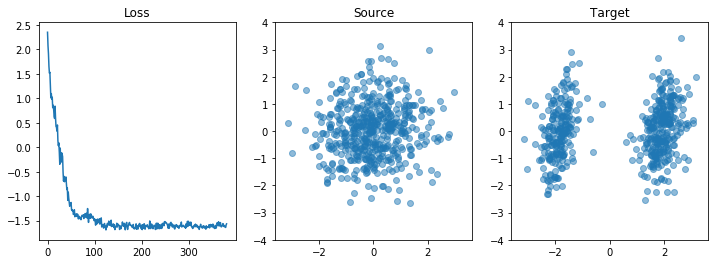








 35%|███▍      | 381/1100 [03:19<08:00,  1.50it/s]






 35%|███▍      | 382/1100 [03:19<07:11,  1.66it/s]






 35%|███▍      | 383/1100 [03:20<06:44,  1.77it/s]






 35%|███▍      | 384/1100 [03:20<06:32,  1.83it/s]






 35%|███▌      | 385/1100 [03:21<06:21,  1.88it/s]






 35%|███▌      | 386/1100 [03:21<06:04,  1.96it/s]






 35%|███▌      | 387/1100 [03:22<05:48,  2.05it/s]






 35%|███▌      | 388/1100 [03:22<05:41,  2.08it/s]






 35%|███▌      | 389/1100 [03:23<05:51,  2.02it/s]






 35%|███▌      | 390/1100 [03:23<06:02,  1.96it/s]

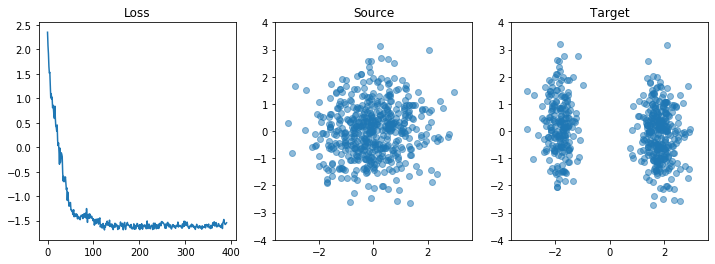








 36%|███▌      | 391/1100 [03:24<07:35,  1.56it/s]






 36%|███▌      | 392/1100 [03:25<07:02,  1.68it/s]






 36%|███▌      | 393/1100 [03:25<06:41,  1.76it/s]






 36%|███▌      | 394/1100 [03:26<06:21,  1.85it/s]






 36%|███▌      | 395/1100 [03:26<06:14,  1.88it/s]






 36%|███▌      | 396/1100 [03:27<06:19,  1.85it/s]






 36%|███▌      | 397/1100 [03:27<05:51,  2.00it/s]






 36%|███▌      | 398/1100 [03:28<05:53,  1.99it/s]






 36%|███▋      | 399/1100 [03:28<05:43,  2.04it/s]






 36%|███▋      | 400/1100 [03:29<05:46,  2.02it/s]

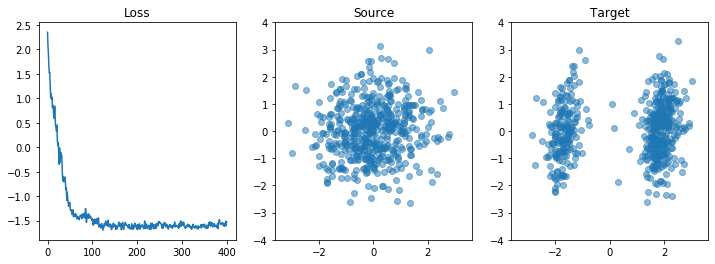








 36%|███▋      | 401/1100 [03:30<07:44,  1.50it/s]






 37%|███▋      | 402/1100 [03:30<07:09,  1.63it/s]






 37%|███▋      | 403/1100 [03:31<06:58,  1.67it/s]






 37%|███▋      | 404/1100 [03:31<06:30,  1.78it/s]






 37%|███▋      | 405/1100 [03:32<06:20,  1.82it/s]






 37%|███▋      | 406/1100 [03:32<06:18,  1.83it/s]






 37%|███▋      | 407/1100 [03:33<05:50,  1.97it/s]






 37%|███▋      | 408/1100 [03:33<05:44,  2.01it/s]






 37%|███▋      | 409/1100 [03:34<05:53,  1.95it/s]






 37%|███▋      | 410/1100 [03:34<05:46,  1.99it/s]

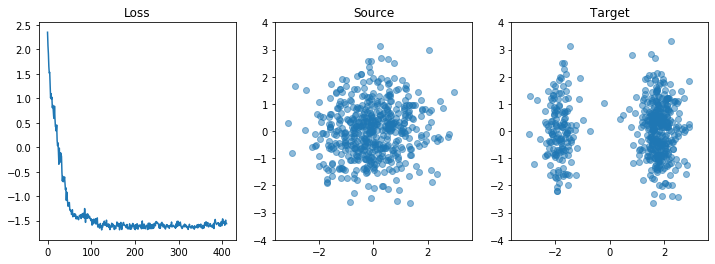








 37%|███▋      | 411/1100 [03:35<07:21,  1.56it/s]






 37%|███▋      | 412/1100 [03:36<06:40,  1.72it/s]






 38%|███▊      | 413/1100 [03:36<06:24,  1.79it/s]






 38%|███▊      | 414/1100 [03:37<06:09,  1.86it/s]






 38%|███▊      | 415/1100 [03:37<06:01,  1.89it/s]






 38%|███▊      | 416/1100 [03:38<05:44,  1.98it/s]






 38%|███▊      | 417/1100 [03:38<05:36,  2.03it/s]






 38%|███▊      | 418/1100 [03:38<05:31,  2.06it/s]






 38%|███▊      | 419/1100 [03:39<05:17,  2.14it/s]






 38%|███▊      | 420/1100 [03:39<05:27,  2.08it/s]

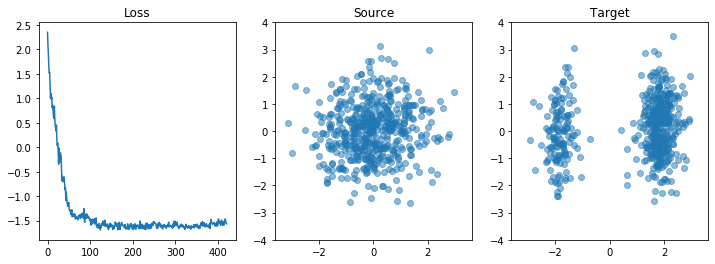








 38%|███▊      | 421/1100 [03:40<07:21,  1.54it/s]






 38%|███▊      | 422/1100 [03:41<06:38,  1.70it/s]






 38%|███▊      | 423/1100 [03:41<06:12,  1.82it/s]






 39%|███▊      | 424/1100 [03:42<06:03,  1.86it/s]






 39%|███▊      | 425/1100 [03:42<05:58,  1.88it/s]






 39%|███▊      | 426/1100 [03:43<05:43,  1.96it/s]






 39%|███▉      | 427/1100 [03:43<05:28,  2.05it/s]






 39%|███▉      | 428/1100 [03:44<05:22,  2.08it/s]






 39%|███▉      | 429/1100 [03:44<05:26,  2.05it/s]






 39%|███▉      | 430/1100 [03:45<05:25,  2.06it/s]

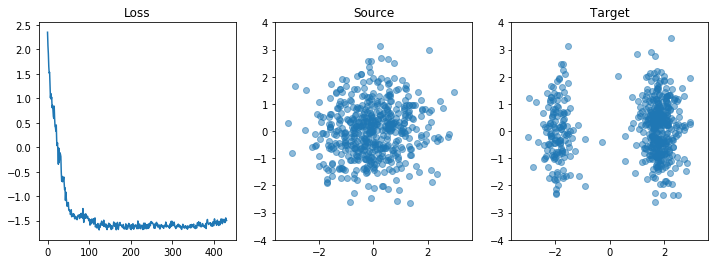








 39%|███▉      | 431/1100 [03:46<06:57,  1.60it/s]






 39%|███▉      | 432/1100 [03:46<06:31,  1.71it/s]






 39%|███▉      | 433/1100 [03:47<06:14,  1.78it/s]






 39%|███▉      | 434/1100 [03:47<05:55,  1.87it/s]






 40%|███▉      | 435/1100 [03:48<05:58,  1.86it/s]






 40%|███▉      | 436/1100 [03:48<05:39,  1.96it/s]






 40%|███▉      | 437/1100 [03:49<05:22,  2.06it/s]






 40%|███▉      | 438/1100 [03:49<05:14,  2.11it/s]






 40%|███▉      | 439/1100 [03:49<05:09,  2.14it/s]






 40%|████      | 440/1100 [03:50<05:12,  2.11it/s]

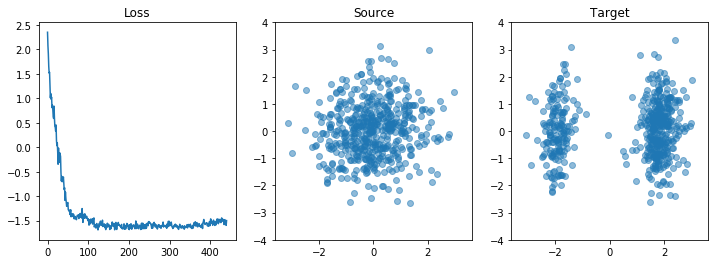








 40%|████      | 441/1100 [03:51<06:55,  1.59it/s]






 40%|████      | 442/1100 [03:51<06:35,  1.66it/s]






 40%|████      | 443/1100 [03:52<06:11,  1.77it/s]






 40%|████      | 444/1100 [03:52<05:56,  1.84it/s]






 40%|████      | 445/1100 [03:53<05:50,  1.87it/s]






 41%|████      | 446/1100 [03:54<06:00,  1.81it/s]






 41%|████      | 447/1100 [03:54<05:50,  1.86it/s]






 41%|████      | 448/1100 [03:54<05:32,  1.96it/s]






 41%|████      | 449/1100 [03:55<05:35,  1.94it/s]






 41%|████      | 450/1100 [03:56<05:29,  1.97it/s]

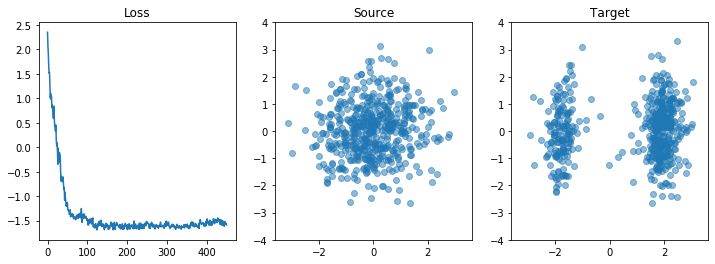








 41%|████      | 451/1100 [03:57<07:10,  1.51it/s]






 41%|████      | 452/1100 [03:57<06:37,  1.63it/s]






 41%|████      | 453/1100 [03:58<06:21,  1.70it/s]






 41%|████▏     | 454/1100 [03:58<06:03,  1.78it/s]






 41%|████▏     | 455/1100 [03:58<05:37,  1.91it/s]






 41%|████▏     | 456/1100 [03:59<05:36,  1.91it/s]






 42%|████▏     | 457/1100 [04:00<05:39,  1.89it/s]






 42%|████▏     | 458/1100 [04:00<05:26,  1.97it/s]






 42%|████▏     | 459/1100 [04:01<05:26,  1.96it/s]






 42%|████▏     | 460/1100 [04:01<05:23,  1.98it/s]

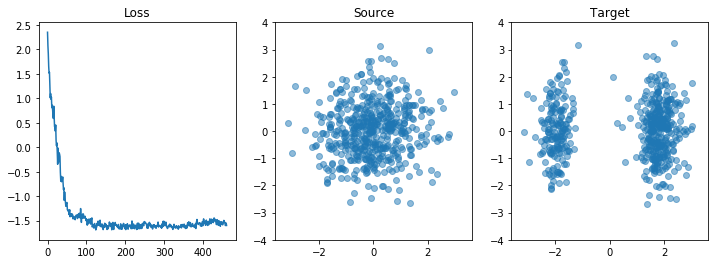








 42%|████▏     | 461/1100 [04:02<06:52,  1.55it/s]






 42%|████▏     | 462/1100 [04:02<06:21,  1.67it/s]






 42%|████▏     | 463/1100 [04:03<06:03,  1.75it/s]






 42%|████▏     | 464/1100 [04:03<05:46,  1.83it/s]






 42%|████▏     | 465/1100 [04:04<05:38,  1.88it/s]






 42%|████▏     | 466/1100 [04:05<05:37,  1.88it/s]






 42%|████▏     | 467/1100 [04:05<05:28,  1.92it/s]






 43%|████▎     | 468/1100 [04:05<05:14,  2.01it/s]






 43%|████▎     | 469/1100 [04:06<04:50,  2.17it/s]






 43%|████▎     | 470/1100 [04:06<04:51,  2.16it/s]

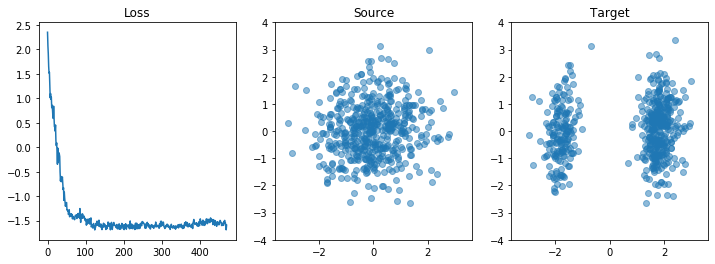








 43%|████▎     | 471/1100 [04:07<06:37,  1.58it/s]






 43%|████▎     | 472/1100 [04:08<06:06,  1.71it/s]






 43%|████▎     | 473/1100 [04:08<05:38,  1.85it/s]






 43%|████▎     | 474/1100 [04:09<05:29,  1.90it/s]






 43%|████▎     | 475/1100 [04:09<05:19,  1.95it/s]






 43%|████▎     | 476/1100 [04:10<05:20,  1.95it/s]






 43%|████▎     | 477/1100 [04:10<05:22,  1.93it/s]






 43%|████▎     | 478/1100 [04:11<05:17,  1.96it/s]






 44%|████▎     | 479/1100 [04:11<05:26,  1.90it/s]






 44%|████▎     | 480/1100 [04:12<05:25,  1.90it/s]

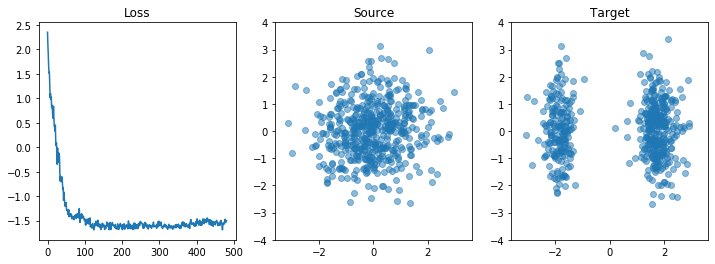








 44%|████▎     | 481/1100 [04:13<07:18,  1.41it/s]






 44%|████▍     | 482/1100 [04:14<06:46,  1.52it/s]






 44%|████▍     | 483/1100 [04:14<06:13,  1.65it/s]






 44%|████▍     | 484/1100 [04:14<05:46,  1.78it/s]






 44%|████▍     | 485/1100 [04:15<05:33,  1.84it/s]






 44%|████▍     | 486/1100 [04:15<05:25,  1.88it/s]






 44%|████▍     | 487/1100 [04:16<05:31,  1.85it/s]






 44%|████▍     | 488/1100 [04:17<05:27,  1.87it/s]






 44%|████▍     | 489/1100 [04:17<05:23,  1.89it/s]






 45%|████▍     | 490/1100 [04:18<05:16,  1.93it/s]

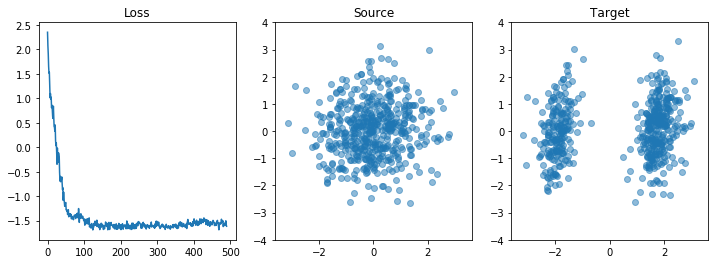








 45%|████▍     | 491/1100 [04:19<06:38,  1.53it/s]






 45%|████▍     | 492/1100 [04:19<06:18,  1.61it/s]






 45%|████▍     | 493/1100 [04:20<06:07,  1.65it/s]






 45%|████▍     | 494/1100 [04:20<05:44,  1.76it/s]






 45%|████▌     | 495/1100 [04:21<05:27,  1.84it/s]






 45%|████▌     | 496/1100 [04:21<05:24,  1.86it/s]






 45%|████▌     | 497/1100 [04:22<05:28,  1.83it/s]






 45%|████▌     | 498/1100 [04:22<05:16,  1.90it/s]






 45%|████▌     | 499/1100 [04:23<05:11,  1.93it/s]






 45%|████▌     | 500/1100 [04:23<05:16,  1.90it/s]

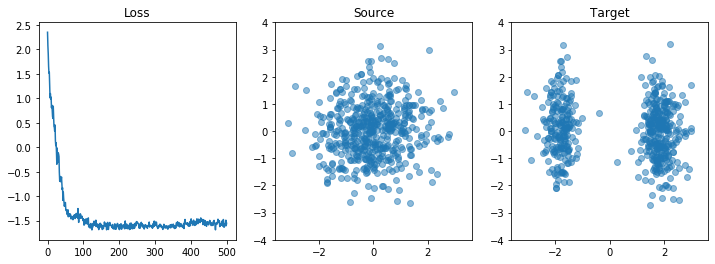








 46%|████▌     | 501/1100 [04:24<06:38,  1.50it/s]






 46%|████▌     | 502/1100 [04:25<06:10,  1.61it/s]






 46%|████▌     | 503/1100 [04:25<05:39,  1.76it/s]






 46%|████▌     | 504/1100 [04:26<05:31,  1.80it/s]






 46%|████▌     | 505/1100 [04:26<05:21,  1.85it/s]






 46%|████▌     | 506/1100 [04:27<05:16,  1.88it/s]






 46%|████▌     | 507/1100 [04:27<05:05,  1.94it/s]






 46%|████▌     | 508/1100 [04:28<05:09,  1.91it/s]






 46%|████▋     | 509/1100 [04:28<05:13,  1.88it/s]






 46%|████▋     | 510/1100 [04:29<05:08,  1.91it/s]

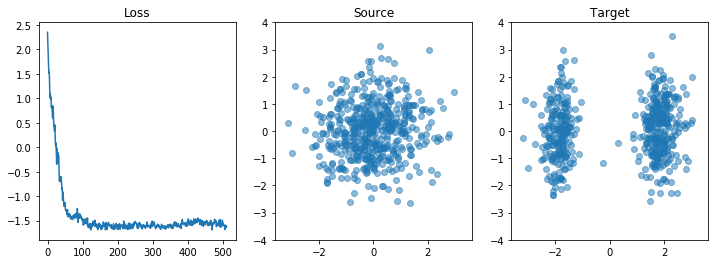








 46%|████▋     | 511/1100 [04:30<06:26,  1.52it/s]






 47%|████▋     | 512/1100 [04:30<06:01,  1.63it/s]






 47%|████▋     | 513/1100 [04:31<05:49,  1.68it/s]






 47%|████▋     | 514/1100 [04:31<05:38,  1.73it/s]






 47%|████▋     | 515/1100 [04:32<05:18,  1.84it/s]






 47%|████▋     | 516/1100 [04:32<05:10,  1.88it/s]






 47%|████▋     | 517/1100 [04:33<05:14,  1.85it/s]






 47%|████▋     | 518/1100 [04:33<05:09,  1.88it/s]






 47%|████▋     | 519/1100 [04:34<04:52,  1.99it/s]






 47%|████▋     | 520/1100 [04:34<04:58,  1.94it/s]

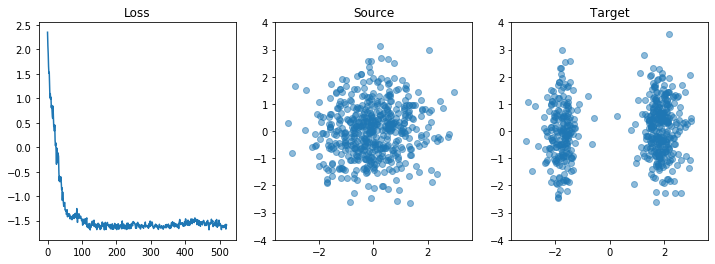








 47%|████▋     | 521/1100 [04:35<06:11,  1.56it/s]






 47%|████▋     | 522/1100 [04:36<05:49,  1.65it/s]






 48%|████▊     | 523/1100 [04:36<05:22,  1.79it/s]






 48%|████▊     | 524/1100 [04:37<05:04,  1.89it/s]






 48%|████▊     | 525/1100 [04:37<05:03,  1.90it/s]






 48%|████▊     | 526/1100 [04:38<05:03,  1.89it/s]






 48%|████▊     | 527/1100 [04:38<04:53,  1.95it/s]






 48%|████▊     | 528/1100 [04:39<04:54,  1.95it/s]






 48%|████▊     | 529/1100 [04:39<04:50,  1.97it/s]






 48%|████▊     | 530/1100 [04:40<04:43,  2.01it/s]

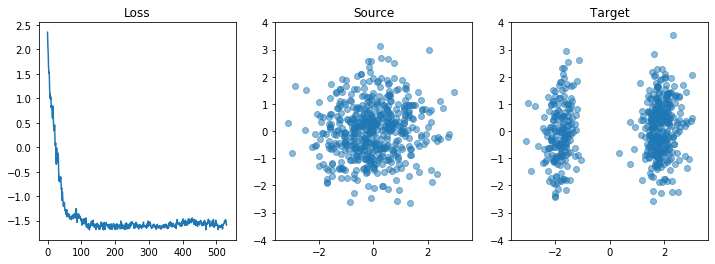








 48%|████▊     | 531/1100 [04:41<06:08,  1.54it/s]






 48%|████▊     | 532/1100 [04:41<05:46,  1.64it/s]






 48%|████▊     | 533/1100 [04:42<05:27,  1.73it/s]






 49%|████▊     | 534/1100 [04:42<05:18,  1.78it/s]






 49%|████▊     | 535/1100 [04:43<05:15,  1.79it/s]






 49%|████▊     | 536/1100 [04:43<05:02,  1.87it/s]






 49%|████▉     | 537/1100 [04:44<04:56,  1.90it/s]






 49%|████▉     | 538/1100 [04:44<04:46,  1.96it/s]






 49%|████▉     | 539/1100 [04:45<04:57,  1.89it/s]






 49%|████▉     | 540/1100 [04:45<04:50,  1.93it/s]

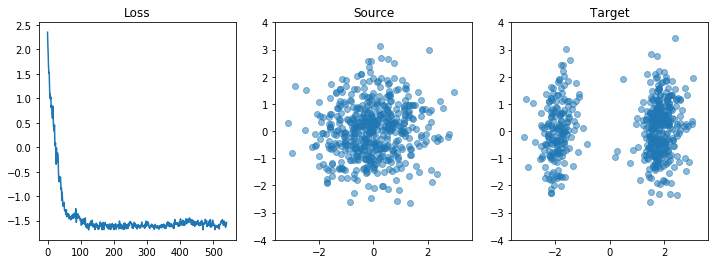








 49%|████▉     | 541/1100 [04:46<06:24,  1.45it/s]






 49%|████▉     | 542/1100 [04:47<06:00,  1.55it/s]






 49%|████▉     | 543/1100 [04:47<05:33,  1.67it/s]






 49%|████▉     | 544/1100 [04:48<05:18,  1.74it/s]






 50%|████▉     | 545/1100 [04:49<05:10,  1.79it/s]






 50%|████▉     | 546/1100 [04:49<05:00,  1.84it/s]






 50%|████▉     | 547/1100 [04:50<04:52,  1.89it/s]






 50%|████▉     | 548/1100 [04:50<04:49,  1.91it/s]






 50%|████▉     | 549/1100 [04:51<04:53,  1.88it/s]






 50%|█████     | 550/1100 [04:51<04:42,  1.95it/s]

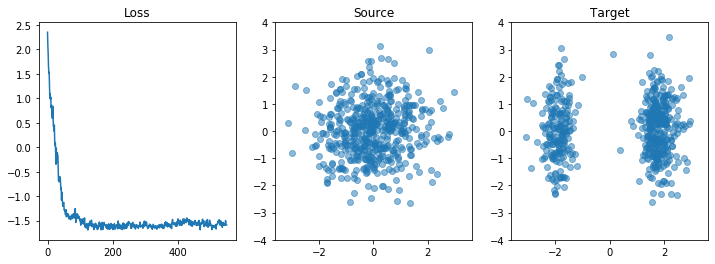








 50%|█████     | 551/1100 [04:52<06:01,  1.52it/s]






 50%|█████     | 552/1100 [04:53<05:38,  1.62it/s]






 50%|█████     | 553/1100 [04:53<05:10,  1.76it/s]






 50%|█████     | 554/1100 [04:54<04:54,  1.86it/s]






 50%|█████     | 555/1100 [04:54<04:58,  1.83it/s]






 51%|█████     | 556/1100 [04:55<04:55,  1.84it/s]






 51%|█████     | 557/1100 [04:55<04:48,  1.88it/s]






 51%|█████     | 558/1100 [04:56<04:51,  1.86it/s]






 51%|█████     | 559/1100 [04:56<04:51,  1.85it/s]






 51%|█████     | 560/1100 [04:57<04:37,  1.95it/s]

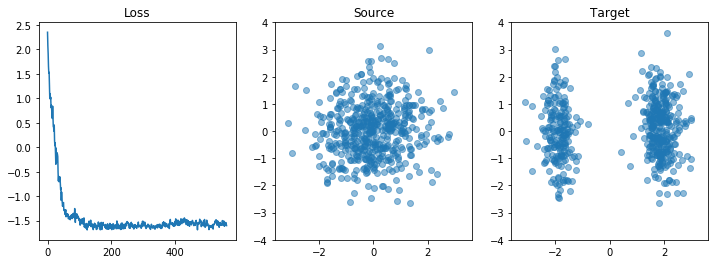








 51%|█████     | 561/1100 [04:58<05:50,  1.54it/s]






 51%|█████     | 562/1100 [04:58<05:21,  1.67it/s]






 51%|█████     | 563/1100 [04:59<05:01,  1.78it/s]






 51%|█████▏    | 564/1100 [04:59<05:08,  1.74it/s]






 51%|█████▏    | 565/1100 [05:00<04:52,  1.83it/s]






 51%|█████▏    | 566/1100 [05:00<04:52,  1.83it/s]






 52%|█████▏    | 567/1100 [05:01<04:41,  1.89it/s]






 52%|█████▏    | 568/1100 [05:01<04:33,  1.95it/s]






 52%|█████▏    | 569/1100 [05:02<04:35,  1.93it/s]






 52%|█████▏    | 570/1100 [05:02<04:29,  1.97it/s]

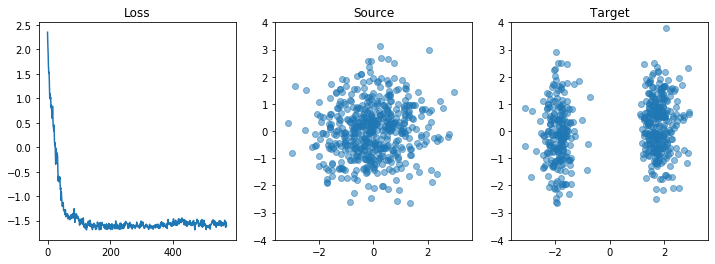








 52%|█████▏    | 571/1100 [05:03<05:55,  1.49it/s]






 52%|█████▏    | 572/1100 [05:04<05:28,  1.61it/s]






 52%|█████▏    | 573/1100 [05:04<05:13,  1.68it/s]






 52%|█████▏    | 574/1100 [05:05<05:01,  1.74it/s]






 52%|█████▏    | 575/1100 [05:05<04:48,  1.82it/s]






 52%|█████▏    | 576/1100 [05:06<04:35,  1.90it/s]






 52%|█████▏    | 577/1100 [05:06<04:43,  1.84it/s]






 53%|█████▎    | 578/1100 [05:07<04:36,  1.89it/s]






 53%|█████▎    | 579/1100 [05:07<04:27,  1.95it/s]






 53%|█████▎    | 580/1100 [05:08<04:35,  1.89it/s]

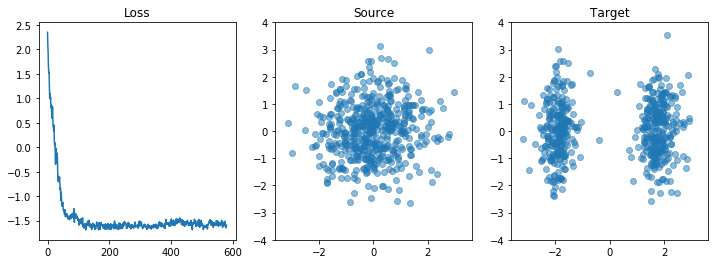








 53%|█████▎    | 581/1100 [05:09<05:56,  1.46it/s]






 53%|█████▎    | 582/1100 [05:09<05:26,  1.59it/s]






 53%|█████▎    | 583/1100 [05:10<05:02,  1.71it/s]






 53%|█████▎    | 584/1100 [05:10<04:45,  1.81it/s]






 53%|█████▎    | 585/1100 [05:11<04:43,  1.81it/s]






 53%|█████▎    | 586/1100 [05:11<04:29,  1.91it/s]






 53%|█████▎    | 587/1100 [05:12<04:25,  1.93it/s]






 53%|█████▎    | 588/1100 [05:12<04:25,  1.93it/s]






 54%|█████▎    | 589/1100 [05:13<04:27,  1.91it/s]






 54%|█████▎    | 590/1100 [05:13<04:20,  1.96it/s]

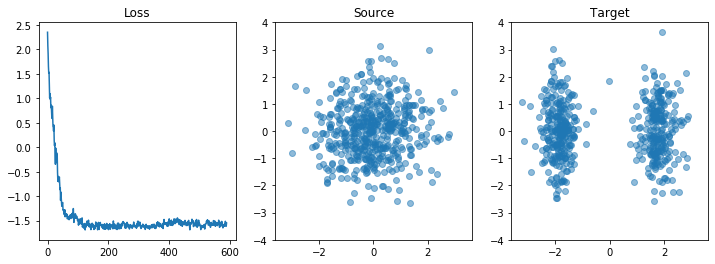








 54%|█████▎    | 591/1100 [05:14<05:38,  1.51it/s]






 54%|█████▍    | 592/1100 [05:15<05:11,  1.63it/s]






 54%|█████▍    | 593/1100 [05:16<04:58,  1.70it/s]






 54%|█████▍    | 594/1100 [05:16<04:48,  1.75it/s]






 54%|█████▍    | 595/1100 [05:17<04:35,  1.84it/s]






 54%|█████▍    | 596/1100 [05:17<04:31,  1.85it/s]






 54%|█████▍    | 597/1100 [05:18<04:36,  1.82it/s]






 54%|█████▍    | 598/1100 [05:18<04:22,  1.92it/s]






 54%|█████▍    | 599/1100 [05:19<04:21,  1.92it/s]






 55%|█████▍    | 600/1100 [05:19<04:10,  2.00it/s]

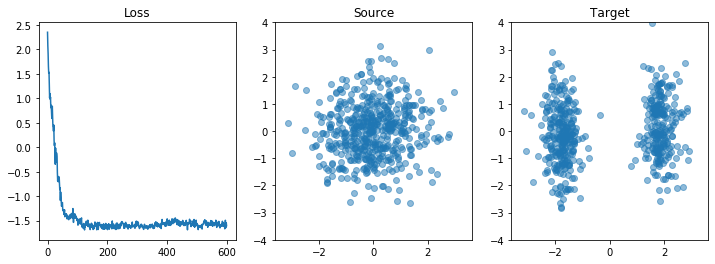








 55%|█████▍    | 601/1100 [05:20<05:34,  1.49it/s]






 55%|█████▍    | 602/1100 [05:21<05:02,  1.64it/s]






 55%|█████▍    | 603/1100 [05:21<04:41,  1.76it/s]






 55%|█████▍    | 604/1100 [05:22<04:26,  1.86it/s]






 55%|█████▌    | 605/1100 [05:22<04:25,  1.86it/s]






 55%|█████▌    | 606/1100 [05:23<04:16,  1.92it/s]






 55%|█████▌    | 607/1100 [05:23<04:04,  2.01it/s]






 55%|█████▌    | 608/1100 [05:23<03:58,  2.06it/s]






 55%|█████▌    | 609/1100 [05:24<04:01,  2.03it/s]






 55%|█████▌    | 610/1100 [05:24<03:55,  2.08it/s]

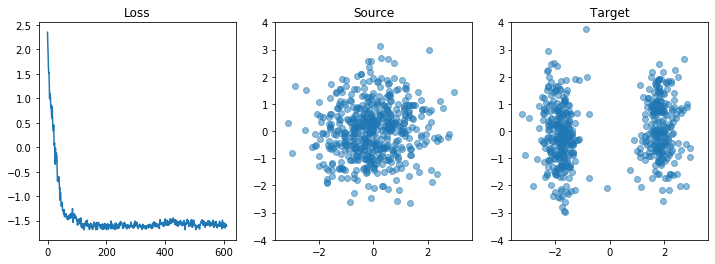








 56%|█████▌    | 611/1100 [05:25<05:10,  1.58it/s]






 56%|█████▌    | 612/1100 [05:26<04:55,  1.65it/s]






 56%|█████▌    | 613/1100 [05:26<04:40,  1.74it/s]






 56%|█████▌    | 614/1100 [05:27<04:26,  1.82it/s]






 56%|█████▌    | 615/1100 [05:27<04:21,  1.86it/s]






 56%|█████▌    | 616/1100 [05:28<04:13,  1.91it/s]






 56%|█████▌    | 617/1100 [05:28<04:16,  1.88it/s]






 56%|█████▌    | 618/1100 [05:29<04:00,  2.01it/s]






 56%|█████▋    | 619/1100 [05:29<04:01,  1.99it/s]






 56%|█████▋    | 620/1100 [05:30<03:59,  2.00it/s]

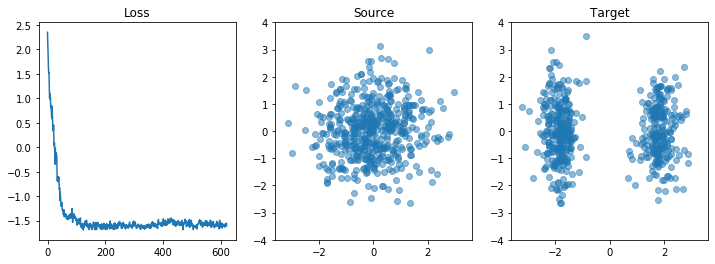








 56%|█████▋    | 621/1100 [05:31<05:12,  1.53it/s]






 57%|█████▋    | 622/1100 [05:31<04:43,  1.68it/s]






 57%|█████▋    | 623/1100 [05:32<04:30,  1.76it/s]






 57%|█████▋    | 624/1100 [05:32<04:16,  1.86it/s]






 57%|█████▋    | 625/1100 [05:33<04:13,  1.87it/s]






 57%|█████▋    | 626/1100 [05:33<04:07,  1.92it/s]






 57%|█████▋    | 627/1100 [05:34<04:03,  1.95it/s]






 57%|█████▋    | 628/1100 [05:34<03:59,  1.97it/s]






 57%|█████▋    | 629/1100 [05:35<03:54,  2.01it/s]






 57%|█████▋    | 630/1100 [05:35<03:56,  1.99it/s]

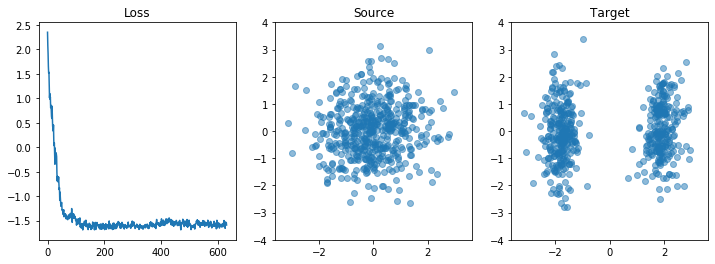








 57%|█████▋    | 631/1100 [05:36<05:09,  1.51it/s]






 57%|█████▋    | 632/1100 [05:37<04:50,  1.61it/s]






 58%|█████▊    | 633/1100 [05:37<04:34,  1.70it/s]






 58%|█████▊    | 634/1100 [05:38<04:18,  1.80it/s]






 58%|█████▊    | 635/1100 [05:38<04:07,  1.88it/s]






 58%|█████▊    | 636/1100 [05:39<04:03,  1.90it/s]






 58%|█████▊    | 637/1100 [05:39<03:57,  1.95it/s]






 58%|█████▊    | 638/1100 [05:40<03:45,  2.05it/s]






 58%|█████▊    | 639/1100 [05:40<03:43,  2.07it/s]






 58%|█████▊    | 640/1100 [05:41<03:42,  2.06it/s]

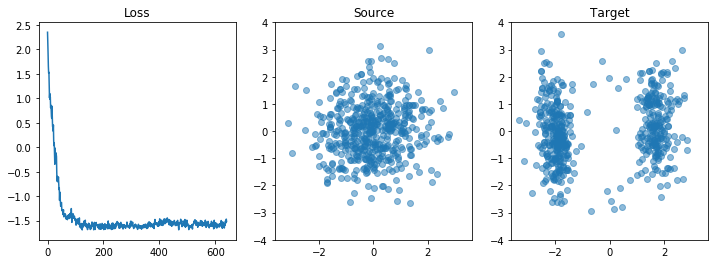








 58%|█████▊    | 641/1100 [05:42<04:53,  1.57it/s]






 58%|█████▊    | 642/1100 [05:42<04:28,  1.70it/s]






 58%|█████▊    | 643/1100 [05:43<04:13,  1.80it/s]






 59%|█████▊    | 644/1100 [05:43<04:10,  1.82it/s]






 59%|█████▊    | 645/1100 [05:44<03:58,  1.91it/s]






 59%|█████▊    | 646/1100 [05:44<03:46,  2.00it/s]






 59%|█████▉    | 647/1100 [05:45<03:49,  1.98it/s]






 59%|█████▉    | 648/1100 [05:45<03:53,  1.94it/s]






 59%|█████▉    | 649/1100 [05:46<03:50,  1.96it/s]






 59%|█████▉    | 650/1100 [05:46<03:42,  2.02it/s]

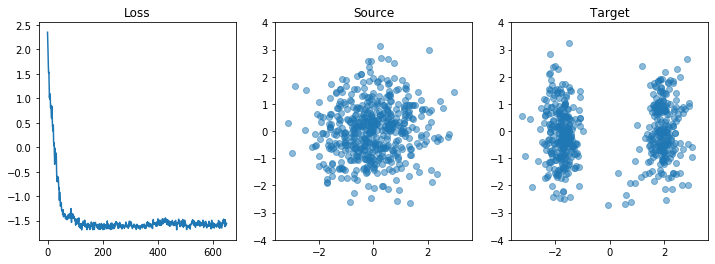








 59%|█████▉    | 651/1100 [05:47<04:48,  1.56it/s]






 59%|█████▉    | 652/1100 [05:48<04:27,  1.67it/s]






 59%|█████▉    | 653/1100 [05:48<04:10,  1.78it/s]






 59%|█████▉    | 654/1100 [05:49<03:54,  1.90it/s]






 60%|█████▉    | 655/1100 [05:49<03:49,  1.94it/s]






 60%|█████▉    | 656/1100 [05:50<03:41,  2.00it/s]






 60%|█████▉    | 657/1100 [05:50<03:41,  2.00it/s]






 60%|█████▉    | 658/1100 [05:51<03:50,  1.92it/s]






 60%|█████▉    | 659/1100 [05:51<03:47,  1.94it/s]






 60%|██████    | 660/1100 [05:52<03:42,  1.98it/s]

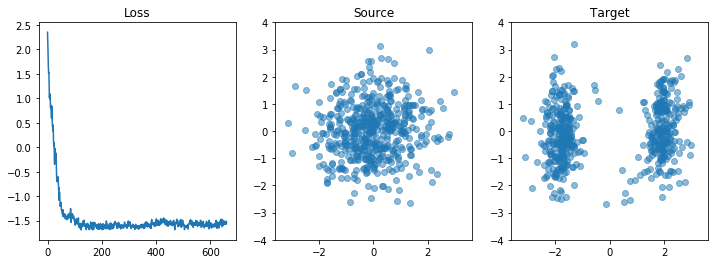








 60%|██████    | 661/1100 [05:53<04:52,  1.50it/s]






 60%|██████    | 662/1100 [05:53<04:30,  1.62it/s]






 60%|██████    | 663/1100 [05:54<04:16,  1.70it/s]






 60%|██████    | 664/1100 [05:54<04:03,  1.79it/s]






 60%|██████    | 665/1100 [05:55<03:47,  1.91it/s]






 61%|██████    | 666/1100 [05:55<03:41,  1.96it/s]






 61%|██████    | 667/1100 [05:56<03:49,  1.89it/s]






 61%|██████    | 668/1100 [05:56<03:40,  1.96it/s]






 61%|██████    | 669/1100 [05:57<03:37,  1.99it/s]






 61%|██████    | 670/1100 [05:57<03:36,  1.99it/s]

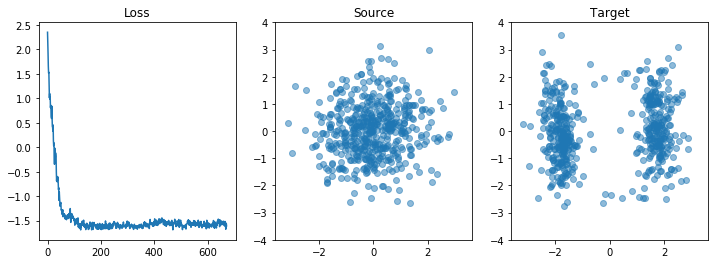








 61%|██████    | 671/1100 [05:58<04:44,  1.51it/s]






 61%|██████    | 672/1100 [05:59<04:22,  1.63it/s]






 61%|██████    | 673/1100 [05:59<04:12,  1.69it/s]






 61%|██████▏   | 674/1100 [06:00<04:01,  1.76it/s]






 61%|██████▏   | 675/1100 [06:00<03:48,  1.86it/s]






 61%|██████▏   | 676/1100 [06:01<03:44,  1.89it/s]






 62%|██████▏   | 677/1100 [06:01<03:42,  1.90it/s]






 62%|██████▏   | 678/1100 [06:02<03:37,  1.94it/s]






 62%|██████▏   | 679/1100 [06:02<03:33,  1.97it/s]






 62%|██████▏   | 680/1100 [06:03<03:30,  2.00it/s]

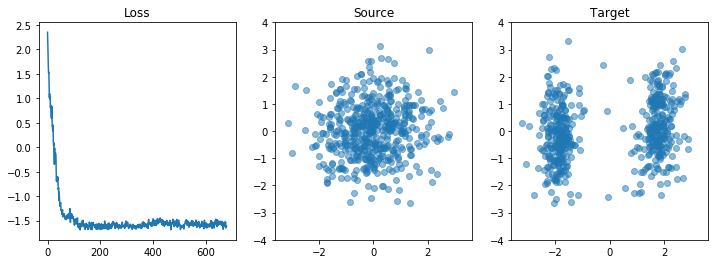








 62%|██████▏   | 681/1100 [06:04<04:38,  1.50it/s]






 62%|██████▏   | 682/1100 [06:04<04:15,  1.63it/s]






 62%|██████▏   | 683/1100 [06:05<04:10,  1.67it/s]






 62%|██████▏   | 684/1100 [06:05<03:49,  1.81it/s]






 62%|██████▏   | 685/1100 [06:06<03:40,  1.88it/s]






 62%|██████▏   | 686/1100 [06:06<03:28,  1.99it/s]






 62%|██████▏   | 687/1100 [06:07<03:33,  1.94it/s]






 63%|██████▎   | 688/1100 [06:07<03:27,  1.99it/s]






 63%|██████▎   | 689/1100 [06:08<03:16,  2.09it/s]






 63%|██████▎   | 690/1100 [06:08<03:21,  2.04it/s]

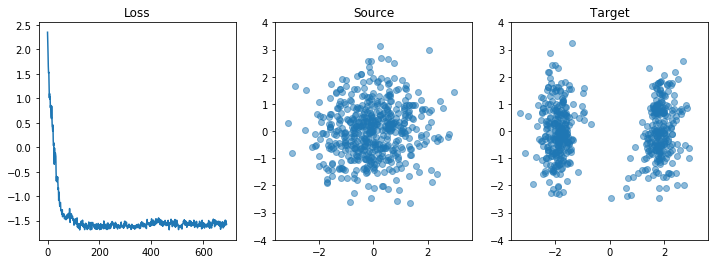








 63%|██████▎   | 691/1100 [06:09<04:27,  1.53it/s]






 63%|██████▎   | 692/1100 [06:10<04:08,  1.64it/s]






 63%|██████▎   | 693/1100 [06:10<03:54,  1.74it/s]






 63%|██████▎   | 694/1100 [06:11<03:49,  1.77it/s]






 63%|██████▎   | 695/1100 [06:11<03:41,  1.83it/s]






 63%|██████▎   | 696/1100 [06:12<03:32,  1.90it/s]






 63%|██████▎   | 697/1100 [06:12<03:26,  1.95it/s]






 63%|██████▎   | 698/1100 [06:13<03:20,  2.01it/s]






 64%|██████▎   | 699/1100 [06:13<03:12,  2.08it/s]






 64%|██████▎   | 700/1100 [06:13<03:09,  2.11it/s]

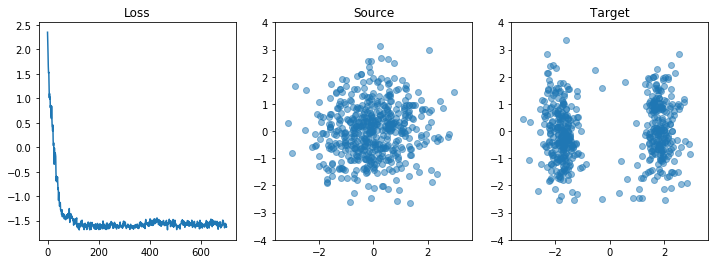








 64%|██████▎   | 701/1100 [06:14<04:05,  1.63it/s]






 64%|██████▍   | 702/1100 [06:15<03:48,  1.74it/s]






 64%|██████▍   | 703/1100 [06:15<03:50,  1.72it/s]






 64%|██████▍   | 704/1100 [06:16<03:45,  1.75it/s]






 64%|██████▍   | 705/1100 [06:17<03:46,  1.75it/s]






 64%|██████▍   | 706/1100 [06:17<03:40,  1.79it/s]






 64%|██████▍   | 707/1100 [06:18<03:42,  1.77it/s]






 64%|██████▍   | 708/1100 [06:18<03:42,  1.76it/s]






 64%|██████▍   | 709/1100 [06:19<03:34,  1.82it/s]






 65%|██████▍   | 710/1100 [06:19<03:32,  1.84it/s]

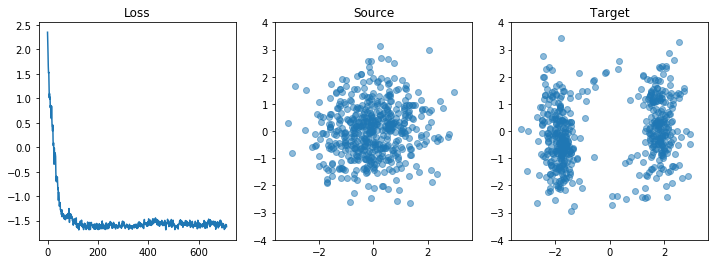








 65%|██████▍   | 711/1100 [06:20<04:24,  1.47it/s]






 65%|██████▍   | 712/1100 [06:21<04:07,  1.57it/s]






 65%|██████▍   | 713/1100 [06:21<03:59,  1.62it/s]






 65%|██████▍   | 714/1100 [06:22<03:47,  1.70it/s]






 65%|██████▌   | 715/1100 [06:22<03:37,  1.77it/s]






 65%|██████▌   | 716/1100 [06:23<03:38,  1.76it/s]






 65%|██████▌   | 717/1100 [06:23<03:24,  1.87it/s]






 65%|██████▌   | 718/1100 [06:24<03:17,  1.93it/s]






 65%|██████▌   | 719/1100 [06:25<03:21,  1.89it/s]






 65%|██████▌   | 720/1100 [06:25<03:23,  1.87it/s]

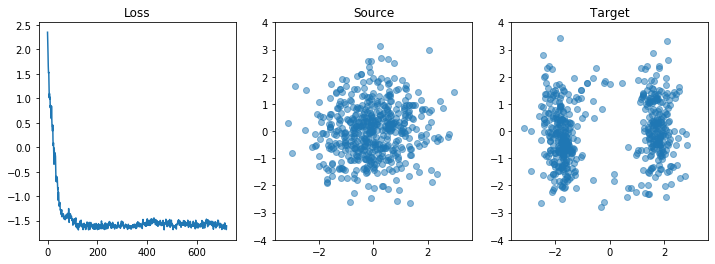








 66%|██████▌   | 721/1100 [06:26<04:31,  1.40it/s]






 66%|██████▌   | 722/1100 [06:27<04:09,  1.51it/s]






 66%|██████▌   | 723/1100 [06:27<03:54,  1.60it/s]






 66%|██████▌   | 724/1100 [06:28<03:39,  1.71it/s]






 66%|██████▌   | 725/1100 [06:28<03:30,  1.78it/s]






 66%|██████▌   | 726/1100 [06:29<03:26,  1.81it/s]






 66%|██████▌   | 727/1100 [06:29<03:23,  1.83it/s]






 66%|██████▌   | 728/1100 [06:30<03:18,  1.87it/s]






 66%|██████▋   | 729/1100 [06:30<03:10,  1.95it/s]






 66%|██████▋   | 730/1100 [06:31<03:09,  1.95it/s]

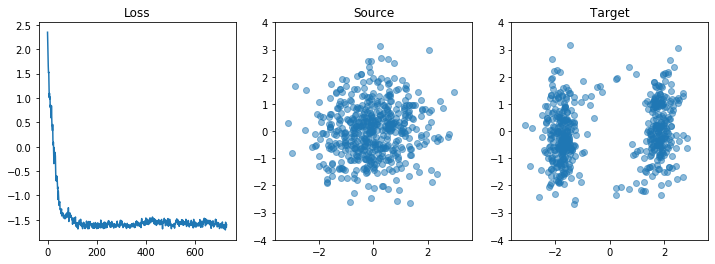








 66%|██████▋   | 731/1100 [06:32<04:03,  1.51it/s]






 67%|██████▋   | 732/1100 [06:32<03:46,  1.63it/s]






 67%|██████▋   | 733/1100 [06:33<03:31,  1.73it/s]






 67%|██████▋   | 734/1100 [06:33<03:20,  1.82it/s]






 67%|██████▋   | 735/1100 [06:34<03:17,  1.85it/s]






 67%|██████▋   | 736/1100 [06:34<03:13,  1.88it/s]






 67%|██████▋   | 737/1100 [06:35<03:13,  1.88it/s]






 67%|██████▋   | 738/1100 [06:35<03:05,  1.95it/s]






 67%|██████▋   | 739/1100 [06:36<03:03,  1.97it/s]






 67%|██████▋   | 740/1100 [06:36<03:08,  1.91it/s]

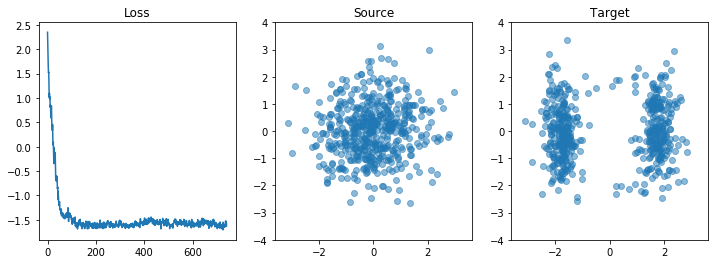








 67%|██████▋   | 741/1100 [06:37<03:57,  1.51it/s]






 67%|██████▋   | 742/1100 [06:38<03:37,  1.65it/s]






 68%|██████▊   | 743/1100 [06:38<03:25,  1.74it/s]






 68%|██████▊   | 744/1100 [06:39<03:15,  1.82it/s]






 68%|██████▊   | 745/1100 [06:39<03:09,  1.87it/s]






 68%|██████▊   | 746/1100 [06:40<03:03,  1.93it/s]






 68%|██████▊   | 747/1100 [06:40<03:01,  1.94it/s]






 68%|██████▊   | 748/1100 [06:41<03:00,  1.95it/s]






 68%|██████▊   | 749/1100 [06:41<03:04,  1.90it/s]






 68%|██████▊   | 750/1100 [06:42<03:02,  1.91it/s]

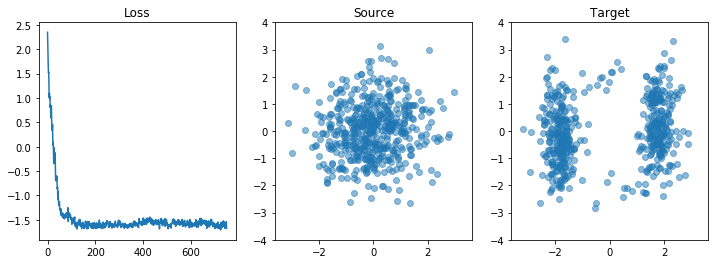








 68%|██████▊   | 751/1100 [06:43<04:01,  1.45it/s]






 68%|██████▊   | 752/1100 [06:44<03:51,  1.50it/s]






 68%|██████▊   | 753/1100 [06:44<03:41,  1.57it/s]






 69%|██████▊   | 754/1100 [06:45<03:32,  1.63it/s]






 69%|██████▊   | 755/1100 [06:45<03:29,  1.64it/s]






 69%|██████▊   | 756/1100 [06:46<03:24,  1.68it/s]






 69%|██████▉   | 757/1100 [06:46<03:16,  1.74it/s]






 69%|██████▉   | 758/1100 [06:47<03:14,  1.76it/s]






 69%|██████▉   | 759/1100 [06:48<03:11,  1.78it/s]






 69%|██████▉   | 760/1100 [06:48<03:16,  1.73it/s]

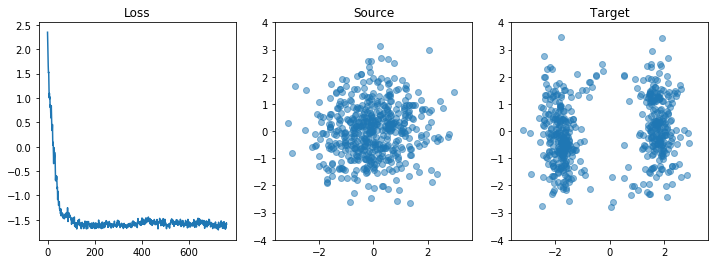








 69%|██████▉   | 761/1100 [06:49<04:13,  1.34it/s]






 69%|██████▉   | 762/1100 [06:50<03:54,  1.44it/s]






 69%|██████▉   | 763/1100 [06:50<03:34,  1.57it/s]






 69%|██████▉   | 764/1100 [06:51<03:25,  1.64it/s]






 70%|██████▉   | 765/1100 [06:51<03:16,  1.71it/s]






 70%|██████▉   | 766/1100 [06:52<03:03,  1.82it/s]






 70%|██████▉   | 767/1100 [06:52<03:00,  1.85it/s]






 70%|██████▉   | 768/1100 [06:53<02:56,  1.88it/s]






 70%|██████▉   | 769/1100 [06:53<02:52,  1.92it/s]






 70%|███████   | 770/1100 [06:54<02:55,  1.88it/s]

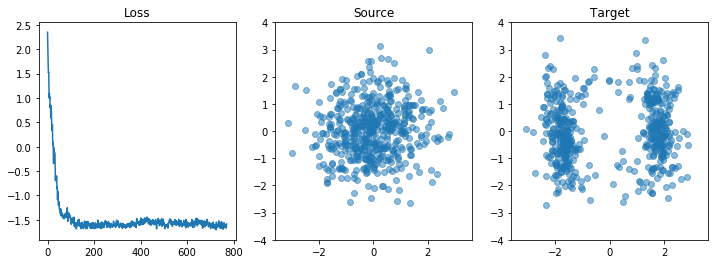








 70%|███████   | 771/1100 [06:55<03:51,  1.42it/s]






 70%|███████   | 772/1100 [06:56<03:42,  1.47it/s]






 70%|███████   | 773/1100 [06:56<03:31,  1.55it/s]






 70%|███████   | 774/1100 [06:57<03:19,  1.63it/s]






 70%|███████   | 775/1100 [06:57<03:06,  1.74it/s]






 71%|███████   | 776/1100 [06:58<02:58,  1.81it/s]






 71%|███████   | 777/1100 [06:58<03:00,  1.79it/s]






 71%|███████   | 778/1100 [06:59<03:01,  1.77it/s]






 71%|███████   | 779/1100 [06:59<02:58,  1.80it/s]






 71%|███████   | 780/1100 [07:00<02:55,  1.82it/s]

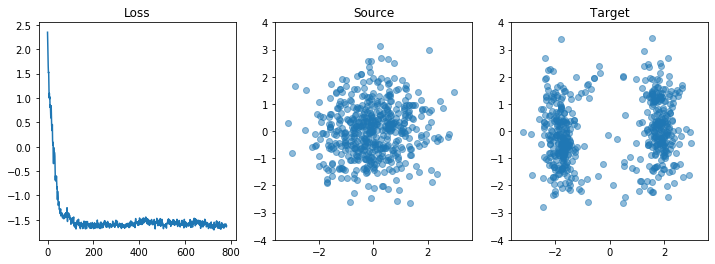








 71%|███████   | 781/1100 [07:01<03:50,  1.38it/s]






 71%|███████   | 782/1100 [07:02<03:32,  1.50it/s]






 71%|███████   | 783/1100 [07:02<03:23,  1.56it/s]






 71%|███████▏  | 784/1100 [07:03<03:17,  1.60it/s]






 71%|███████▏  | 785/1100 [07:03<03:10,  1.66it/s]






 71%|███████▏  | 786/1100 [07:04<03:02,  1.72it/s]






 72%|███████▏  | 787/1100 [07:04<02:53,  1.80it/s]






 72%|███████▏  | 788/1100 [07:05<02:49,  1.85it/s]






 72%|███████▏  | 789/1100 [07:05<02:50,  1.82it/s]






 72%|███████▏  | 790/1100 [07:06<02:47,  1.85it/s]

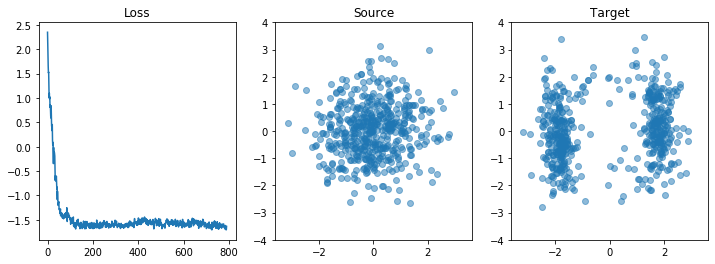








 72%|███████▏  | 791/1100 [07:07<03:38,  1.41it/s]






 72%|███████▏  | 792/1100 [07:08<03:23,  1.51it/s]






 72%|███████▏  | 793/1100 [07:08<03:07,  1.64it/s]






 72%|███████▏  | 794/1100 [07:09<02:57,  1.72it/s]






 72%|███████▏  | 795/1100 [07:09<02:52,  1.77it/s]






 72%|███████▏  | 796/1100 [07:10<02:51,  1.77it/s]






 72%|███████▏  | 797/1100 [07:10<02:53,  1.75it/s]






 73%|███████▎  | 798/1100 [07:11<02:50,  1.77it/s]






 73%|███████▎  | 799/1100 [07:11<02:45,  1.81it/s]






 73%|███████▎  | 800/1100 [07:12<02:42,  1.84it/s]

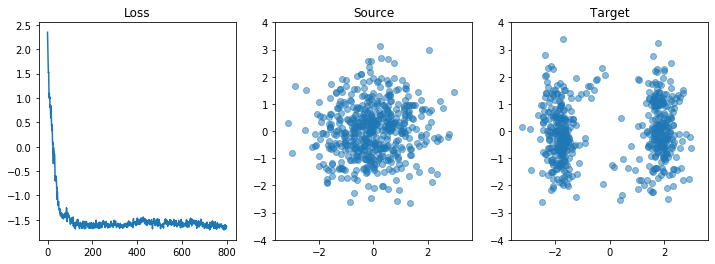








 73%|███████▎  | 801/1100 [07:13<03:25,  1.46it/s]






 73%|███████▎  | 802/1100 [07:13<03:07,  1.59it/s]






 73%|███████▎  | 803/1100 [07:14<02:57,  1.67it/s]






 73%|███████▎  | 804/1100 [07:14<02:47,  1.77it/s]






 73%|███████▎  | 805/1100 [07:15<02:42,  1.81it/s]






 73%|███████▎  | 806/1100 [07:16<02:38,  1.85it/s]






 73%|███████▎  | 807/1100 [07:16<02:33,  1.91it/s]






 73%|███████▎  | 808/1100 [07:17<02:35,  1.88it/s]






 74%|███████▎  | 809/1100 [07:17<02:34,  1.89it/s]






 74%|███████▎  | 810/1100 [07:18<02:34,  1.87it/s]

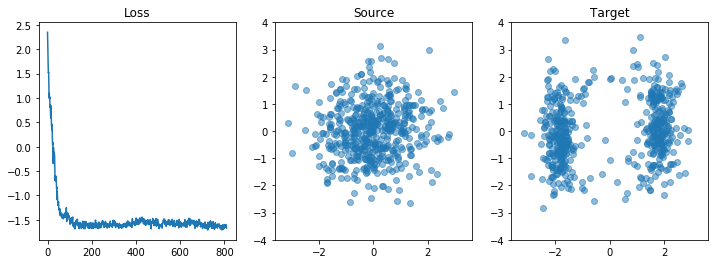








 74%|███████▎  | 811/1100 [07:19<03:22,  1.43it/s]






 74%|███████▍  | 812/1100 [07:19<03:10,  1.51it/s]






 74%|███████▍  | 813/1100 [07:20<03:02,  1.57it/s]






 74%|███████▍  | 814/1100 [07:20<02:52,  1.66it/s]






 74%|███████▍  | 815/1100 [07:21<02:48,  1.69it/s]






 74%|███████▍  | 816/1100 [07:21<02:39,  1.78it/s]






 74%|███████▍  | 817/1100 [07:22<02:35,  1.82it/s]






 74%|███████▍  | 818/1100 [07:22<02:34,  1.83it/s]






 74%|███████▍  | 819/1100 [07:23<02:37,  1.78it/s]






 75%|███████▍  | 820/1100 [07:24<02:38,  1.76it/s]

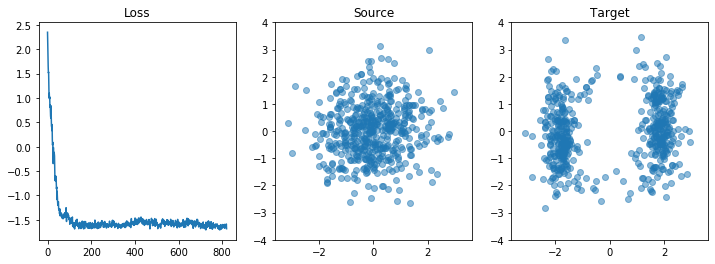








 75%|███████▍  | 821/1100 [07:25<03:24,  1.36it/s]






 75%|███████▍  | 822/1100 [07:25<03:10,  1.46it/s]






 75%|███████▍  | 823/1100 [07:26<02:53,  1.60it/s]






 75%|███████▍  | 824/1100 [07:26<02:46,  1.66it/s]






 75%|███████▌  | 825/1100 [07:27<02:41,  1.70it/s]






 75%|███████▌  | 826/1100 [07:27<02:36,  1.75it/s]






 75%|███████▌  | 827/1100 [07:28<02:34,  1.77it/s]






 75%|███████▌  | 828/1100 [07:29<02:33,  1.78it/s]






 75%|███████▌  | 829/1100 [07:29<02:28,  1.83it/s]






 75%|███████▌  | 830/1100 [07:30<02:28,  1.82it/s]

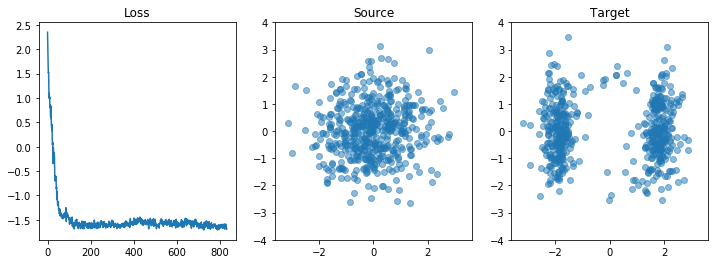








 76%|███████▌  | 831/1100 [07:31<03:10,  1.41it/s]






 76%|███████▌  | 832/1100 [07:31<02:55,  1.53it/s]






 76%|███████▌  | 833/1100 [07:32<02:48,  1.59it/s]






 76%|███████▌  | 834/1100 [07:32<02:39,  1.67it/s]






 76%|███████▌  | 835/1100 [07:33<02:29,  1.77it/s]






 76%|███████▌  | 836/1100 [07:33<02:27,  1.79it/s]






 76%|███████▌  | 837/1100 [07:34<02:18,  1.90it/s]






 76%|███████▌  | 838/1100 [07:34<02:16,  1.93it/s]






 76%|███████▋  | 839/1100 [07:35<02:13,  1.96it/s]






 76%|███████▋  | 840/1100 [07:35<02:16,  1.90it/s]

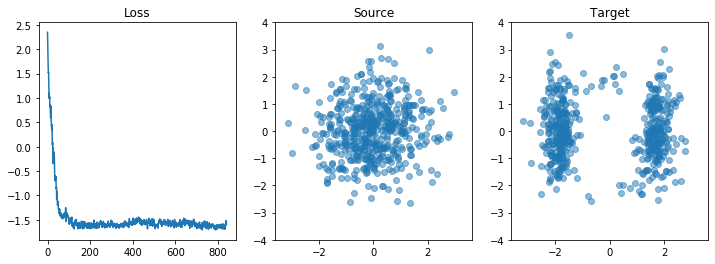








 76%|███████▋  | 841/1100 [07:37<03:01,  1.43it/s]






 77%|███████▋  | 842/1100 [07:37<02:47,  1.54it/s]






 77%|███████▋  | 843/1100 [07:38<02:36,  1.64it/s]






 77%|███████▋  | 844/1100 [07:38<02:30,  1.70it/s]






 77%|███████▋  | 845/1100 [07:39<02:25,  1.75it/s]






 77%|███████▋  | 846/1100 [07:39<02:19,  1.82it/s]






 77%|███████▋  | 847/1100 [07:40<02:24,  1.75it/s]






 77%|███████▋  | 848/1100 [07:40<02:29,  1.69it/s]






 77%|███████▋  | 849/1100 [07:41<02:21,  1.77it/s]






 77%|███████▋  | 850/1100 [07:41<02:20,  1.78it/s]

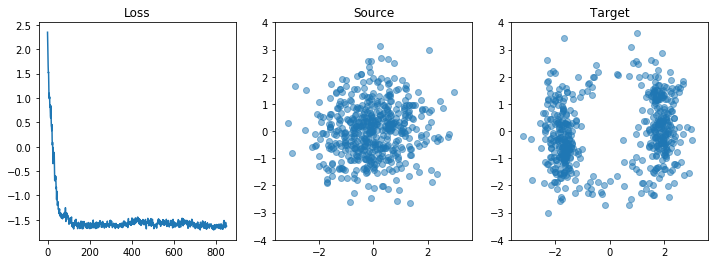








 77%|███████▋  | 851/1100 [07:43<03:06,  1.33it/s]






 77%|███████▋  | 852/1100 [07:43<02:53,  1.43it/s]






 78%|███████▊  | 853/1100 [07:44<02:40,  1.54it/s]






 78%|███████▊  | 854/1100 [07:44<02:34,  1.59it/s]






 78%|███████▊  | 855/1100 [07:45<02:31,  1.61it/s]






 78%|███████▊  | 856/1100 [07:45<02:26,  1.67it/s]






 78%|███████▊  | 857/1100 [07:46<02:22,  1.71it/s]






 78%|███████▊  | 858/1100 [07:47<02:20,  1.72it/s]






 78%|███████▊  | 859/1100 [07:47<02:22,  1.69it/s]






 78%|███████▊  | 860/1100 [07:48<02:19,  1.72it/s]

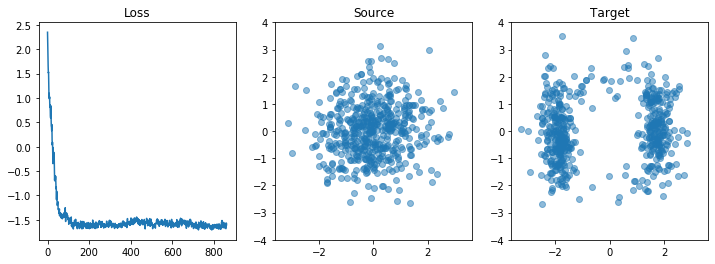








 78%|███████▊  | 861/1100 [07:49<02:57,  1.35it/s]






 78%|███████▊  | 862/1100 [07:49<02:40,  1.48it/s]






 78%|███████▊  | 863/1100 [07:50<02:26,  1.62it/s]






 79%|███████▊  | 864/1100 [07:50<02:24,  1.64it/s]






 79%|███████▊  | 865/1100 [07:51<02:20,  1.67it/s]






 79%|███████▊  | 866/1100 [07:52<02:18,  1.69it/s]






 79%|███████▉  | 867/1100 [07:52<02:14,  1.73it/s]






 79%|███████▉  | 868/1100 [07:53<02:08,  1.80it/s]






 79%|███████▉  | 869/1100 [07:53<02:11,  1.76it/s]






 79%|███████▉  | 870/1100 [07:54<02:11,  1.75it/s]

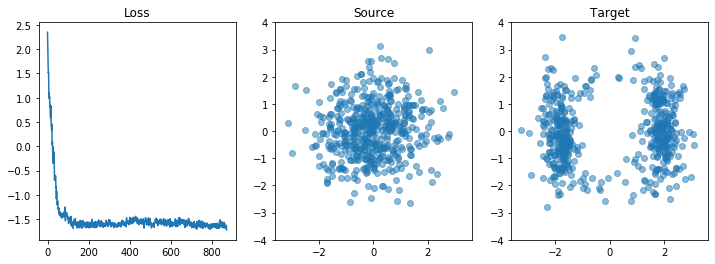








 79%|███████▉  | 871/1100 [07:55<02:49,  1.35it/s]






 79%|███████▉  | 872/1100 [07:56<02:36,  1.46it/s]






 79%|███████▉  | 873/1100 [07:56<02:22,  1.60it/s]






 79%|███████▉  | 874/1100 [07:57<02:23,  1.57it/s]






 80%|███████▉  | 875/1100 [07:57<02:17,  1.64it/s]






 80%|███████▉  | 876/1100 [07:58<02:11,  1.71it/s]






 80%|███████▉  | 877/1100 [07:58<02:08,  1.74it/s]






 80%|███████▉  | 878/1100 [07:59<02:12,  1.68it/s]






 80%|███████▉  | 879/1100 [08:00<02:11,  1.68it/s]






 80%|████████  | 880/1100 [08:00<02:10,  1.68it/s]

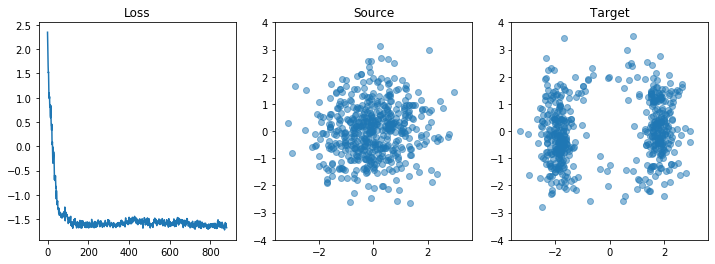








 80%|████████  | 881/1100 [08:01<02:44,  1.33it/s]






 80%|████████  | 882/1100 [08:02<02:30,  1.45it/s]






 80%|████████  | 883/1100 [08:02<02:21,  1.53it/s]






 80%|████████  | 884/1100 [08:03<02:14,  1.60it/s]






 80%|████████  | 885/1100 [08:04<02:11,  1.63it/s]






 81%|████████  | 886/1100 [08:04<02:07,  1.67it/s]






 81%|████████  | 887/1100 [08:05<02:14,  1.58it/s]






 81%|████████  | 888/1100 [08:05<02:10,  1.63it/s]






 81%|████████  | 889/1100 [08:06<02:05,  1.68it/s]






 81%|████████  | 890/1100 [08:07<02:05,  1.67it/s]

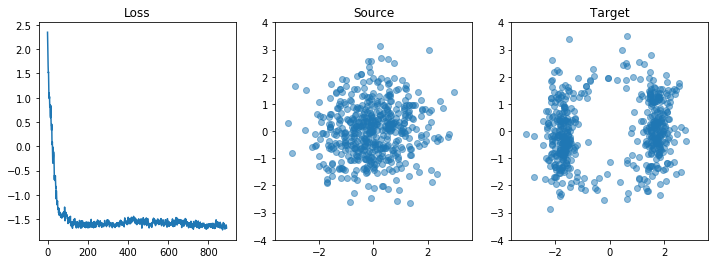








 81%|████████  | 891/1100 [08:08<02:34,  1.35it/s]






 81%|████████  | 892/1100 [08:08<02:22,  1.46it/s]






 81%|████████  | 893/1100 [08:09<02:14,  1.54it/s]






 81%|████████▏ | 894/1100 [08:09<02:09,  1.60it/s]






 81%|████████▏ | 895/1100 [08:10<02:10,  1.57it/s]






 81%|████████▏ | 896/1100 [08:11<02:07,  1.61it/s]






 82%|████████▏ | 897/1100 [08:11<02:07,  1.59it/s]






 82%|████████▏ | 898/1100 [08:12<02:04,  1.62it/s]






 82%|████████▏ | 899/1100 [08:12<01:58,  1.70it/s]






 82%|████████▏ | 900/1100 [08:13<01:54,  1.75it/s]

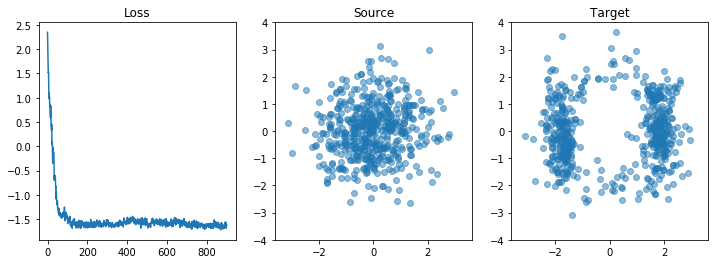








 82%|████████▏ | 901/1100 [08:14<02:28,  1.34it/s]






 82%|████████▏ | 902/1100 [08:15<02:16,  1.45it/s]






 82%|████████▏ | 903/1100 [08:15<02:07,  1.55it/s]






 82%|████████▏ | 904/1100 [08:16<02:05,  1.56it/s]






 82%|████████▏ | 905/1100 [08:16<01:58,  1.65it/s]






 82%|████████▏ | 906/1100 [08:17<01:59,  1.63it/s]






 82%|████████▏ | 907/1100 [08:17<01:56,  1.65it/s]






 83%|████████▎ | 908/1100 [08:18<01:52,  1.70it/s]






 83%|████████▎ | 909/1100 [08:19<01:52,  1.69it/s]






 83%|████████▎ | 910/1100 [08:19<01:48,  1.74it/s]

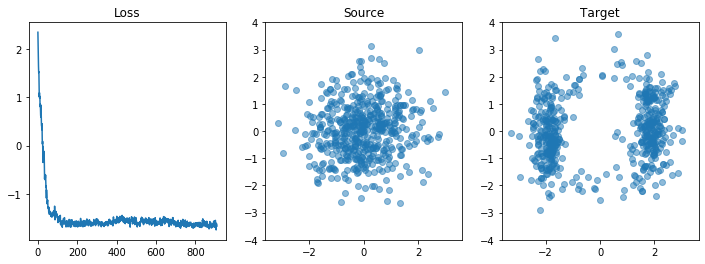








 83%|████████▎ | 911/1100 [08:20<02:18,  1.36it/s]






 83%|████████▎ | 912/1100 [08:21<02:10,  1.44it/s]






 83%|████████▎ | 913/1100 [08:21<02:05,  1.49it/s]






 83%|████████▎ | 914/1100 [08:22<02:01,  1.53it/s]






 83%|████████▎ | 915/1100 [08:23<01:56,  1.59it/s]






 83%|████████▎ | 916/1100 [08:23<01:49,  1.68it/s]






 83%|████████▎ | 917/1100 [08:24<01:50,  1.66it/s]






 83%|████████▎ | 918/1100 [08:24<01:49,  1.66it/s]






 84%|████████▎ | 919/1100 [08:25<01:47,  1.68it/s]






 84%|████████▎ | 920/1100 [08:26<01:48,  1.66it/s]

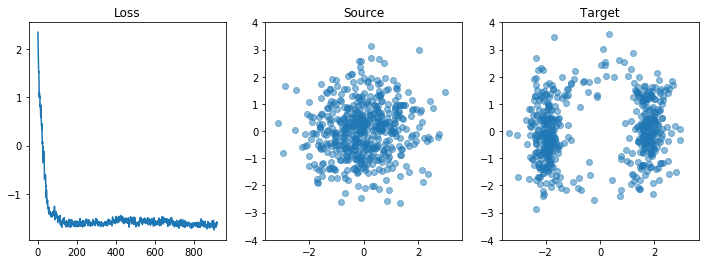








 84%|████████▎ | 921/1100 [08:27<02:12,  1.35it/s]






 84%|████████▍ | 922/1100 [08:27<02:03,  1.44it/s]






 84%|████████▍ | 923/1100 [08:28<01:55,  1.53it/s]






 84%|████████▍ | 924/1100 [08:28<01:53,  1.56it/s]






 84%|████████▍ | 925/1100 [08:29<01:47,  1.63it/s]






 84%|████████▍ | 926/1100 [08:30<01:45,  1.65it/s]






 84%|████████▍ | 927/1100 [08:30<01:41,  1.71it/s]






 84%|████████▍ | 928/1100 [08:31<01:40,  1.71it/s]






 84%|████████▍ | 929/1100 [08:31<01:36,  1.77it/s]






 85%|████████▍ | 930/1100 [08:32<01:36,  1.76it/s]

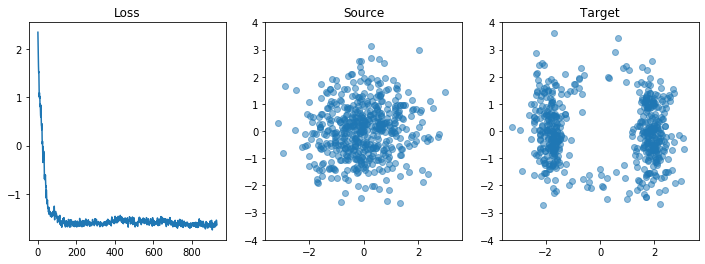








 85%|████████▍ | 931/1100 [08:33<01:56,  1.44it/s]






 85%|████████▍ | 932/1100 [08:33<01:52,  1.49it/s]






 85%|████████▍ | 933/1100 [08:34<01:45,  1.58it/s]






 85%|████████▍ | 934/1100 [08:35<01:45,  1.58it/s]






 85%|████████▌ | 935/1100 [08:35<01:44,  1.59it/s]






 85%|████████▌ | 936/1100 [08:36<01:45,  1.56it/s]






 85%|████████▌ | 937/1100 [08:36<01:43,  1.58it/s]






 85%|████████▌ | 938/1100 [08:37<01:39,  1.63it/s]






 85%|████████▌ | 939/1100 [08:38<01:38,  1.64it/s]






 85%|████████▌ | 940/1100 [08:38<01:36,  1.65it/s]

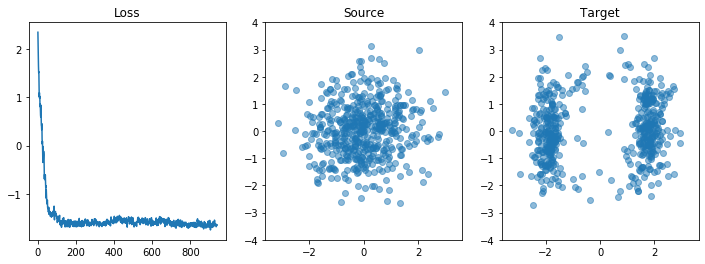








 86%|████████▌ | 941/1100 [08:39<01:59,  1.33it/s]






 86%|████████▌ | 942/1100 [08:40<01:52,  1.41it/s]






 86%|████████▌ | 943/1100 [08:41<01:46,  1.47it/s]






 86%|████████▌ | 944/1100 [08:41<01:40,  1.56it/s]






 86%|████████▌ | 945/1100 [08:42<01:35,  1.62it/s]






 86%|████████▌ | 946/1100 [08:42<01:31,  1.68it/s]






 86%|████████▌ | 947/1100 [08:43<01:30,  1.69it/s]






 86%|████████▌ | 948/1100 [08:43<01:26,  1.76it/s]






 86%|████████▋ | 949/1100 [08:44<01:24,  1.78it/s]






 86%|████████▋ | 950/1100 [08:44<01:23,  1.79it/s]

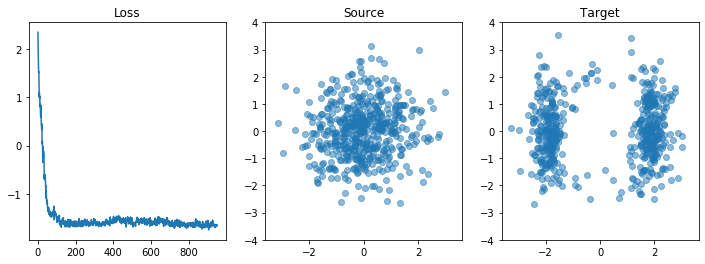








 86%|████████▋ | 951/1100 [08:45<01:45,  1.42it/s]






 87%|████████▋ | 952/1100 [08:46<01:40,  1.47it/s]






 87%|████████▋ | 953/1100 [08:47<01:35,  1.54it/s]






 87%|████████▋ | 954/1100 [08:47<01:30,  1.62it/s]






 87%|████████▋ | 955/1100 [08:48<01:28,  1.65it/s]






 87%|████████▋ | 956/1100 [08:48<01:27,  1.65it/s]






 87%|████████▋ | 957/1100 [08:49<01:27,  1.64it/s]






 87%|████████▋ | 958/1100 [08:50<01:28,  1.61it/s]






 87%|████████▋ | 959/1100 [08:50<01:27,  1.60it/s]






 87%|████████▋ | 960/1100 [08:51<01:26,  1.62it/s]

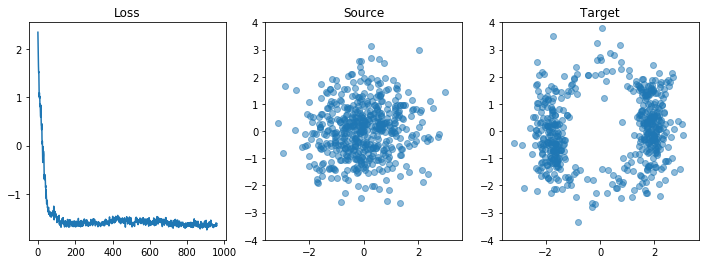








 87%|████████▋ | 961/1100 [08:52<01:48,  1.28it/s]






 87%|████████▋ | 962/1100 [08:53<01:43,  1.33it/s]






 88%|████████▊ | 963/1100 [08:53<01:37,  1.40it/s]






 88%|████████▊ | 964/1100 [08:54<01:33,  1.45it/s]






 88%|████████▊ | 965/1100 [08:54<01:26,  1.55it/s]






 88%|████████▊ | 966/1100 [08:55<01:25,  1.57it/s]






 88%|████████▊ | 967/1100 [08:56<01:20,  1.66it/s]






 88%|████████▊ | 968/1100 [08:56<01:16,  1.73it/s]






 88%|████████▊ | 969/1100 [08:57<01:17,  1.70it/s]






 88%|████████▊ | 970/1100 [08:57<01:18,  1.67it/s]

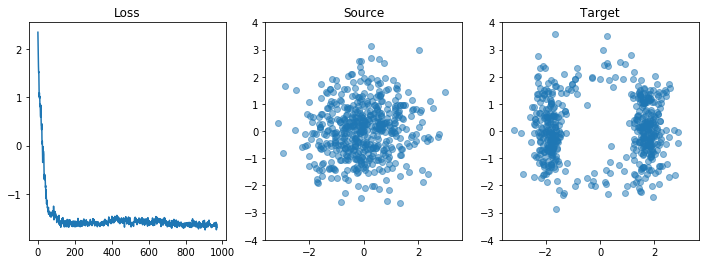








 88%|████████▊ | 971/1100 [08:58<01:36,  1.33it/s]






 88%|████████▊ | 972/1100 [08:59<01:27,  1.46it/s]






 88%|████████▊ | 973/1100 [09:00<01:22,  1.53it/s]






 89%|████████▊ | 974/1100 [09:00<01:18,  1.60it/s]






 89%|████████▊ | 975/1100 [09:01<01:17,  1.62it/s]






 89%|████████▊ | 976/1100 [09:01<01:15,  1.64it/s]






 89%|████████▉ | 977/1100 [09:02<01:11,  1.73it/s]






 89%|████████▉ | 978/1100 [09:02<01:10,  1.73it/s]






 89%|████████▉ | 979/1100 [09:03<01:08,  1.78it/s]






 89%|████████▉ | 980/1100 [09:03<01:06,  1.81it/s]

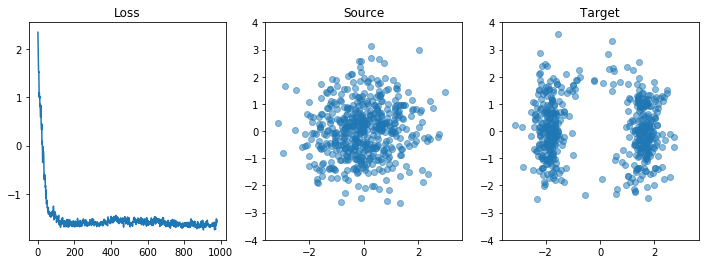








 89%|████████▉ | 981/1100 [09:05<01:26,  1.37it/s]






 89%|████████▉ | 982/1100 [09:05<01:17,  1.51it/s]






 89%|████████▉ | 983/1100 [09:06<01:13,  1.58it/s]






 89%|████████▉ | 984/1100 [09:06<01:11,  1.61it/s]






 90%|████████▉ | 985/1100 [09:07<01:09,  1.64it/s]






 90%|████████▉ | 986/1100 [09:07<01:06,  1.72it/s]






 90%|████████▉ | 987/1100 [09:08<01:06,  1.70it/s]






 90%|████████▉ | 988/1100 [09:09<01:04,  1.73it/s]






 90%|████████▉ | 989/1100 [09:09<01:04,  1.73it/s]






 90%|█████████ | 990/1100 [09:10<01:01,  1.77it/s]

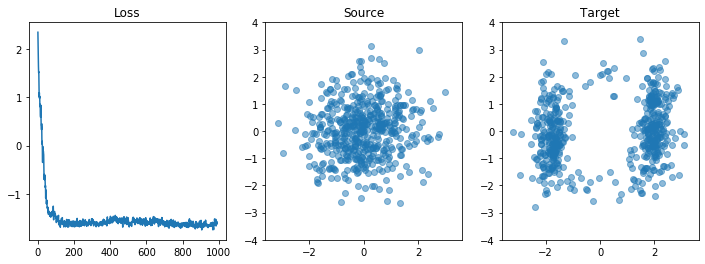








 90%|█████████ | 991/1100 [09:11<01:19,  1.37it/s]






 90%|█████████ | 992/1100 [09:11<01:12,  1.49it/s]






 90%|█████████ | 993/1100 [09:12<01:09,  1.54it/s]






 90%|█████████ | 994/1100 [09:13<01:07,  1.57it/s]






 90%|█████████ | 995/1100 [09:13<01:05,  1.61it/s]






 91%|█████████ | 996/1100 [09:14<01:04,  1.60it/s]






 91%|█████████ | 997/1100 [09:14<01:01,  1.67it/s]






 91%|█████████ | 998/1100 [09:15<01:01,  1.65it/s]






 91%|█████████ | 999/1100 [09:15<01:01,  1.65it/s]






 91%|█████████ | 1000/1100 [09:16<00:59,  1.67it/s]

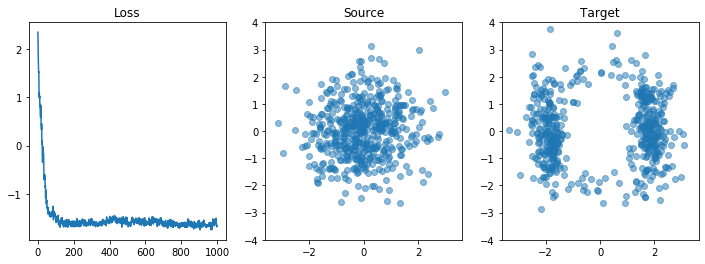








 91%|█████████ | 1001/1100 [09:17<01:16,  1.29it/s]






 91%|█████████ | 1002/1100 [09:18<01:11,  1.38it/s]






 91%|█████████ | 1003/1100 [09:18<01:06,  1.45it/s]






 91%|█████████▏| 1004/1100 [09:19<01:04,  1.50it/s]






 91%|█████████▏| 1005/1100 [09:20<00:59,  1.59it/s]






 91%|█████████▏| 1006/1100 [09:20<00:58,  1.62it/s]






 92%|█████████▏| 1007/1100 [09:21<00:57,  1.63it/s]






 92%|█████████▏| 1008/1100 [09:21<00:55,  1.66it/s]






 92%|█████████▏| 1009/1100 [09:22<00:53,  1.70it/s]






 92%|█████████▏| 1010/1100 [09:23<00:53,  1.69it/s]

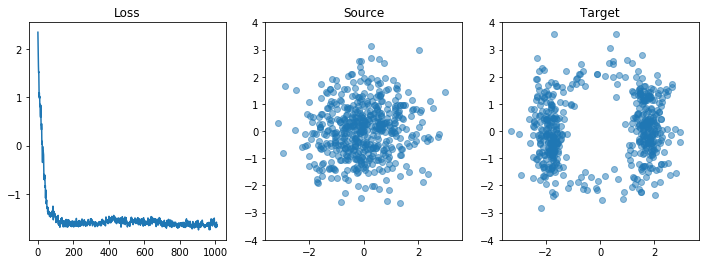








 92%|█████████▏| 1011/1100 [09:24<01:08,  1.31it/s]






 92%|█████████▏| 1012/1100 [09:24<01:03,  1.40it/s]






 92%|█████████▏| 1013/1100 [09:25<00:57,  1.52it/s]






 92%|█████████▏| 1014/1100 [09:25<00:54,  1.57it/s]






 92%|█████████▏| 1015/1100 [09:26<00:52,  1.63it/s]






 92%|█████████▏| 1016/1100 [09:27<00:51,  1.63it/s]






 92%|█████████▏| 1017/1100 [09:27<00:51,  1.63it/s]






 93%|█████████▎| 1018/1100 [09:28<00:48,  1.69it/s]






 93%|█████████▎| 1019/1100 [09:28<00:47,  1.70it/s]






 93%|█████████▎| 1020/1100 [09:29<00:48,  1.67it/s]

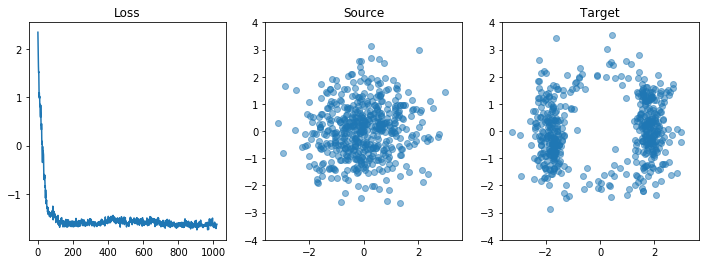








 93%|█████████▎| 1021/1100 [09:30<01:00,  1.30it/s]






 93%|█████████▎| 1022/1100 [09:31<00:57,  1.36it/s]






 93%|█████████▎| 1023/1100 [09:31<00:52,  1.48it/s]






 93%|█████████▎| 1024/1100 [09:32<00:49,  1.53it/s]






 93%|█████████▎| 1025/1100 [09:33<00:47,  1.59it/s]






 93%|█████████▎| 1026/1100 [09:33<00:46,  1.61it/s]






 93%|█████████▎| 1027/1100 [09:34<00:45,  1.62it/s]






 93%|█████████▎| 1028/1100 [09:34<00:43,  1.67it/s]






 94%|█████████▎| 1029/1100 [09:35<00:42,  1.66it/s]






 94%|█████████▎| 1030/1100 [09:35<00:41,  1.70it/s]

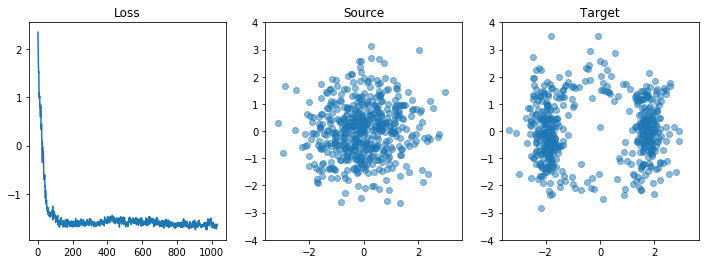








 94%|█████████▎| 1031/1100 [09:37<00:52,  1.32it/s]






 94%|█████████▍| 1032/1100 [09:37<00:48,  1.41it/s]






 94%|█████████▍| 1033/1100 [09:38<00:45,  1.49it/s]






 94%|█████████▍| 1034/1100 [09:38<00:41,  1.59it/s]






 94%|█████████▍| 1035/1100 [09:39<00:39,  1.64it/s]






 94%|█████████▍| 1036/1100 [09:39<00:38,  1.64it/s]






 94%|█████████▍| 1037/1100 [09:40<00:37,  1.70it/s]






 94%|█████████▍| 1038/1100 [09:41<00:36,  1.68it/s]






 94%|█████████▍| 1039/1100 [09:41<00:35,  1.71it/s]






 95%|█████████▍| 1040/1100 [09:42<00:36,  1.65it/s]

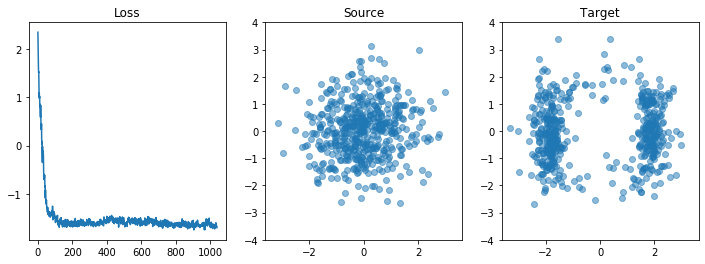








 95%|█████████▍| 1041/1100 [09:43<00:44,  1.32it/s]






 95%|█████████▍| 1042/1100 [09:44<00:41,  1.39it/s]






 95%|█████████▍| 1043/1100 [09:44<00:38,  1.48it/s]






 95%|█████████▍| 1044/1100 [09:45<00:36,  1.53it/s]






 95%|█████████▌| 1045/1100 [09:45<00:35,  1.55it/s]






 95%|█████████▌| 1046/1100 [09:46<00:34,  1.58it/s]






 95%|█████████▌| 1047/1100 [09:47<00:32,  1.62it/s]






 95%|█████████▌| 1048/1100 [09:47<00:32,  1.61it/s]






 95%|█████████▌| 1049/1100 [09:48<00:32,  1.59it/s]






 95%|█████████▌| 1050/1100 [09:48<00:31,  1.61it/s]

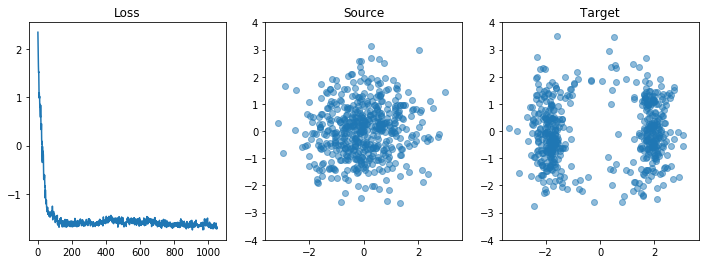








 96%|█████████▌| 1051/1100 [09:50<00:38,  1.27it/s]






 96%|█████████▌| 1052/1100 [09:50<00:35,  1.36it/s]






 96%|█████████▌| 1053/1100 [09:51<00:32,  1.46it/s]






 96%|█████████▌| 1054/1100 [09:51<00:30,  1.51it/s]






 96%|█████████▌| 1055/1100 [09:52<00:29,  1.52it/s]






 96%|█████████▌| 1056/1100 [09:53<00:28,  1.55it/s]






 96%|█████████▌| 1057/1100 [09:53<00:27,  1.56it/s]






 96%|█████████▌| 1058/1100 [09:54<00:27,  1.55it/s]






 96%|█████████▋| 1059/1100 [09:55<00:26,  1.54it/s]






 96%|█████████▋| 1060/1100 [09:55<00:25,  1.56it/s]

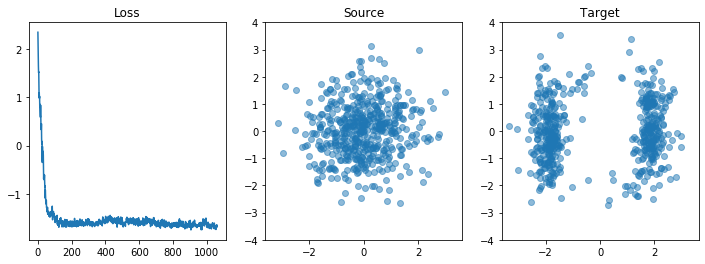








 96%|█████████▋| 1061/1100 [09:56<00:30,  1.28it/s]






 97%|█████████▋| 1062/1100 [09:57<00:26,  1.41it/s]






 97%|█████████▋| 1063/1100 [09:57<00:24,  1.53it/s]






 97%|█████████▋| 1064/1100 [09:58<00:22,  1.59it/s]






 97%|█████████▋| 1065/1100 [09:59<00:22,  1.58it/s]






 97%|█████████▋| 1066/1100 [09:59<00:20,  1.69it/s]






 97%|█████████▋| 1067/1100 [10:00<00:19,  1.67it/s]






 97%|█████████▋| 1068/1100 [10:00<00:19,  1.65it/s]






 97%|█████████▋| 1069/1100 [10:01<00:19,  1.61it/s]






 97%|█████████▋| 1070/1100 [10:02<00:17,  1.67it/s]

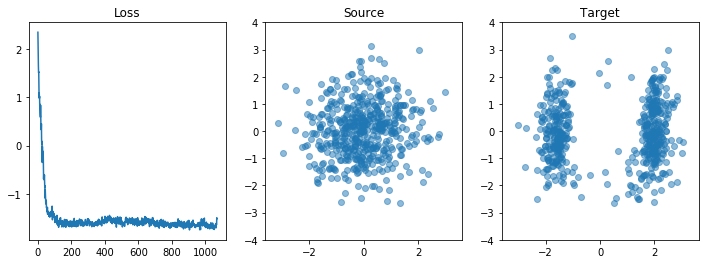








 97%|█████████▋| 1071/1100 [10:03<00:21,  1.34it/s]






 97%|█████████▋| 1072/1100 [10:03<00:19,  1.47it/s]






 98%|█████████▊| 1073/1100 [10:04<00:17,  1.54it/s]






 98%|█████████▊| 1074/1100 [10:04<00:16,  1.61it/s]






 98%|█████████▊| 1075/1100 [10:05<00:15,  1.65it/s]






 98%|█████████▊| 1076/1100 [10:05<00:14,  1.69it/s]






 98%|█████████▊| 1077/1100 [10:06<00:12,  1.77it/s]






 98%|█████████▊| 1078/1100 [10:07<00:12,  1.74it/s]






 98%|█████████▊| 1079/1100 [10:07<00:12,  1.75it/s]






 98%|█████████▊| 1080/1100 [10:08<00:11,  1.68it/s]

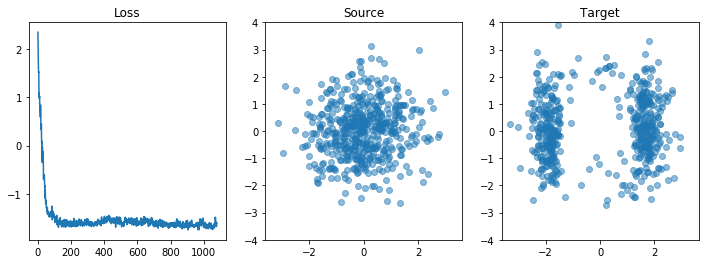








 98%|█████████▊| 1081/1100 [10:09<00:14,  1.31it/s]






 98%|█████████▊| 1082/1100 [10:10<00:13,  1.35it/s]






 98%|█████████▊| 1083/1100 [10:10<00:11,  1.46it/s]






 99%|█████████▊| 1084/1100 [10:11<00:10,  1.48it/s]






 99%|█████████▊| 1085/1100 [10:11<00:10,  1.50it/s]






 99%|█████████▊| 1086/1100 [10:12<00:09,  1.52it/s]






 99%|█████████▉| 1087/1100 [10:13<00:08,  1.48it/s]






 99%|█████████▉| 1088/1100 [10:13<00:07,  1.51it/s]






 99%|█████████▉| 1089/1100 [10:14<00:06,  1.63it/s]






 99%|█████████▉| 1090/1100 [10:15<00:06,  1.65it/s]

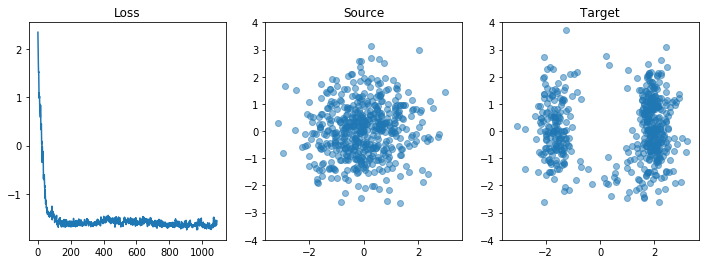








 99%|█████████▉| 1091/1100 [10:16<00:06,  1.33it/s]






 99%|█████████▉| 1092/1100 [10:16<00:05,  1.46it/s]






 99%|█████████▉| 1093/1100 [10:17<00:04,  1.55it/s]






 99%|█████████▉| 1094/1100 [10:17<00:03,  1.61it/s]






100%|█████████▉| 1095/1100 [10:18<00:03,  1.66it/s]






100%|█████████▉| 1096/1100 [10:18<00:02,  1.71it/s]






100%|█████████▉| 1097/1100 [10:19<00:01,  1.72it/s]






100%|█████████▉| 1098/1100 [10:20<00:01,  1.71it/s]






100%|█████████▉| 1099/1100 [10:20<00:00,  1.71it/s]






100%|██████████| 1100/1100 [10:21<00:00,  1.77it/s]


In [132]:
loss_history = []
for step in tqdm(range(1100)):
    # ^ should actuall train for 10k iters for paper
    optimizer.zero_grad()
    
    z0 = norm.sample([num_samples]).to(device)
    logp_z0 = norm.log_prob(z0).unsqueeze(dim=-1).to(device)
    
    loss = calc_loss(z0, logp_z0)
    loss_history.append(loss.item())
    
    loss.backward()
    optimizer.step()
    
    if step % 10 == 0:
        z_t, logp_diff_t = odeint(
            odefunc,
            (z0_test, logp_z0_test),
            torch.tensor([t0, t1]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

        x, logp_x = z_t[-1], logp_diff_t[-1]
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(131)
        plt.title("Loss")
        plt.plot(loss_history)
        
        plt.subplot(132)
        plt.title("Source")
        plt.scatter(*z0_test.detach().cpu().numpy().T, alpha=0.5)   
        plt.axis("equal")
        plt.xlim([-4, 4])
        plt.ylim([-4, 4])
        
        plt.subplot(133)        
        plt.title("Target")
        plt.scatter(*x.detach().cpu().numpy().T, alpha=0.5)   
        plt.axis("equal")        
        plt.xlim([-4, 4])
        plt.ylim([-4, 4])
        
        plt.savefig(f"cnfs/training/step_{1000 + step}.jpg")
        plt.show()
        plt.clf()
        plt.cla()
        plt.close()

### Final PDF

In [133]:
torch.cuda.empty_cache()

torch.Size([360000, 1])


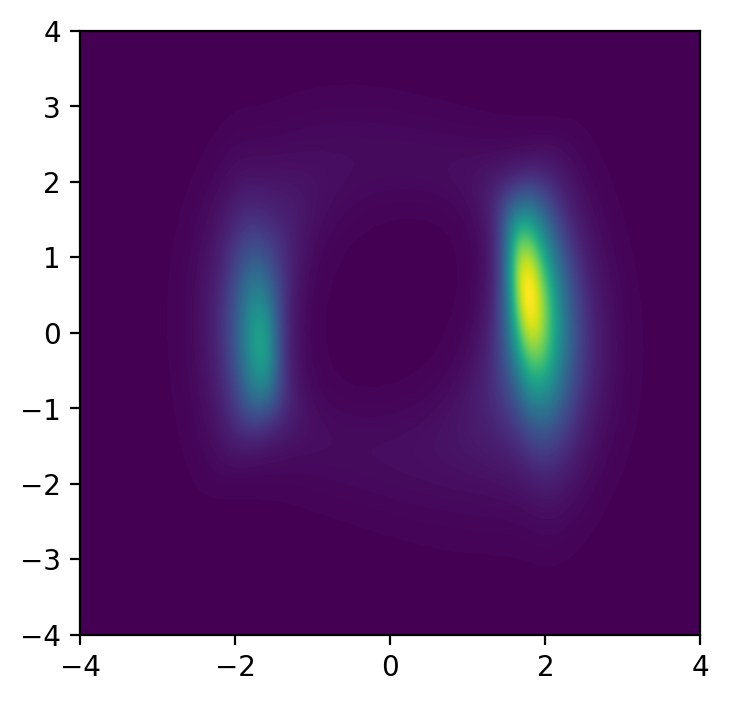

In [134]:
x = np.linspace(-6, 6, 600)
y = np.linspace(-6, 6, 600)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t0 = torch.tensor(points).type(torch.float32).to(device)
logp_t0 = norm.log_prob(z_t0).unsqueeze(dim=-1).to(device)

z_t, logp_t = odeint(
    odefunc,
    (z_t0, logp_t0),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

z_t1, logp_t1 = z_t[-1], logp_t[-1]


print(logp_t1.shape)

plt.figure(figsize=(4, 4), dpi=200)
plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp_t1.view(-1).detach().cpu().numpy()),
                200)
plt.xlim([-4, 4])
plt.ylim([-4, 4])
plt.show()

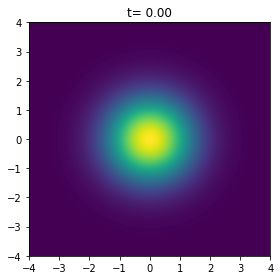

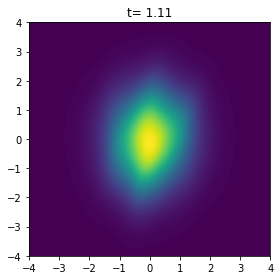

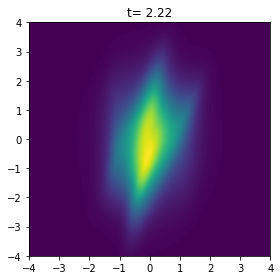

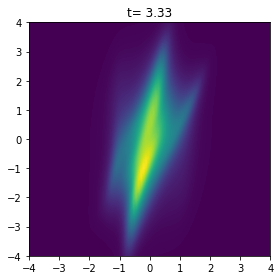

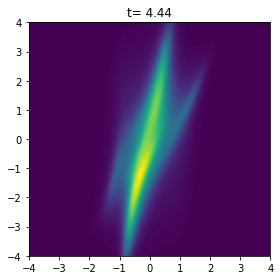

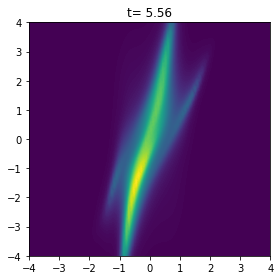

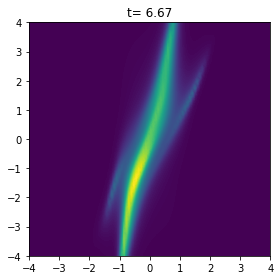

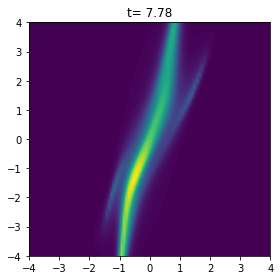

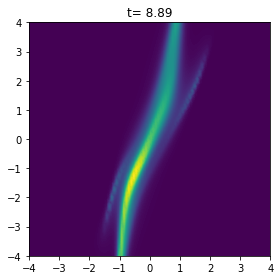

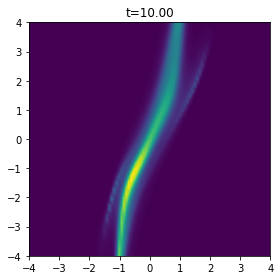

In [72]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t1 = torch.tensor(points).type(torch.float32).to(device)
logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device) 

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t1, logp_diff_t1),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

for step, (t, z, logp_diff) in enumerate(zip(np.linspace(t0, t1, 10), z_t, logp_diff_t)):

    
    logp = norm.log_prob(z) - logp_diff.view(-1)

    plt.figure(figsize=(4, 4))
    plt.title(f"t={t:5.2f}")
    plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp.detach().cpu().numpy()), 200)
    plt.tight_layout()
    plt.show()
    plt.savefig(f"cnfs/density/step_{1000 + step}.jpg")
    plt.close()

### Generate diagrams of the potentials

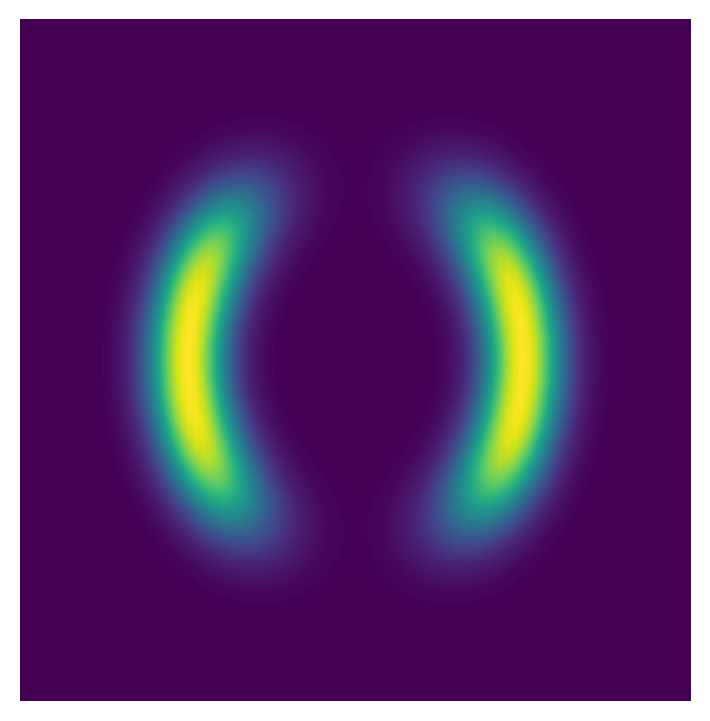

In [19]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

probs = energy_function_1(torch.tensor(points).type(torch.float32)).numpy()
plt.figure(figsize=(4, 4), dpi=200)

plt.tricontourf(points[:, 0], points[:, 1], np.exp(-probs)[:,0], 200)

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/potential1.jpg",
            pad_inches=0, bbox_inches='tight')
# plt.show()